# SWB Mood Bandpow Regressions
- beta, theta, hfa first

*Created:* 10/05/2024 \
*Updated:* 11/19/2024 


In [1]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM 
from joblib import Parallel, delayed
import pickle
import itertools
import time 
from matplotlib.ticker import StrMethodFormatter
import sys


import warnings
warnings.filterwarnings('ignore')




In [2]:
# Specify root directory for un-archived data and results 
base_dir   = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/'
anat_dir   = f'{base_dir}recon_labels/'
neural_dir = f'{base_dir}data/'
behav_dir  = f'{base_dir}behav/'
save_dir   = f'{base_dir}results/mood_results/'

os.makedirs(save_dir,exist_ok=True)

date = datetime.date.today().strftime('%m%d%Y')
print(date)

11202024


In [449]:
%load_ext autoreload
%autoreload 2


sys.path.append(f'{base_dir}LFPAnalysis/')

from LFPAnalysis import analysis_utils

script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'
sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *
from plot_tools import *

sys.path.append(f'{script_dir}behav/')

from behav_utils import *
from swb_subj_behav import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [592]:
subj_ids = list(pd.read_excel(f'{base_dir}subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
# subj_ids


In [ ]:

#### set theme for all plots
# %matplotlib inline
# from matplotlib import rc
# rc('text', usetex=False)

# sns.set_theme(style='ticks') 
# sns.set_context("talk")

# from matplotlib.colors import ListedColormap,LinearSegmentedColormap
# import matplotlib as mpl
# from matplotlib import cm


# # saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# # 671351
# saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
# saez_hex_cmap  = ListedColormap(saez_colors)
# saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
# saez_full_cmap = LinearSegmentedColormap.from_list('saez_full_cmap',saez_rgb,N=10)
# #plot_palette = saez_linear_cmap.resampled(lutsize=30)
# expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


In [ ]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# temp_behav,beh_drops = format_all_behav(raw_behav,return_drops=True,norm=False)

# beh_drops
# all_orthog_rpe  = []
# all_rpe_cpe_rsq = []
# behav_list = []

# for ix, subj_id in enumerate(subj_ids): 
# #     subj_df = raw_behav[ix]
#     subj_df = temp_behav[temp_behav.subj_id==subj_id].reset_index(drop=True)
#     # find indices where cpe is not nan
#     notnan_idx = [ix for ix,cpe in enumerate(subj_df.cpe) if not np.isnan(cpe)]
#     # initialize save vector
#     subj_df['orthog_rpe'] = np.nan
#     # run ols regression rpe ~ cpe
#     rpe_cpe = sm.OLS(subj_df.rpe,sm.add_constant(subj_df.cpe),missing='drop').fit()
#     all_rpe_cpe_rsq.append(rpe_cpe.rsquared)
#     subj_df['orthog_rpe'][notnan_idx] = rpe_cpe.resid
#     all_orthog_rpe.extend(subj_df['orthog_rpe'])
#     behav_list.append(subj_df)
#     # del rpe_cpe 
    
# # all_behav['orthog_rpe'] = all_orthog_rpe

# all_behav,beh_drops = format_all_behav(behav_list,return_drops=True,norm=True)



In [27]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)
# del raw_behav
# # beh_drops
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)

# raw_mood = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_mood_df.csv') for subj_id in subj_ids]
# all_mood, mood_drops = format_all_mood(raw_mood, all_behav, return_drops=True, drop_bads=False)


# Load Mood Epochs dfs

In [291]:
band = 'beta'

mood_pow_df = pd.read_csv(f'{save_dir}regression_dfs/{band}_mood_epochs_df.csv')
# mood_pow_df.head()
mood_pow_df

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch
0,0,0,-0.5,20.743342,lacas1-lacas2,-0.166469,beta,MS002,14,low,...,0.759848,1.461373,-0.892581,-0.795008,5.310698,545.592613,0.277664,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,20.743342,lacas1-lacas2,0.013476,beta,MS002,14,low,...,-0.920262,1.241834,0.802754,0.875934,3.432630,577.049490,0.277664,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,20.743342,lacas1-lacas2,-0.045186,beta,MS002,14,low,...,-0.674991,-1.441430,0.266101,-1.185300,3.599831,609.642231,0.134538,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,20.743342,lacas1-lacas2,-0.215742,beta,MS002,14,low,...,0.428731,-1.197497,0.680788,-0.465698,3.984104,643.713750,0.420789,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,20.743342,lacas1-lacas2,-0.054737,beta,MS002,14,low,...,0.060824,1.729700,-0.831598,-0.831598,4.350371,677.264040,0.420789,acc,l,MS002_lacas1-lacas2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93995,93995,45,-0.5,20.743342,rvmot6-rvmot7,0.504584,beta,DA039,22,high,...,0.915739,NaN,0.314126,-0.772921,2.773696,2180.513505,-0.524890,motor,r,DA039_rvmot6-rvmot7
93996,93996,46,-0.5,20.743342,rvmot6-rvmot7,-0.334335,beta,DA039,22,high,...,-0.014353,-0.652138,1.835992,-0.289789,3.061470,2215.197736,-0.524890,motor,r,DA039_rvmot6-rvmot7
93997,93997,47,-0.5,20.743342,rvmot6-rvmot7,-0.164107,beta,DA039,22,high,...,NaN,1.111294,1.884306,NaN,3.447751,2251.180979,0.330135,motor,r,DA039_rvmot6-rvmot7
93998,93998,48,-0.5,20.743342,rvmot6-rvmot7,0.066859,beta,DA039,22,high,...,0.760724,1.763523,1.497800,-0.652138,4.503968,2282.349445,1.441667,motor,r,DA039_rvmot6-rvmot7


In [292]:
np.sum(mood_pow_df.keep_mood=='drop')

2362

In [293]:
mood_pow_df= mood_pow_df[mood_pow_df.keep_mood=='keep'].reset_index(drop=True)
mood_pow_df

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch
0,0,0,-0.5,20.743342,lacas1-lacas2,-0.166469,beta,MS002,14,low,...,0.759848,1.461373,-0.892581,-0.795008,5.310698,545.592613,0.277664,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,20.743342,lacas1-lacas2,0.013476,beta,MS002,14,low,...,-0.920262,1.241834,0.802754,0.875934,3.432630,577.049490,0.277664,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,20.743342,lacas1-lacas2,-0.045186,beta,MS002,14,low,...,-0.674991,-1.441430,0.266101,-1.185300,3.599831,609.642231,0.134538,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,20.743342,lacas1-lacas2,-0.215742,beta,MS002,14,low,...,0.428731,-1.197497,0.680788,-0.465698,3.984104,643.713750,0.420789,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,20.743342,lacas1-lacas2,-0.054737,beta,MS002,14,low,...,0.060824,1.729700,-0.831598,-0.831598,4.350371,677.264040,0.420789,acc,l,MS002_lacas1-lacas2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91633,93995,45,-0.5,20.743342,rvmot6-rvmot7,0.504584,beta,DA039,22,high,...,0.915739,NaN,0.314126,-0.772921,2.773696,2180.513505,-0.524890,motor,r,DA039_rvmot6-rvmot7
91634,93996,46,-0.5,20.743342,rvmot6-rvmot7,-0.334335,beta,DA039,22,high,...,-0.014353,-0.652138,1.835992,-0.289789,3.061470,2215.197736,-0.524890,motor,r,DA039_rvmot6-rvmot7
91635,93997,47,-0.5,20.743342,rvmot6-rvmot7,-0.164107,beta,DA039,22,high,...,NaN,1.111294,1.884306,NaN,3.447751,2251.180979,0.330135,motor,r,DA039_rvmot6-rvmot7
91636,93998,48,-0.5,20.743342,rvmot6-rvmot7,0.066859,beta,DA039,22,high,...,0.760724,1.763523,1.497800,-0.652138,4.503968,2282.349445,1.441667,motor,r,DA039_rvmot6-rvmot7


In [294]:
keep_rois = ['dlpfc','vlpfc','dmpfc','ofc','ains','acc','amy','hpc']     
mood_pow_df = mood_pow_df[mood_pow_df.roi.isin(keep_rois)].reset_index(drop=True)


# Electrode-wise Regressions

In [295]:
mood_pow_df.columns

Index(['Unnamed: 0', 'epoch', 'time', 'freq', 'reref_ch_names', 'band_pow',
       'band', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'Rating',
       'RatingOnset', 'RT', 'Round_t1_idx', 'Round_t2_idx', 'Round_t3_idx',
       'epoch_t1_idx', 'epoch_t2_idx', 'epoch_t3_idx', 'keep_mood', 'logRT',
       'MoodChoiceOnset', 'SafeBet_t1', 'SafeBet_t2', 'SafeBet_t3',
       'LowBet_t1', 'LowBet_t2', 'LowBet_t3', 'HighBet_t1', 'HighBet_t2',
       'HighBet_t3', 'Profit_t1', 'Profit_t2', 'Profit_t3', 'TotalProfit_t1',
       'TotalProfit_t2', 'TotalProfit_t3', 'GambleEV_t1', 'GambleEV_t2',
       'GambleEV_t3', 'TrialEV_t1', 'TrialEV_t2', 'TrialEV_t3', 'CR_t1',
       'CR_t2', 'CR_t3', 'choiceEV_t1', 'choiceEV_t2', 'choiceEV_t3', 'rpe_t1',
       'rpe_t2', 'rpe_t3', 'cf_t1', 'cf_t2', 'cf_t3', 'cpe_t1', 'cpe_t2',
       'cpe_t3', 'mood_epoch_len', 'next_round_start', 'norm_mood', 'roi',
       'hemi', 'unique_reref_ch'],
      dtype='object')

In [296]:
# define interaction vector
mood_pow_df['mood_cpe_int'] = np.multiply(mood_pow_df['norm_mood'],mood_pow_df['cpe_t1'])
mood_pow_df['mood_rpe_int'] = np.multiply(mood_pow_df['norm_mood'],mood_pow_df['rpe_t1'])

# remove nans and null values from df 
mood_pow_df = mood_pow_df[~mood_pow_df.norm_mood.isnull()]
# mood_pow_df = mood_pow_df[~mood_pow_df.cpe_t1.isnull()]
# mood_pow_df = mood_pow_df[~mood_pow_df.band_pow.isnull()]
# mood_pow_df = mood_pow_df[~mood_pow_df.mood_cpe_int.isnull()]
mood_pow_df = mood_pow_df.reset_index(drop=True)

In [297]:
elec_col    = 'unique_reref_ch'

# reg_formula = 'band_pow~norm_mood+cpe_t1+mood_cpe_int'
# reg_formula = 'band_pow~norm_mood+TrialEV_t1+Profit_t1+rpe_t1+cpe_t1+mood_cpe_int'
# reg_formula = 'band_pow~norm_mood+Profit_t1+rpe_t1+cpe_t1+mood_cpe_int'
# reg_formula = 'band_pow~norm_mood+TrialEV_t1+Profit_t1+rpe_t1+cpe_t1'
# reg_formula = 'band_pow~norm_mood+rpe_t1+cpe_t1'
reg_formula = 'band_pow~norm_mood+rpe_t1+cpe_t1+mood_rpe_int+mood_cpe_int'

# reg_formula = 'norm_mood~band_pow+cpe_t1'
# reg_formula = 'norm_mood~band_pow+cpe_t1+band_pow:cpe_t1'
# reg_formula = 'norm_mood~band_pow+TrialEV_t1+Profit_t1+rpe_t1+cpe_t1'
n_permutations = 1000


In [298]:
results_dict = run_individual_elec_regression(mood_pow_df,reg_formula,elec_col,n_permutations)


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 10543.25it/s]


In [299]:
save_vars = results_dict['MS002_lacas1-lacas2'].index.tolist()
save_vars


['Intercept', 'norm_mood', 'rpe_t1', 'cpe_t1', 'mood_rpe_int', 'mood_cpe_int']

In [300]:
results = single_elec_permutation_results(results_dict,mood_pow_df,save_vars)
results



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_rpe_t1,Original_Estimate_cpe_t1,Original_Estimate_mood_rpe_int,Original_Estimate_mood_cpe_int,...,Z_Score_rpe_t1,Z_Score_cpe_t1,Z_Score_mood_rpe_int,Z_Score_mood_cpe_int,P_Value_Intercept,P_Value_norm_mood,P_Value_rpe_t1,P_Value_cpe_t1,P_Value_mood_rpe_int,P_Value_mood_cpe_int
0,MS002_lacas1-lacas2,MS002,acc,14,-0.000996,-0.004439,-0.035565,0.045123,-0.051402,0.003539,...,-0.831022,1.020255,-1.143454,0.054944,0.127271,0.882136,0.405961,0.307607,0.252850,0.956183
1,MS002_lacas2-lacas3,MS002,acc,14,-0.023423,0.035632,0.001589,-0.047014,-0.059128,0.059609,...,0.045415,-1.152710,-1.456559,1.499651,0.407949,0.319988,0.963777,0.249029,0.145238,0.133705
2,MS002_lacas3-lacas4,MS002,acc,14,-0.021149,0.009597,-0.013827,0.016200,0.054260,-0.044692,...,-0.362210,0.448938,1.399890,-1.159084,0.289540,0.811622,0.717195,0.653476,0.161546,0.246422
3,MS002_lacas4-lacas5,MS002,acc,14,-0.002943,0.026807,0.086308,0.016234,0.016766,-0.003711,...,2.060227,0.357948,0.382362,-0.130197,0.771832,0.543815,0.039377,0.720382,0.702193,0.896410
4,MS002_lacas5-lacas6,MS002,acc,14,-0.051214,0.090728,-0.037395,0.003302,0.033445,0.005844,...,-1.125560,0.073993,0.901179,0.137859,0.148417,0.003868,0.260352,0.941016,0.367493,0.890352
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,DA039_rof9-rof10,DA039,dlpfc,22,-0.061153,0.009201,-0.026977,0.054181,-0.021305,0.027522,...,-0.663399,1.133035,-0.508109,0.636408,0.449879,0.745139,0.507075,0.257200,0.611377,0.524510
988,DA039_rof10-rof11,DA039,dlpfc,22,-0.112566,-0.021441,-0.097710,0.170490,0.026359,0.019655,...,-1.783491,2.986574,0.480124,0.411824,0.086215,0.500819,0.074506,0.002821,0.631140,0.680468
989,DA039_rof11-rof12,DA039,dlpfc,22,-0.055442,-0.005883,-0.029399,0.047239,0.008273,-0.004601,...,-2.499956,3.549246,0.774290,-0.468526,0.300224,0.433999,0.012421,0.000386,0.438760,0.639409
990,DA039_rsgcc6-rsgcc7,DA039,vlpfc,22,-0.054862,-0.035194,-0.074882,0.116811,-0.106258,0.156150,...,-1.154547,1.635664,-1.612021,2.437558,0.012464,0.386294,0.248276,0.101910,0.106957,0.014787


In [301]:
results.columns



Index(['unique_elec_id', 'subj_id', 'roi', 'bdi',
       'Original_Estimate_Intercept', 'Original_Estimate_norm_mood',
       'Original_Estimate_rpe_t1', 'Original_Estimate_cpe_t1',
       'Original_Estimate_mood_rpe_int', 'Original_Estimate_mood_cpe_int',
       'Permuted_Mean_Intercept', 'Permuted_Mean_norm_mood',
       'Permuted_Mean_rpe_t1', 'Permuted_Mean_cpe_t1',
       'Permuted_Mean_mood_rpe_int', 'Permuted_Mean_mood_cpe_int',
       'Permuted_Std_Intercept', 'Permuted_Std_norm_mood',
       'Permuted_Std_rpe_t1', 'Permuted_Std_cpe_t1',
       'Permuted_Std_mood_rpe_int', 'Permuted_Std_mood_cpe_int',
       'Z_Score_Intercept', 'Z_Score_norm_mood', 'Z_Score_rpe_t1',
       'Z_Score_cpe_t1', 'Z_Score_mood_rpe_int', 'Z_Score_mood_cpe_int',
       'P_Value_Intercept', 'P_Value_norm_mood', 'P_Value_rpe_t1',
       'P_Value_cpe_t1', 'P_Value_mood_rpe_int', 'P_Value_mood_cpe_int'],
      dtype='object')

### Save results as pickle file

In [290]:
# save_path = f'{save_dir}/{band}/'
# os.makedirs(save_path, exist_ok=True)

# fname = f'{save_path}{band}_perm_regression_results_{epoch_len}.pkl'
# pickle.dump(results, open(fname,"wb"))


### ROI Significance Testing
- % of sig elecs in ROI (also split by BDI)
- binomial test for whether sig proportion of elecs in ROI 
- ttests from zero 


In [302]:
# add mask col for sig cpe elecs 
results['norm_mood_sig']    = results['P_Value_norm_mood'].apply(lambda x: 0 if x > 0.05 else 1)
# results['TrialEV_t1_sig']   = results['P_Value_TrialEV_t1'].apply(lambda x: 0 if x > 0.05 else 1)
# results['Profit_t1_sig']    = results['P_Value_Profit_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['rpe_t1_sig']       = results['P_Value_rpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['cpe_t1_sig']       = results['P_Value_cpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
# results['band_pow_sig']    = results['P_Value_band_pow'].apply(lambda x: 0 if x > 0.05 else 1)
results['mood_cpe_int_sig'] = results['P_Value_mood_cpe_int'].apply(lambda x: 0 if x > 0.05 else 1)
results['mood_rpe_int_sig'] = results['P_Value_mood_rpe_int'].apply(lambda x: 0 if x > 0.05 else 1)
results['bdi_split']        = results['bdi'].apply(lambda x: 0 if x < 20 else 1)

results.head()

# results.to_csv(f'{save_path}{band}_perm_regression_results_df_{epoch_len}.csv')

,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_rpe_t1,Original_Estimate_cpe_t1,Original_Estimate_mood_rpe_int,Original_Estimate_mood_cpe_int,...,P_Value_rpe_t1,P_Value_cpe_t1,P_Value_mood_rpe_int,P_Value_mood_cpe_int,norm_mood_sig,rpe_t1_sig,cpe_t1_sig,mood_cpe_int_sig,mood_rpe_int_sig,bdi_split
0,MS002_lacas1-lacas2,MS002,acc,14,-0.000996,-0.004439,-0.035565,0.045123,-0.051402,0.003539,...,0.405961,0.307607,0.252850,0.956183,0,0,0,0,0,0
1,MS002_lacas2-lacas3,MS002,acc,14,-0.023423,0.035632,0.001589,-0.047014,-0.059128,0.059609,...,0.963777,0.249029,0.145238,0.133705,0,0,0,0,0,0
2,MS002_lacas3-lacas4,MS002,acc,14,-0.021149,0.009597,-0.013827,0.016200,0.054260,-0.044692,...,0.717195,0.653476,0.161546,0.246422,0,0,0,0,0,0
3,MS002_lacas4-lacas5,MS002,acc,14,-0.002943,0.026807,0.086308,0.016234,0.016766,-0.003711,...,0.039377,0.720382,0.702193,0.896410,0,1,0,0,0,0
4,MS002_lacas5-lacas6,MS002,acc,14,-0.051214,0.090728,-0.037395,0.003302,0.033445,0.005844,...,0.260352,0.941016,0.367493,0.890352,1,0,0,0,0,0


In [303]:
# reg_vars = ['Z_Score_TrialEV_t1','Z_Score_Profit_t1','Z_Score_rpe_t1','Z_Score_norm_mood','Z_Score_cpe_t1','Z_Score_mood_cpe_int']
# reg_vars = ['Z_Score_Profit_t1','Z_Score_rpe_t1','Z_Score_norm_mood','Z_Score_cpe_t1','Z_Score_mood_cpe_int']
reg_vars = ['Z_Score_norm_mood','Z_Score_rpe_t1','Z_Score_cpe_t1','Z_Score_mood_rpe_int','Z_Score_mood_cpe_int']
# reg_vars = ['Z_Score_band_pow','Z_Score_cpe_t1']


In [304]:
roi_results
# roi_results.columns

,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_norm_mood,Original_Estimate_rpe_t1,Original_Estimate_cpe_t1,Permuted_Mean_Intercept,Permuted_Mean_norm_mood,...,Z_Score_rpe_t1,Z_Score_cpe_t1,P_Value_Intercept,P_Value_norm_mood,P_Value_rpe_t1,P_Value_cpe_t1,norm_mood_sig,rpe_t1_sig,cpe_t1_sig,bdi_split
38,MS002_lpips9-lpips10,MS002,dlpfc,14,-0.103135,0.038721,0.021268,-0.009863,-0.103471,0.002958,...,0.468174,-0.173547,0.658706,0.421468,0.639660,0.862222,0,0,0,0
39,MS002_lpips10-lpips11,MS002,dlpfc,14,0.028683,0.120536,0.031126,-0.086432,0.028794,0.004784,...,0.483485,-1.138325,0.919252,0.079744,0.628751,0.254985,0,0,0,0
40,MS002_lpips11-lpips12,MS002,dlpfc,14,0.025949,0.093395,0.081747,-0.122137,0.025494,0.002259,...,1.093930,-1.534784,0.697405,0.210122,0.273986,0.124837,0,0,0,0
58,MS002_raims10-raims11,MS002,dlpfc,14,-0.028570,0.016605,0.081277,-0.066874,-0.029482,-0.000050,...,2.316601,-1.831829,0.102705,0.629945,0.020525,0.066977,0,1,0,0
59,MS002_raims11-raims12,MS002,dlpfc,14,0.008703,0.056840,-0.022409,-0.056825,0.009570,0.000595,...,-0.560200,-1.443924,0.146406,0.120028,0.575343,0.148760,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,DA039_rof6-rof7,DA039,dlpfc,22,-0.048891,-0.007740,-0.031185,0.058934,-0.046314,-0.000414,...,-0.833261,1.453978,0.709527,0.758238,0.404698,0.145952,0,0,0,1
986,DA039_rof8-rof9,DA039,dlpfc,22,-0.052034,-0.054207,-0.103353,0.151270,-0.040782,-0.002331,...,-1.930479,2.586536,0.265639,0.121302,0.053548,0.009695,0,0,1,1
987,DA039_rof9-rof10,DA039,dlpfc,22,-0.056936,0.008271,-0.037803,0.064683,-0.052710,-0.000105,...,-0.915515,1.424606,0.575542,0.755678,0.359921,0.154271,0,0,0,1
988,DA039_rof10-rof11,DA039,dlpfc,22,-0.098576,-0.024596,-0.095611,0.156919,-0.088304,-0.001188,...,-1.919670,2.809451,0.277833,0.454485,0.054900,0.004963,0,0,1,1


In [305]:
roi_sig_info = []
    
for roi in results.roi.unique().tolist():
    roi_results = results[results.roi==roi]
    roi_df = []
    for var in reg_vars:
        if (var == 'Z_Score_mood_cpe_int') | (var == 'Z_Score_mood_rpe_int'):
            var_sig = ('_').join([var.split('_')[-3],var.split('_')[-2],var.split('_')[-1],'sig'])
        else: 
            var_sig = ('_').join([var.split('_')[-2],var.split('_')[-1],'sig'])
        # ttest from zero 
        ttest_stat,ttest_pval = ttest_1samp(roi_results[var],popmean=0)
        # binomial test for significance 
        n = len(roi_results)
        x = np.sum(roi_results[var_sig])
        binom_test = scipy.stats.binomtest(x, n, p=0.05, alternative='greater')
        binom_pval = binom_test.pvalue
        binom_prop = binom_test.statistic
        ci_low     = binom_test.proportion_ci(confidence_level=0.95).low
        ci_high    = binom_test.proportion_ci(confidence_level=0.95).high
        
        # agg results 
        roi_df.append(pd.DataFrame({'roi':roi,'var_id':var,'n_total':n,'n_sig':x,'prop_sig':np.divide(x,n),
                                          'n_sig_highbdi':np.sum(roi_results[roi_results.bdi_split==1][var_sig]),
                                          'ttest_stat':ttest_stat,'ttest_pval':ttest_pval,
                                          'binom_ci_low':ci_low,'binom_ci_high':ci_high,
                                          'binom_prop':binom_prop,'binom_pval':np.round(binom_pval,4)},index=[0]))
    
    roi_df = pd.concat(roi_df).reset_index(drop=True)
    roi_sig_info.append(roi_df)

roi_sig_info = pd.concat(roi_sig_info).reset_index(drop=True)

In [306]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_norm_mood']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_norm_mood,167,18,0.107784,2,1.201340,0.231330,0.070832,1.0,0.107784,0.0019
5,dmpfc,Z_Score_norm_mood,193,19,0.098446,11,-1.847226,0.066253,0.065429,1.0,0.098446,0.0040
10,amy,Z_Score_norm_mood,102,8,0.078431,1,2.065390,0.041447,0.039624,1.0,0.078431,0.1387
15,ains,Z_Score_norm_mood,57,1,0.017544,0,0.950486,0.345950,0.000899,1.0,0.017544,0.9463
20,vlpfc,Z_Score_norm_mood,75,6,0.080000,1,1.203727,0.232532,0.035413,1.0,0.080000,0.1724
25,hpc,Z_Score_norm_mood,124,10,0.080645,2,0.580928,0.562352,0.044404,1.0,0.080645,0.0929
30,ofc,Z_Score_norm_mood,179,13,0.072626,5,0.322818,0.747212,0.043490,1.0,0.072626,0.1150
35,dlpfc,Z_Score_norm_mood,95,14,0.147368,6,-2.209498,0.029569,0.091348,1.0,0.147368,0.0003


In [271]:
# roi_sig_info[roi_sig_info.var_id=='Z_Score_TrialEV_t1']

In [272]:
# roi_sig_info[roi_sig_info.var_id=='Z_Score_Profit_t1']

In [307]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_rpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
1,acc,Z_Score_rpe_t1,167,10,0.059880,3,-0.485456,0.627993,0.032843,1.0,0.059880,0.3254
6,dmpfc,Z_Score_rpe_t1,193,14,0.072539,3,0.606247,0.545067,0.044384,1.0,0.072539,0.1058
11,amy,Z_Score_rpe_t1,102,10,0.098039,2,0.106054,0.915750,0.054159,1.0,0.098039,0.0318
16,ains,Z_Score_rpe_t1,57,5,0.087719,2,1.147407,0.256092,0.035202,1.0,0.087719,0.1554
21,vlpfc,Z_Score_rpe_t1,75,5,0.066667,2,0.253913,0.800267,0.026634,1.0,0.066667,0.3211
26,hpc,Z_Score_rpe_t1,124,8,0.064516,3,-0.289894,0.772385,0.032504,1.0,0.064516,0.2810
31,ofc,Z_Score_rpe_t1,179,13,0.072626,4,-0.897590,0.370617,0.043490,1.0,0.072626,0.1150
36,dlpfc,Z_Score_rpe_t1,95,6,0.063158,2,0.690066,0.491853,0.027860,1.0,0.063158,0.3391


In [308]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_cpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
2,acc,Z_Score_cpe_t1,167,5,0.029940,3,0.807321,0.420637,0.011870,1.0,0.029940,0.9240
7,dmpfc,Z_Score_cpe_t1,193,20,0.103627,4,-2.118889,0.035385,0.069740,1.0,0.103627,0.0018
12,amy,Z_Score_cpe_t1,102,6,0.058824,3,-0.453818,0.650934,0.025925,1.0,0.058824,0.4020
17,ains,Z_Score_cpe_t1,57,3,0.052632,1,-1.280315,0.205712,0.014497,1.0,0.052632,0.5475
22,vlpfc,Z_Score_cpe_t1,75,9,0.120000,4,-0.201796,0.840630,0.064051,1.0,0.120000,0.0124
27,hpc,Z_Score_cpe_t1,124,11,0.088710,3,-0.675651,0.500531,0.050546,1.0,0.088710,0.0469
32,ofc,Z_Score_cpe_t1,179,13,0.072626,4,-0.165625,0.868640,0.043490,1.0,0.072626,0.1150
37,dlpfc,Z_Score_cpe_t1,95,8,0.084211,6,0.232558,0.816610,0.042592,1.0,0.084211,0.1032


In [309]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_mood_rpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
3,acc,Z_Score_mood_rpe_int,167,7,0.041916,3,-1.449385,0.149117,0.019835,1.0,0.041916,0.7342
8,dmpfc,Z_Score_mood_rpe_int,193,11,0.056995,2,-1.079302,0.281807,0.032288,1.0,0.056995,0.3721
13,amy,Z_Score_mood_rpe_int,102,11,0.107843,4,0.146912,0.883494,0.061666,1.0,0.107843,0.0132
18,ains,Z_Score_mood_rpe_int,57,2,0.035088,2,-0.002696,0.997858,0.006270,1.0,0.035088,0.7851
23,vlpfc,Z_Score_mood_rpe_int,75,7,0.093333,4,-2.228147,0.028909,0.044628,1.0,0.093333,0.0810
28,hpc,Z_Score_mood_rpe_int,124,12,0.096774,1,-2.504572,0.013568,0.056794,1.0,0.096774,0.0218
33,ofc,Z_Score_mood_rpe_int,179,17,0.094972,8,-0.477028,0.633927,0.061420,1.0,0.094972,0.0088
38,dlpfc,Z_Score_mood_rpe_int,95,7,0.073684,3,-1.115027,0.267682,0.035091,1.0,0.073684,0.1977


In [310]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_mood_cpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
4,acc,Z_Score_mood_cpe_int,167,9,0.053892,4,1.709441,0.089238,0.028399,1.0,0.053892,0.4574
9,dmpfc,Z_Score_mood_cpe_int,193,7,0.036269,2,2.838974,0.005013,0.017144,1.0,0.036269,0.8529
14,amy,Z_Score_mood_cpe_int,102,10,0.098039,2,-0.354179,0.723943,0.054159,1.0,0.098039,0.0318
19,ains,Z_Score_mood_cpe_int,57,2,0.035088,1,-0.015104,0.988003,0.006270,1.0,0.035088,0.7851
24,vlpfc,Z_Score_mood_cpe_int,75,10,0.133333,5,3.545965,0.000683,0.074158,1.0,0.133333,0.0041
29,hpc,Z_Score_mood_cpe_int,124,9,0.072581,2,1.186896,0.237556,0.038384,1.0,0.072581,0.1689
34,ofc,Z_Score_mood_cpe_int,179,14,0.078212,8,0.935878,0.350604,0.047902,1.0,0.078212,0.0663
39,dlpfc,Z_Score_mood_cpe_int,95,6,0.063158,3,2.097967,0.038591,0.027860,1.0,0.063158,0.3391


In [311]:
sig_rois = roi_sig_info[roi_sig_info.binom_pval<0.05]
sig_rois

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_norm_mood,167,18,0.107784,2,1.201340,0.231330,0.070832,1.0,0.107784,0.0019
5,dmpfc,Z_Score_norm_mood,193,19,0.098446,11,-1.847226,0.066253,0.065429,1.0,0.098446,0.0040
7,dmpfc,Z_Score_cpe_t1,193,20,0.103627,4,-2.118889,0.035385,0.069740,1.0,0.103627,0.0018
11,amy,Z_Score_rpe_t1,102,10,0.098039,2,0.106054,0.915750,0.054159,1.0,0.098039,0.0318
13,amy,Z_Score_mood_rpe_int,102,11,0.107843,4,0.146912,0.883494,0.061666,1.0,0.107843,0.0132
14,amy,Z_Score_mood_cpe_int,102,10,0.098039,2,-0.354179,0.723943,0.054159,1.0,0.098039,0.0318
22,vlpfc,Z_Score_cpe_t1,75,9,0.120000,4,-0.201796,0.840630,0.064051,1.0,0.120000,0.0124
24,vlpfc,Z_Score_mood_cpe_int,75,10,0.133333,5,3.545965,0.000683,0.074158,1.0,0.133333,0.0041
27,hpc,Z_Score_cpe_t1,124,11,0.088710,3,-0.675651,0.500531,0.050546,1.0,0.088710,0.0469
28,hpc,Z_Score_mood_rpe_int,124,12,0.096774,1,-2.504572,0.013568,0.056794,1.0,0.096774,0.0218


# Plot Results

In [34]:
# fig_save_path = f'{fig_dir}{band}/'
# os.makedirs(fig_save_path, exist_ok=True)

# fig_id = f'{band}_perm_regression_cpe_coeff_barplot_{epoch_len}.pdf'

# ylabel = fr'${band}_{{zpow}} \sim cpe$'


In [276]:
# plot_roi_model_results(results,'roi','Z_Score_TrialEV_t1',figsize=(12,5),color='k')


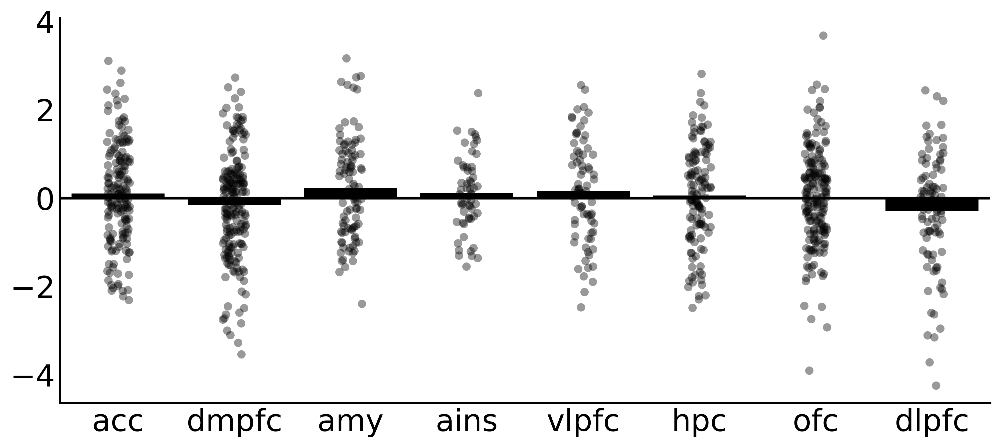

In [312]:
# plot_roi_model_results(results,'roi',cpe_var,bar_order=keep_rois,figsize=(12,5),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=fig_save_path,fig_id=fig_id,dpi=400)

plot_roi_model_results(results,'roi','Z_Score_norm_mood',figsize=(12,5),color='k')



In [278]:
# plot_roi_model_results(results,'roi','Z_Score_Profit_t1',figsize=(12,5),color='k')


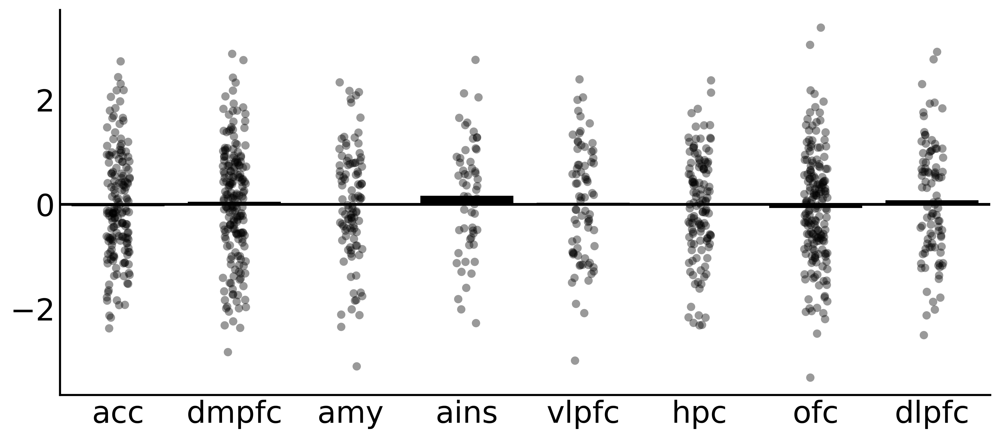

In [313]:
plot_roi_model_results(results,'roi','Z_Score_rpe_t1',figsize=(12,5),color='k')


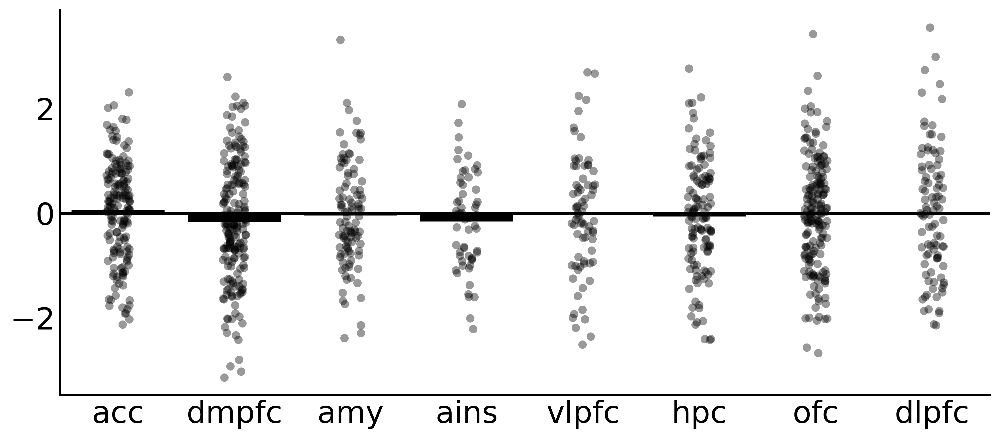

In [314]:
plot_roi_model_results(results,'roi','Z_Score_cpe_t1',figsize=(12,5),color='k')


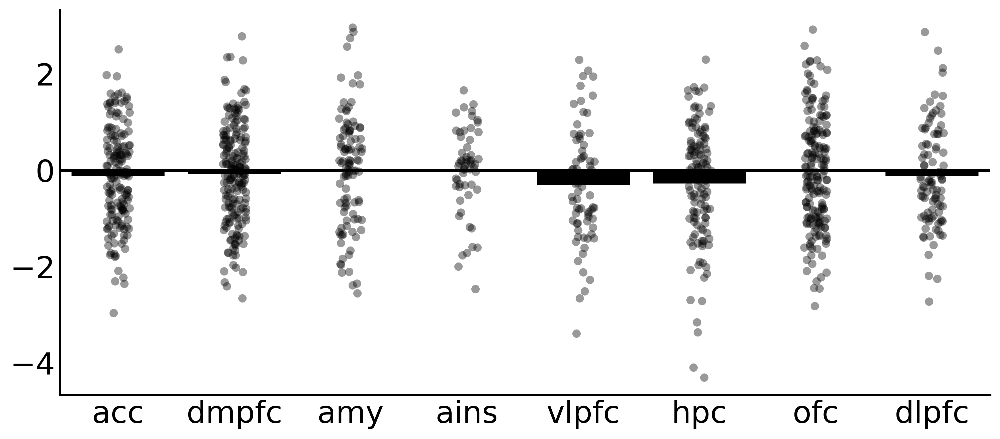

In [316]:
plot_roi_model_results(results,'roi','Z_Score_mood_rpe_int',figsize=(12,5),color='k')


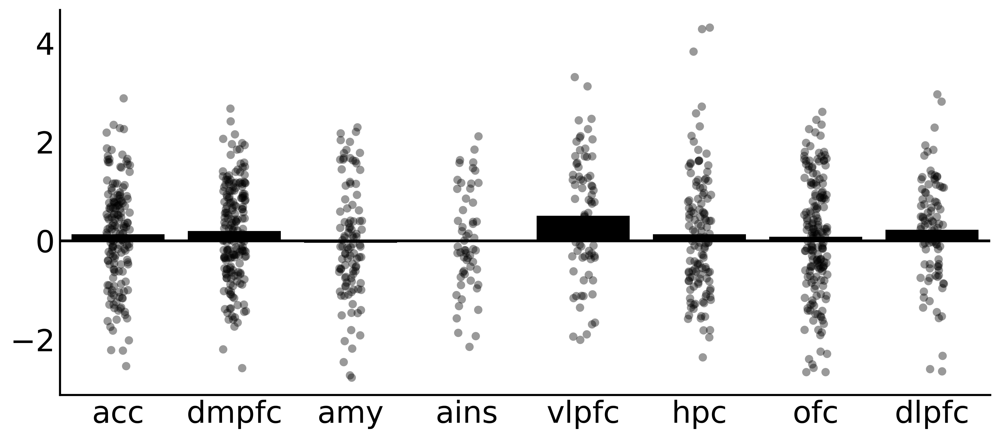

In [315]:
plot_roi_model_results(results,'roi','Z_Score_mood_cpe_int',figsize=(12,5),color='k')


## BDI correlations

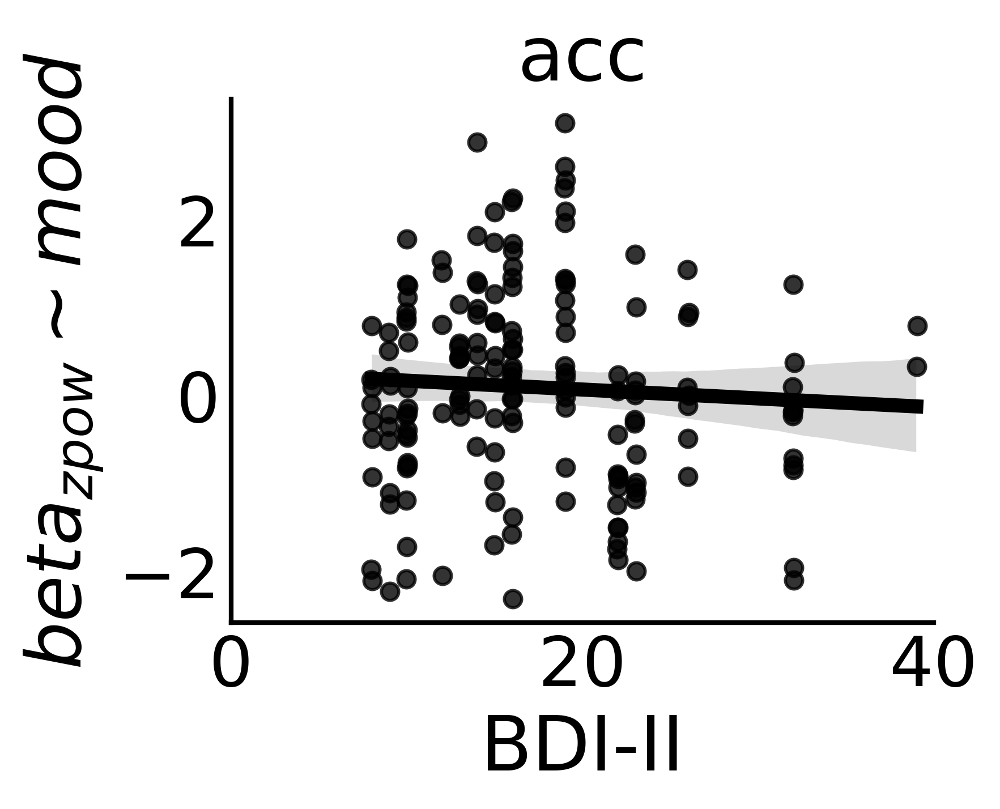

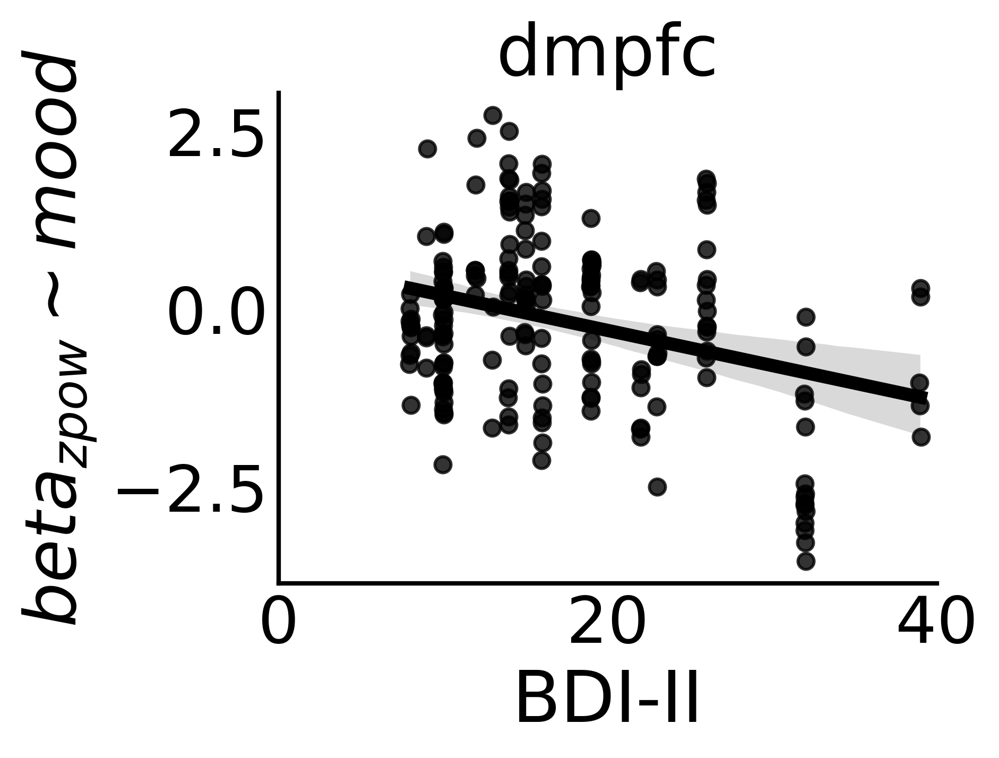

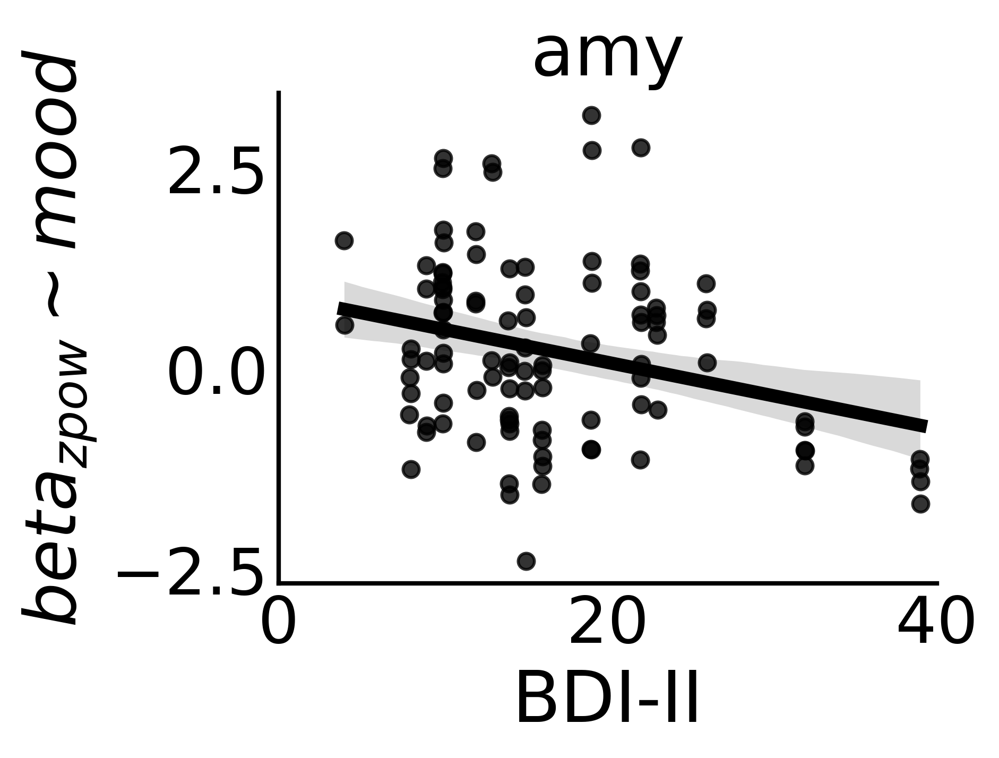

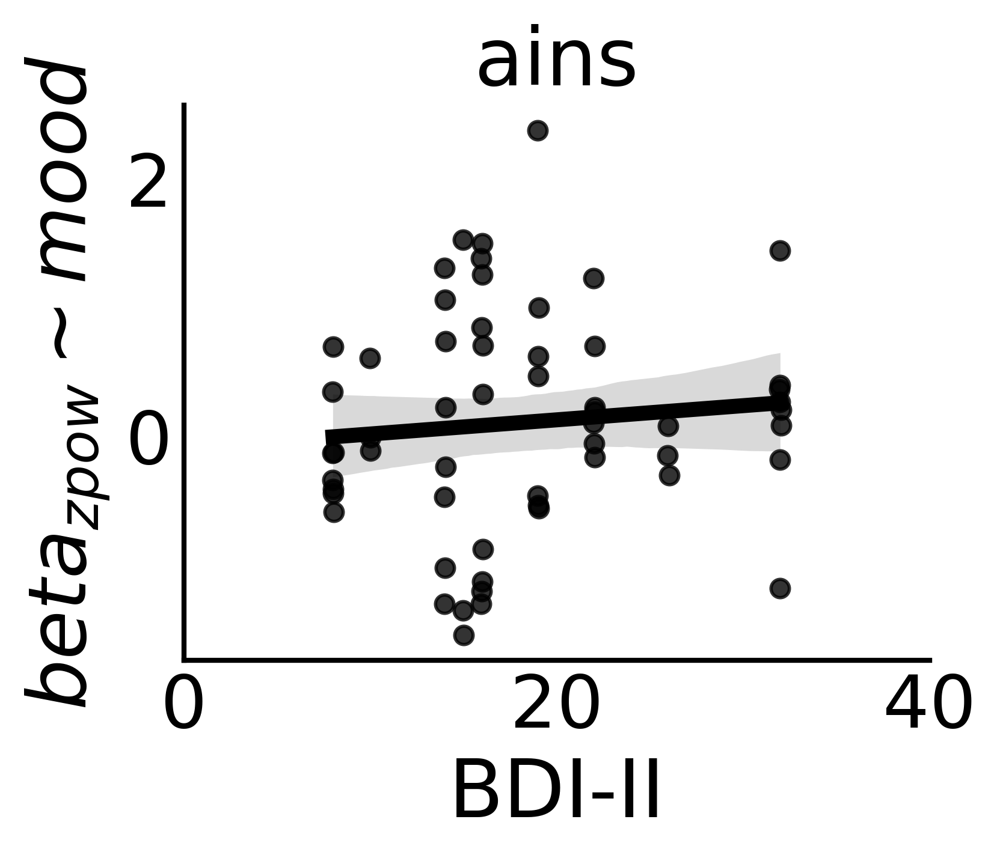

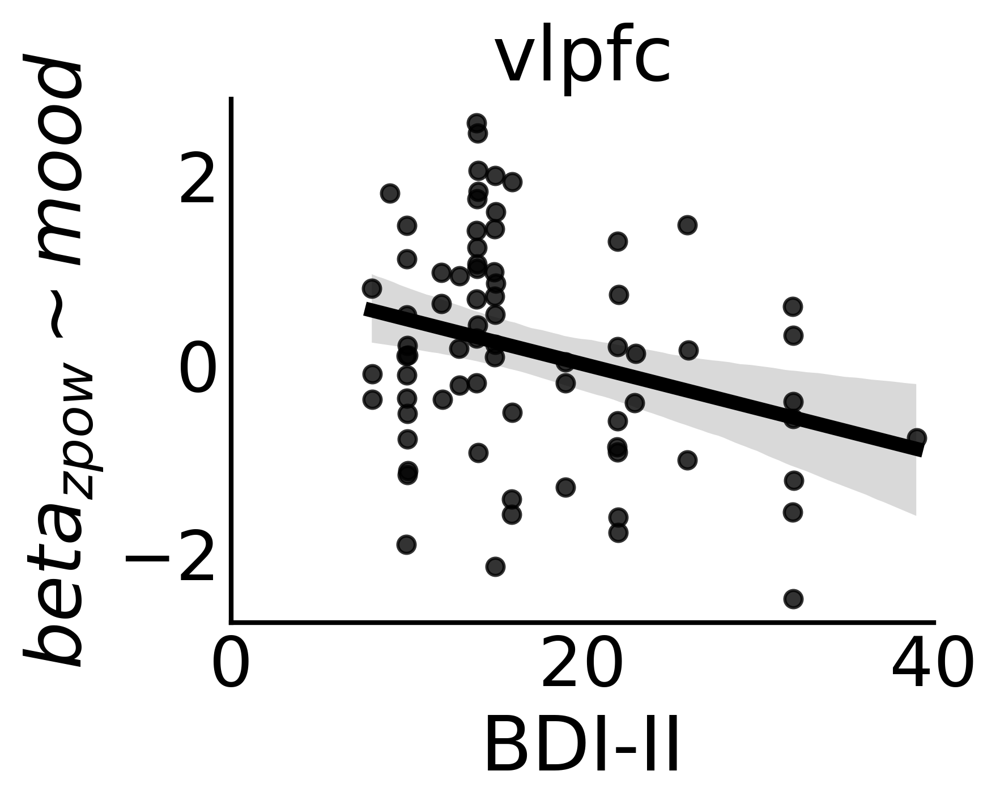

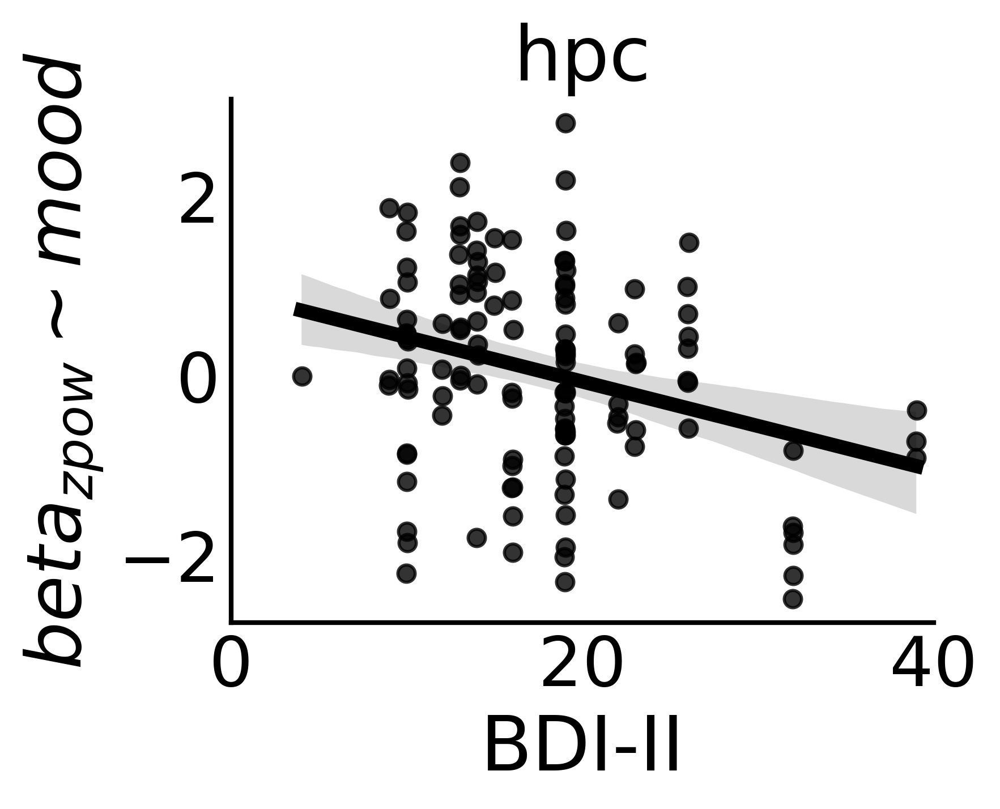

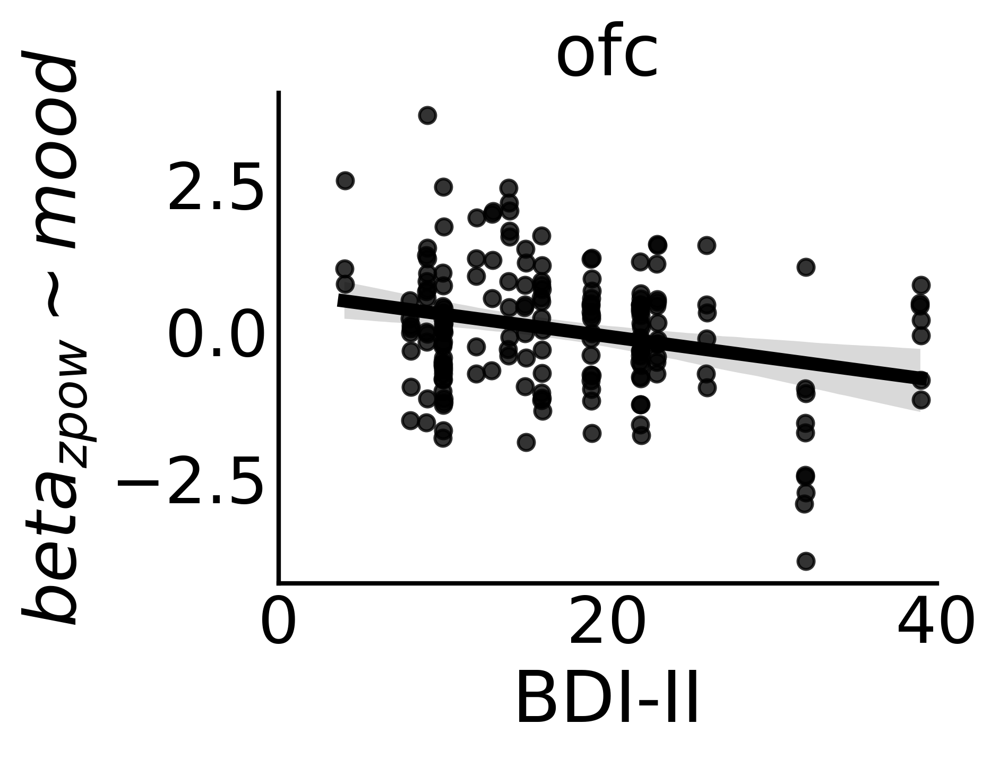

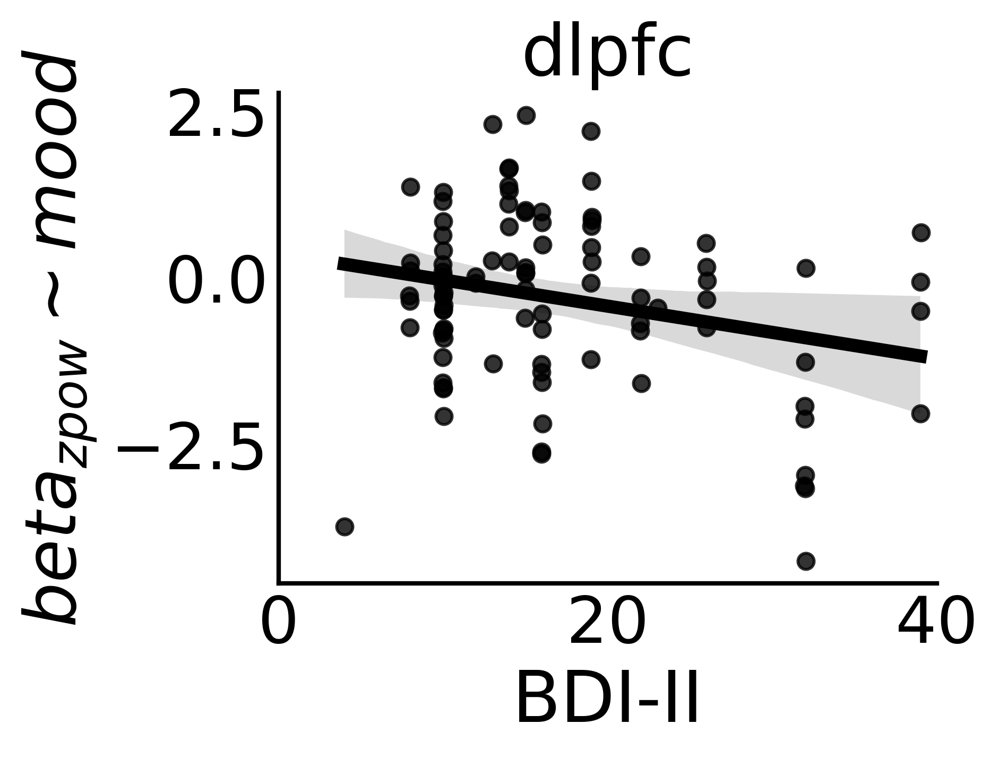

In [317]:

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [318]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        03:49:13                                         
No. Iterations:                    12                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5990      0.488     33.985     

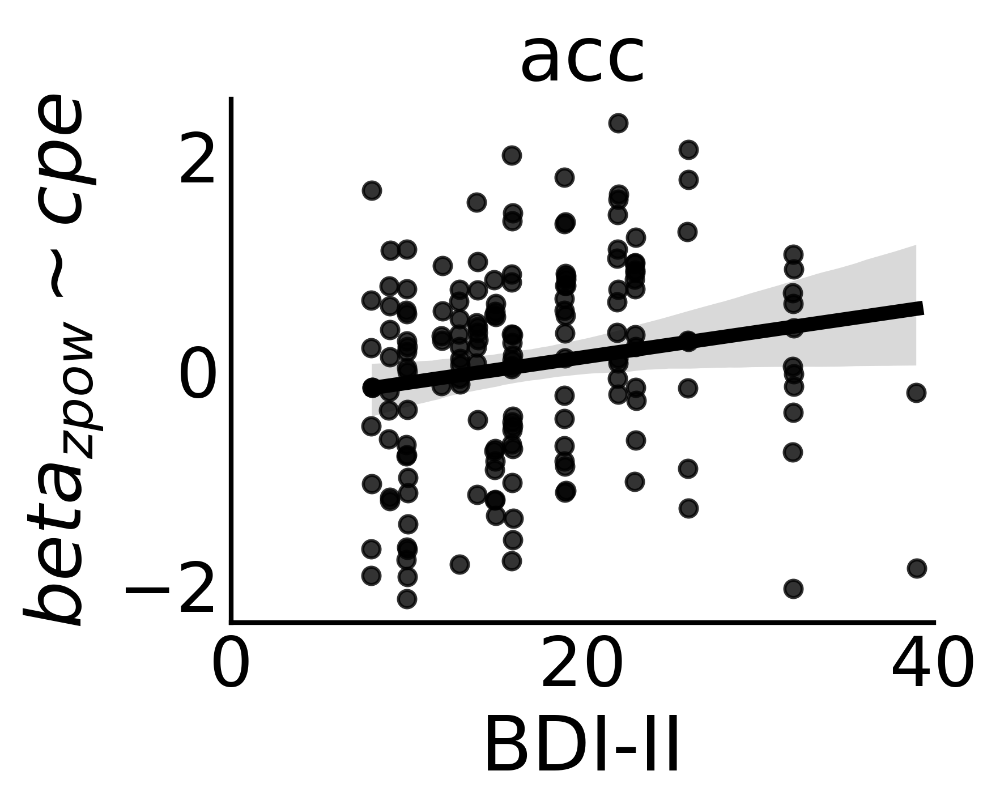

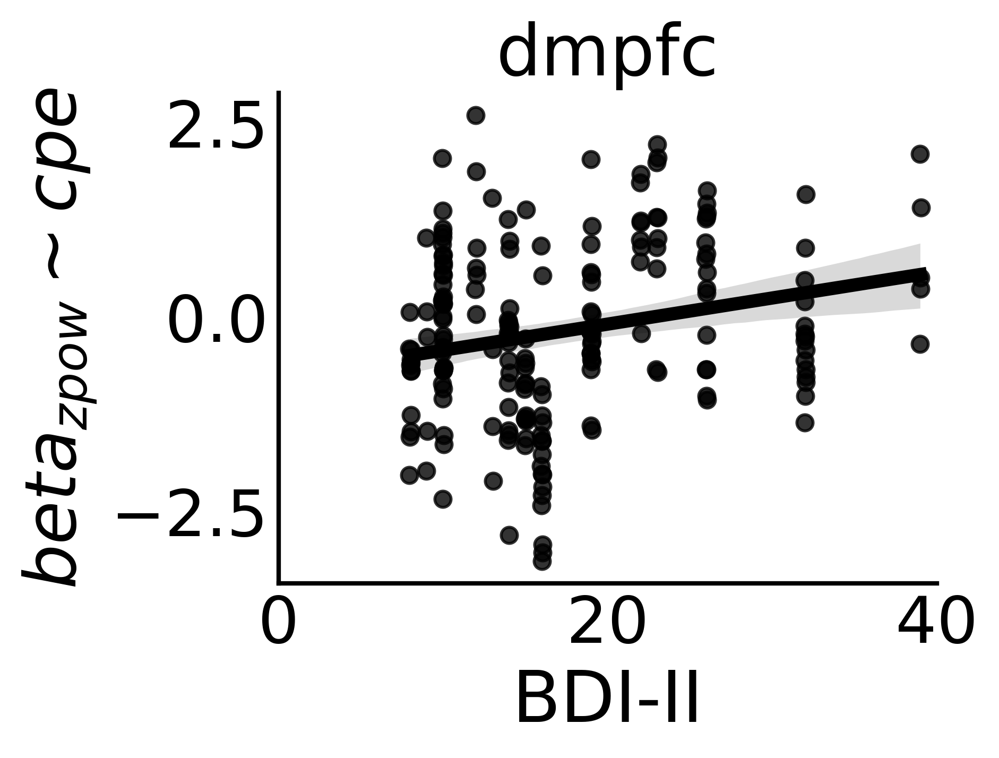

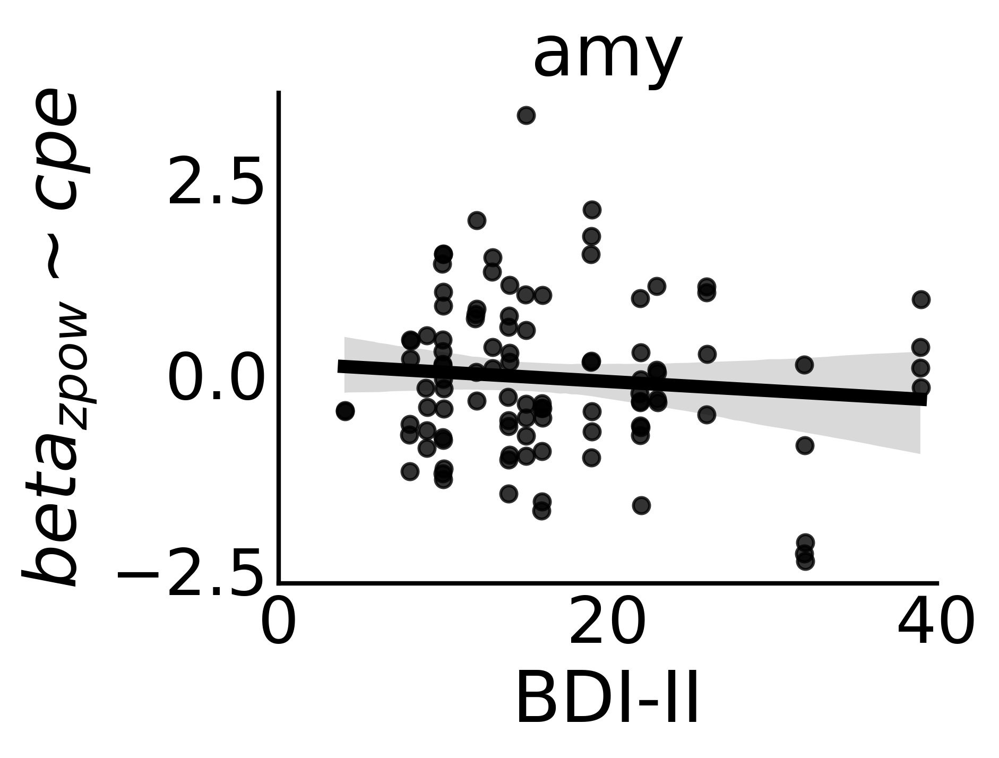

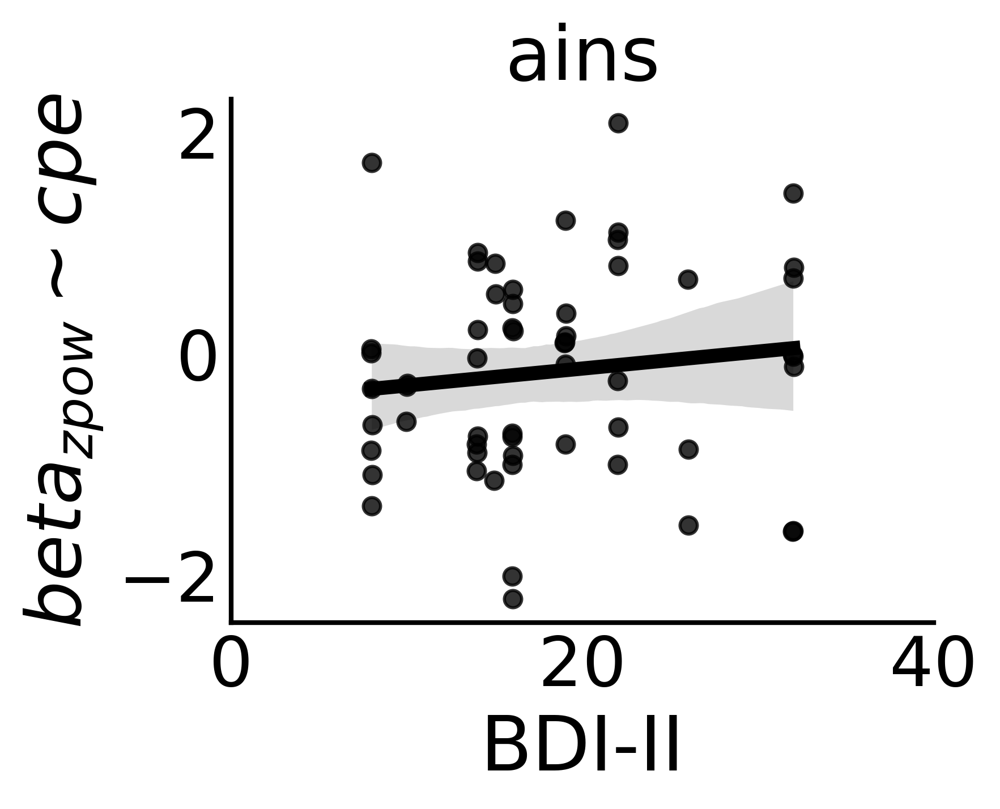

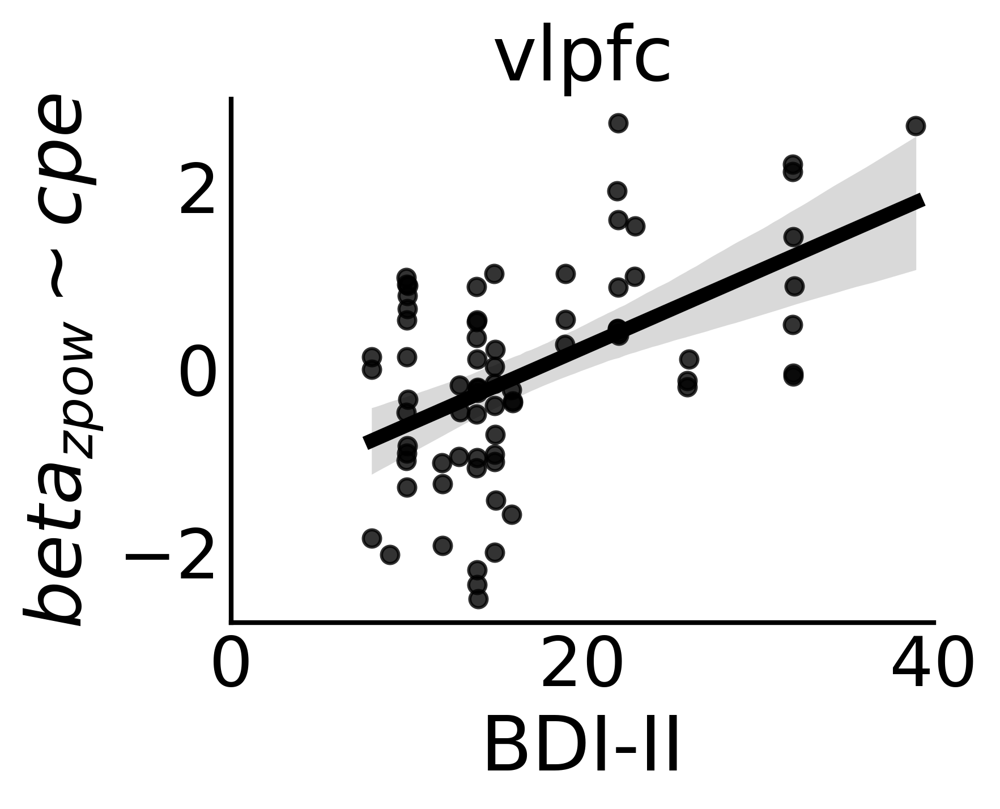

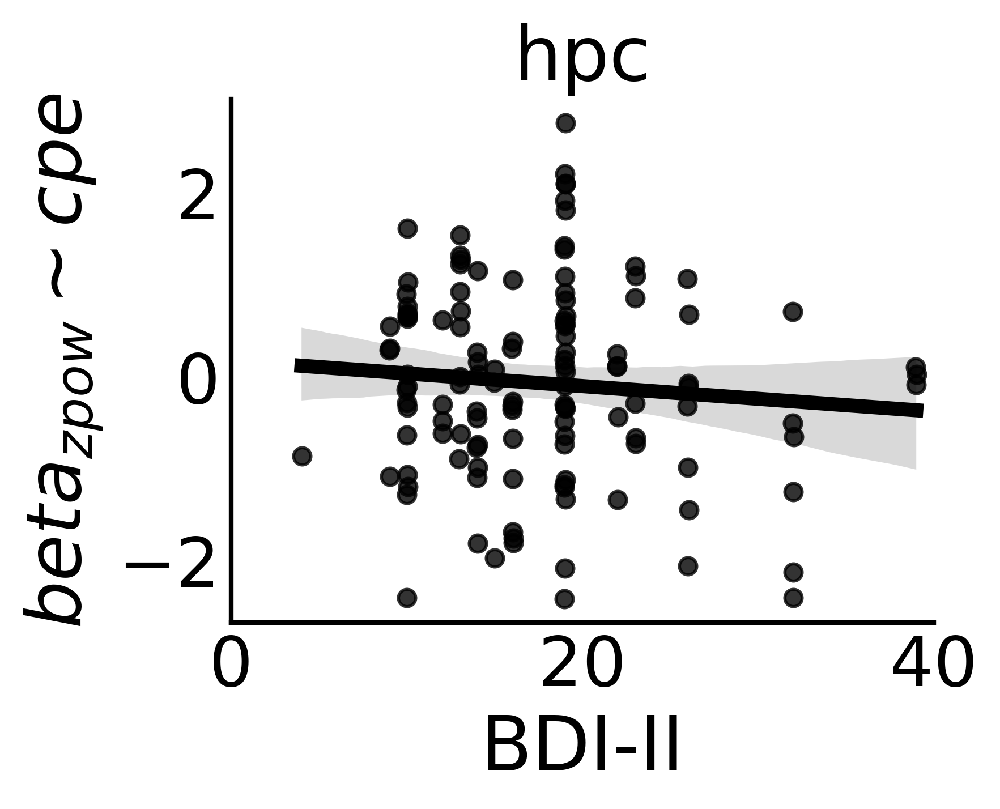

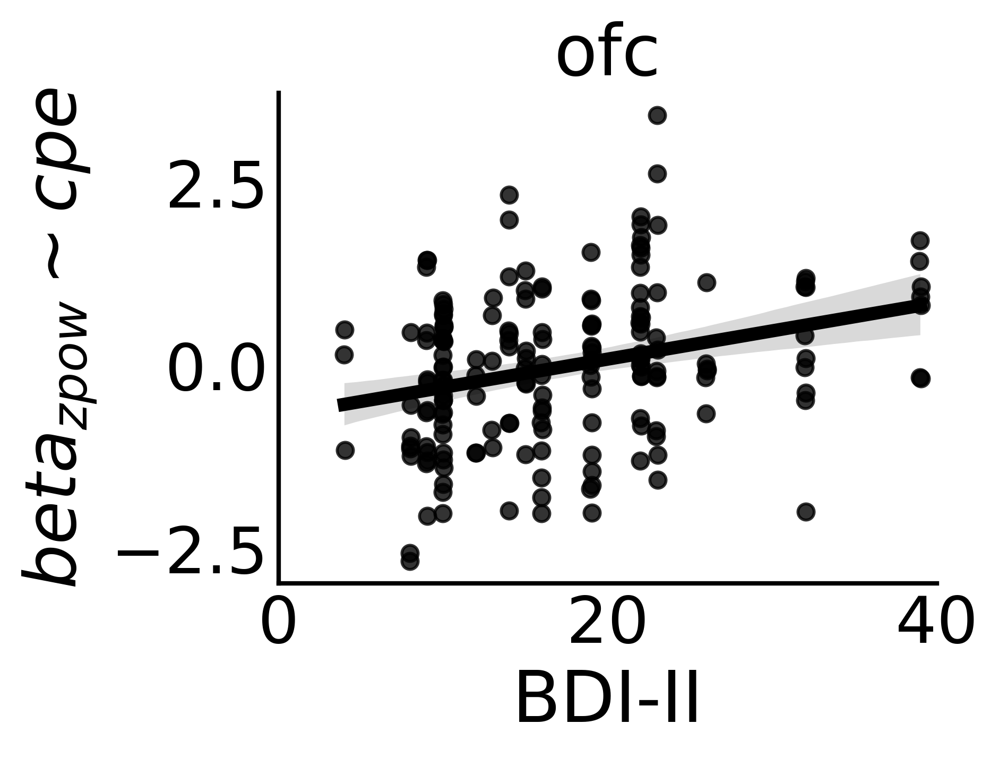

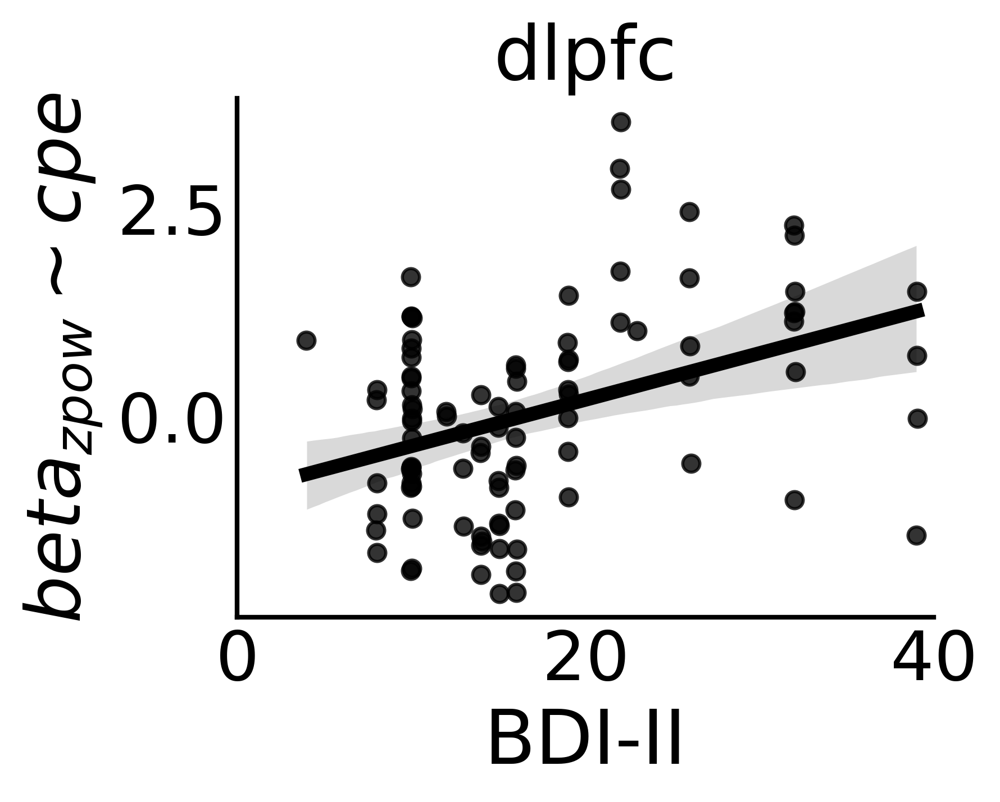

In [319]:
###### CPE CORR 

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [320]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        03:49:15                                         
No. Iterations:                    14                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.3094      0.467     34.909     

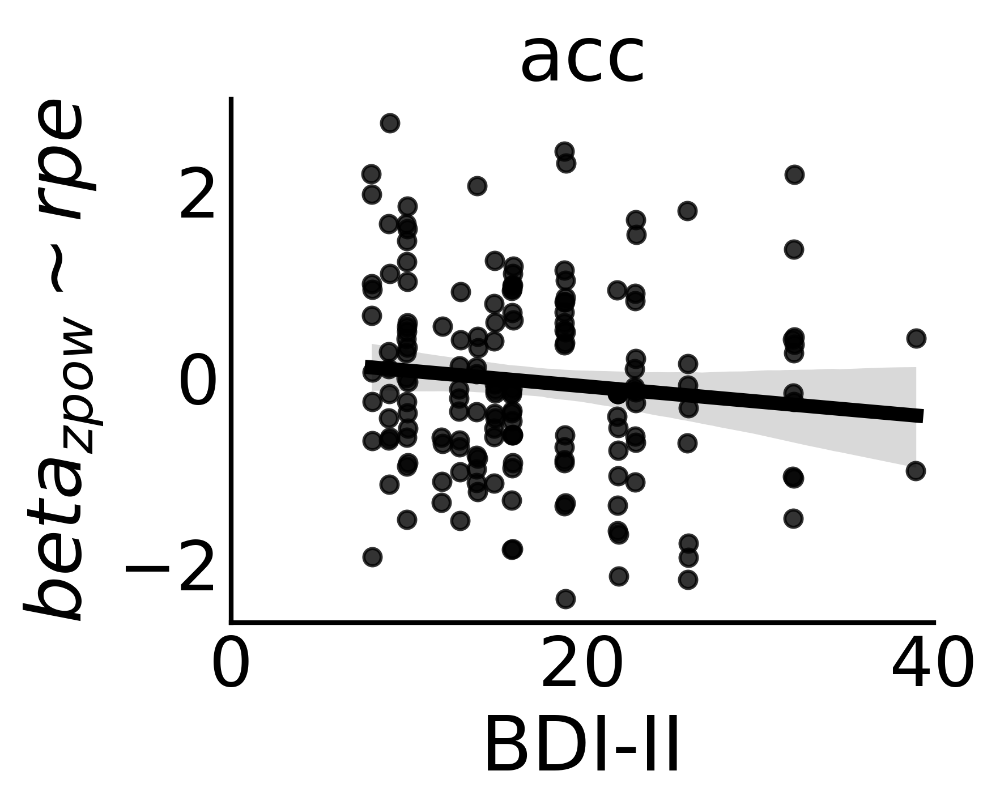

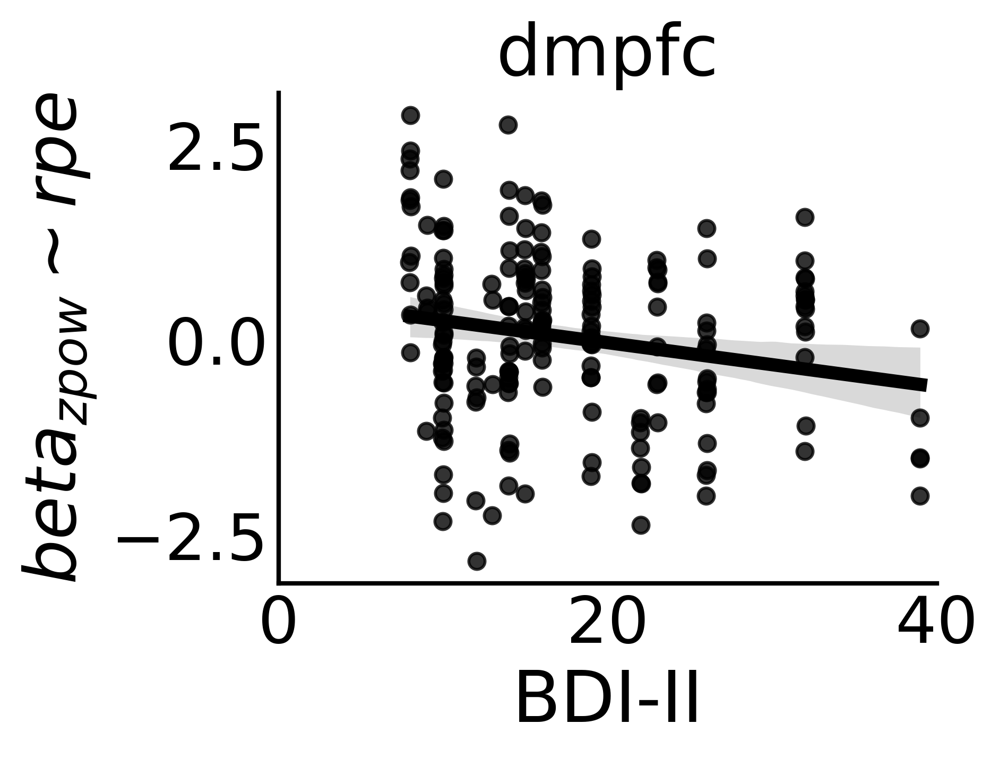

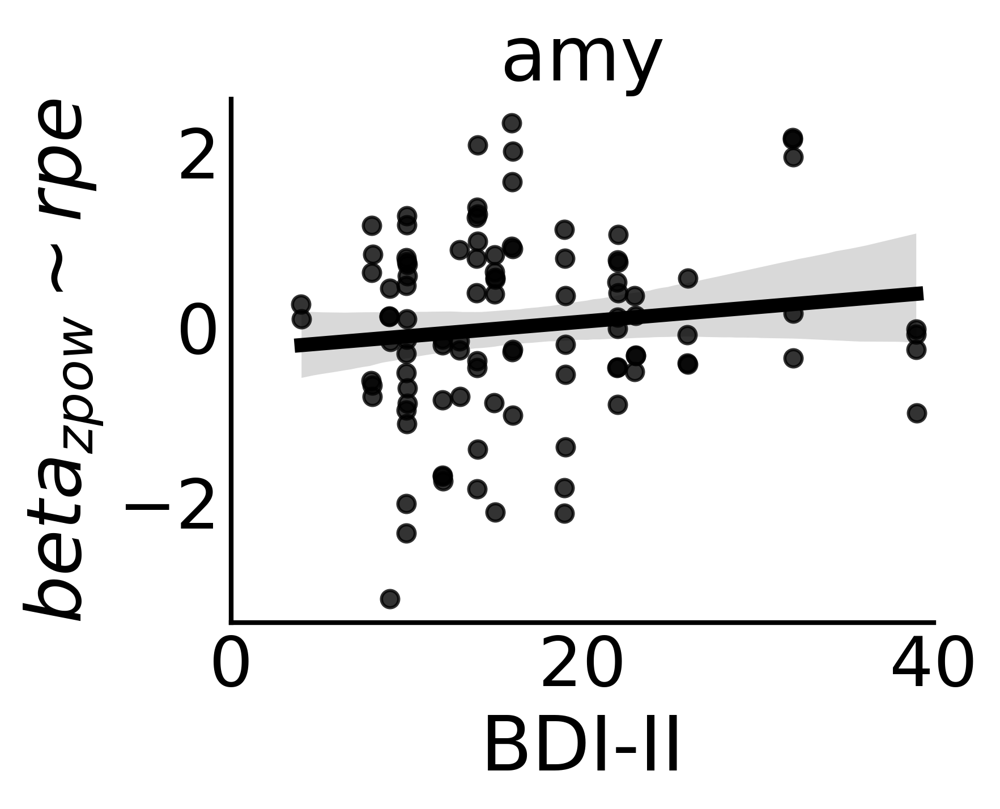

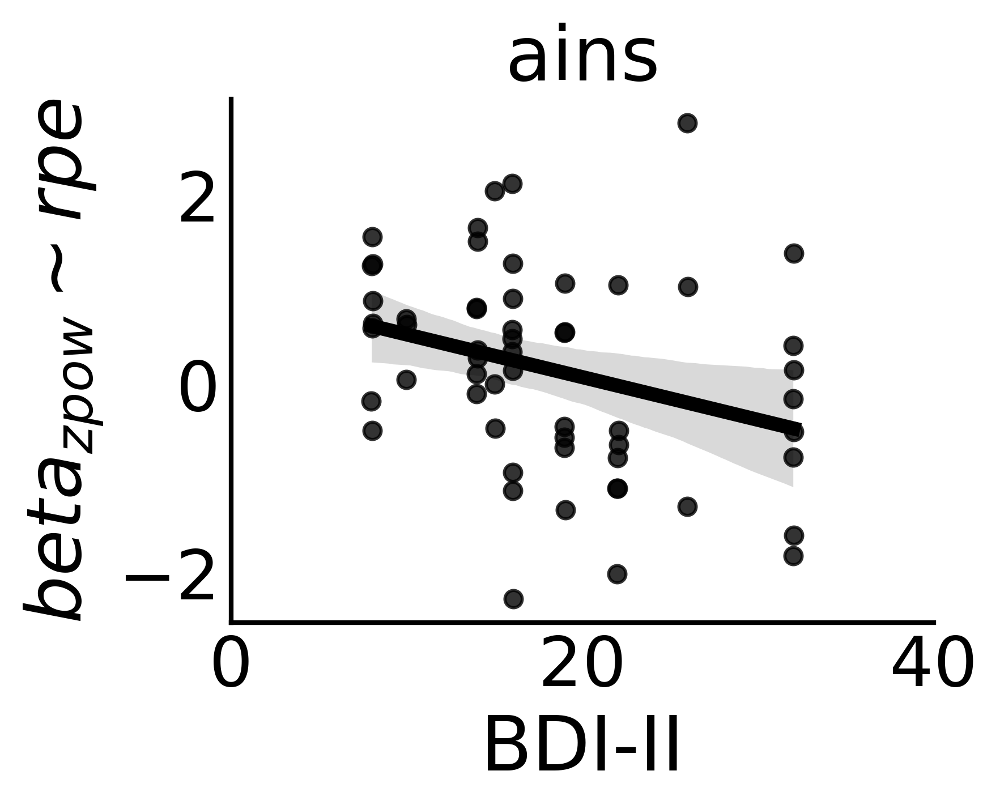

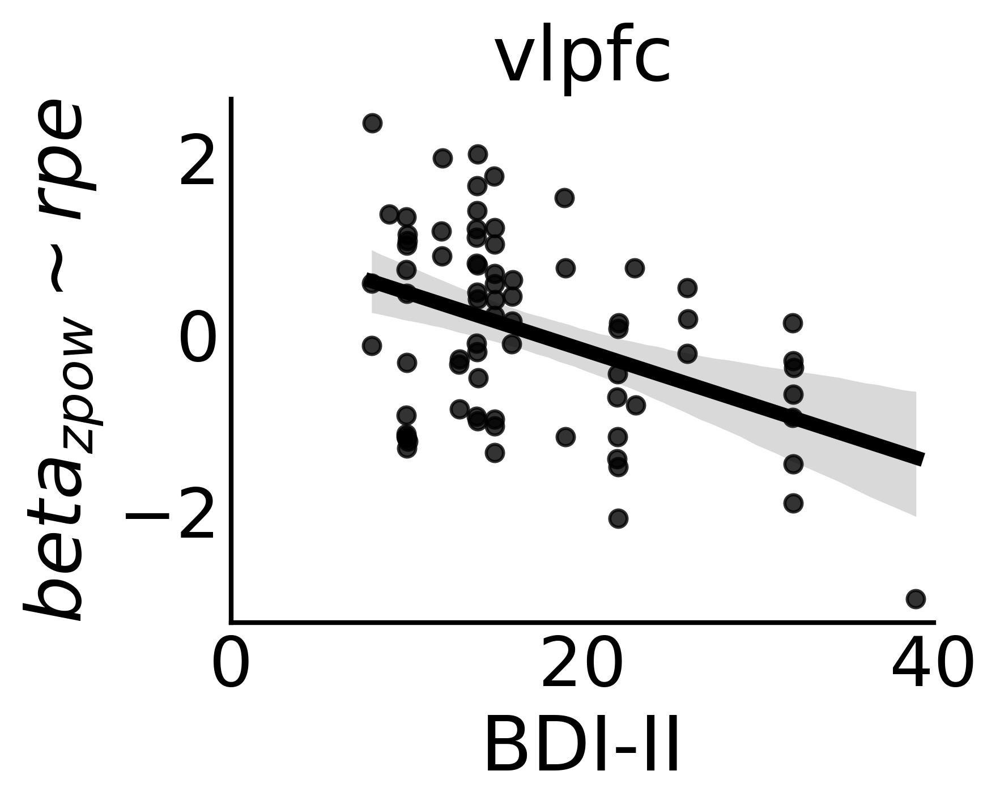

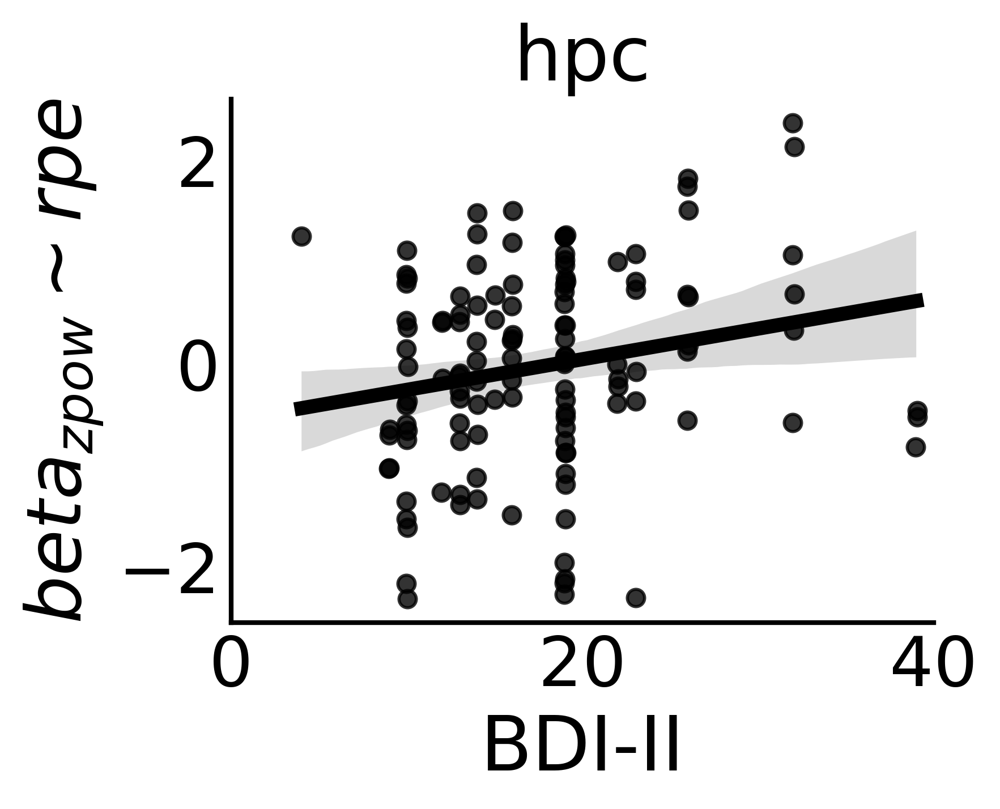

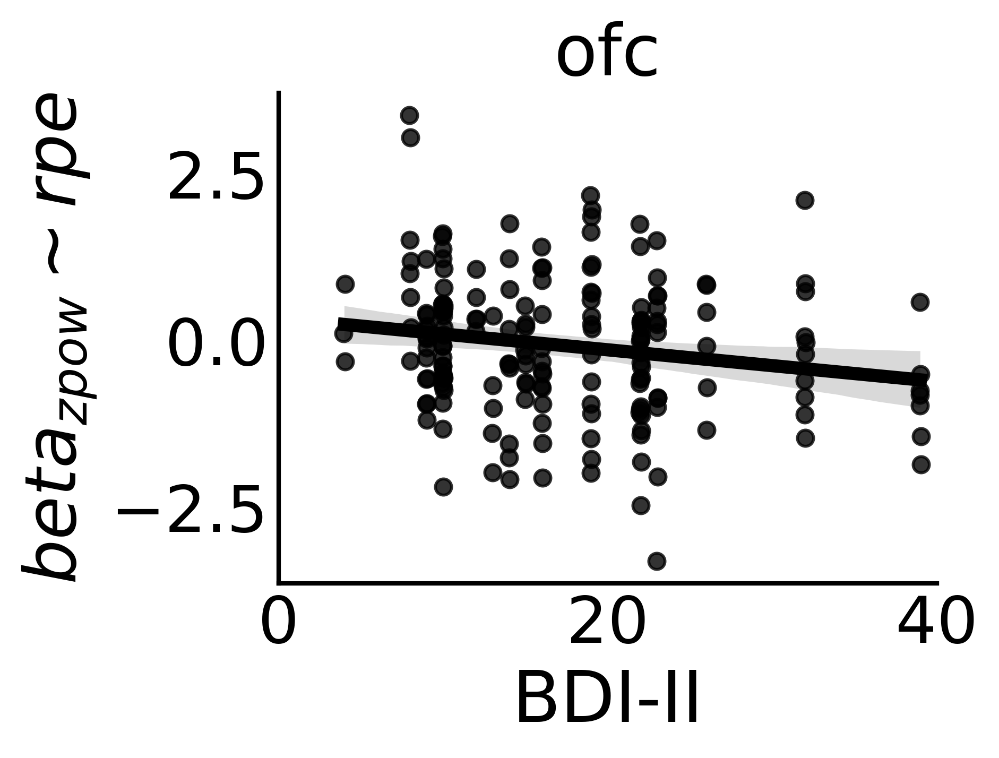

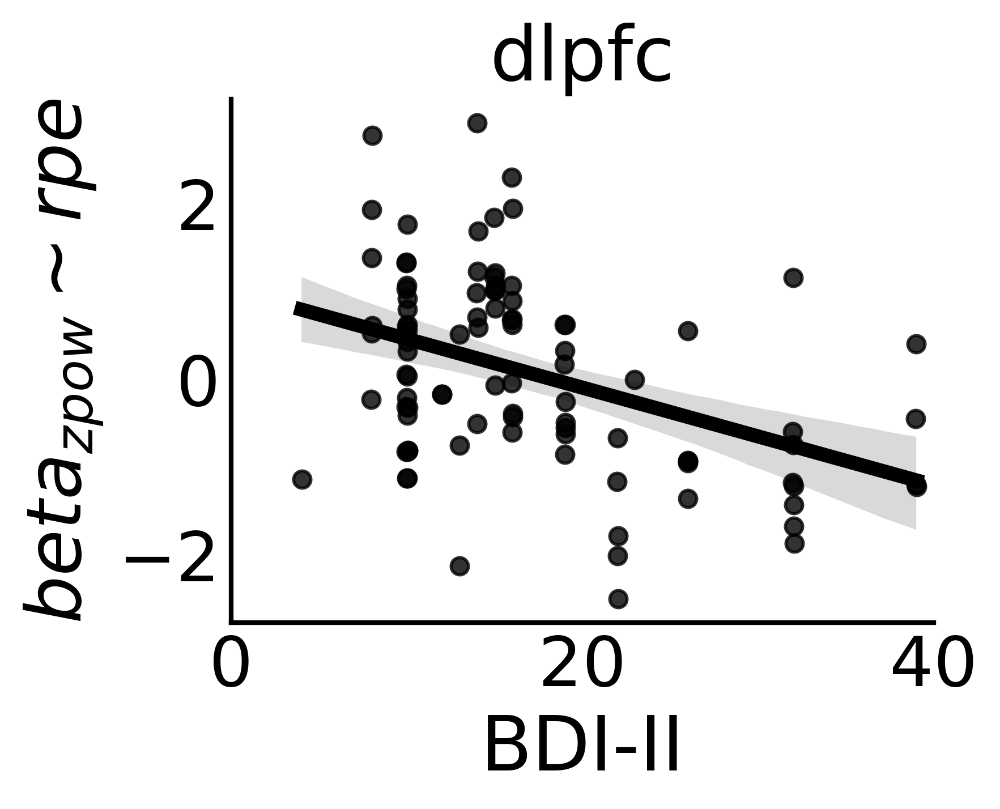

In [321]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_rpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim rpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [322]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_rpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        03:49:17                                         
No. Iterations:                     9                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5256      0.487     33.932     

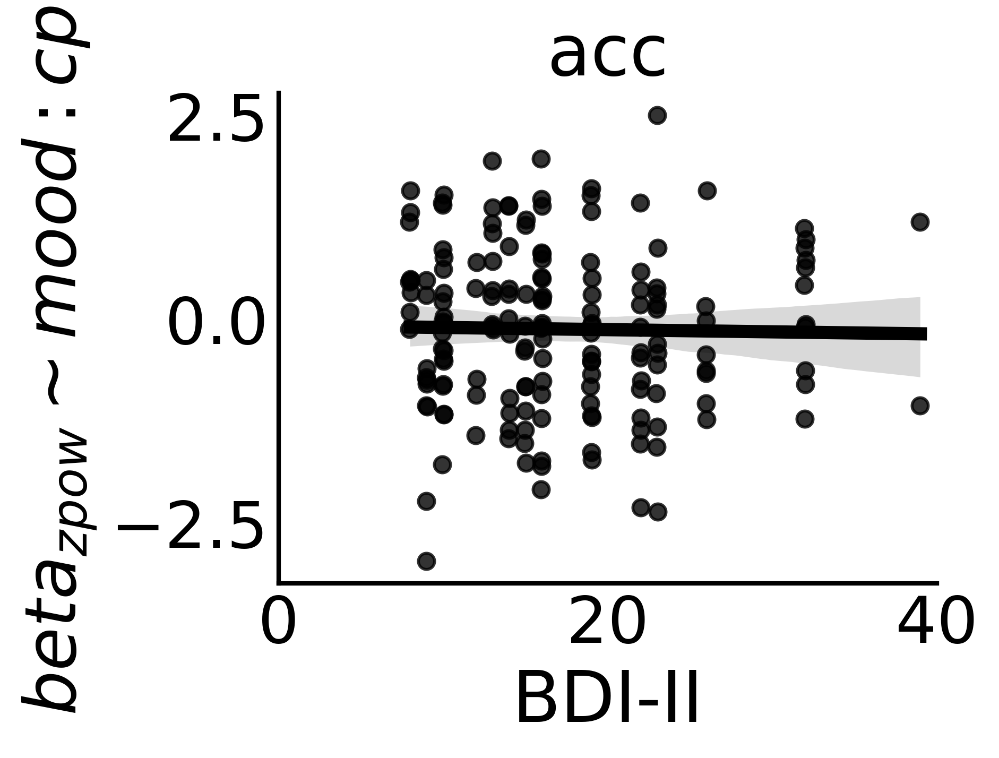

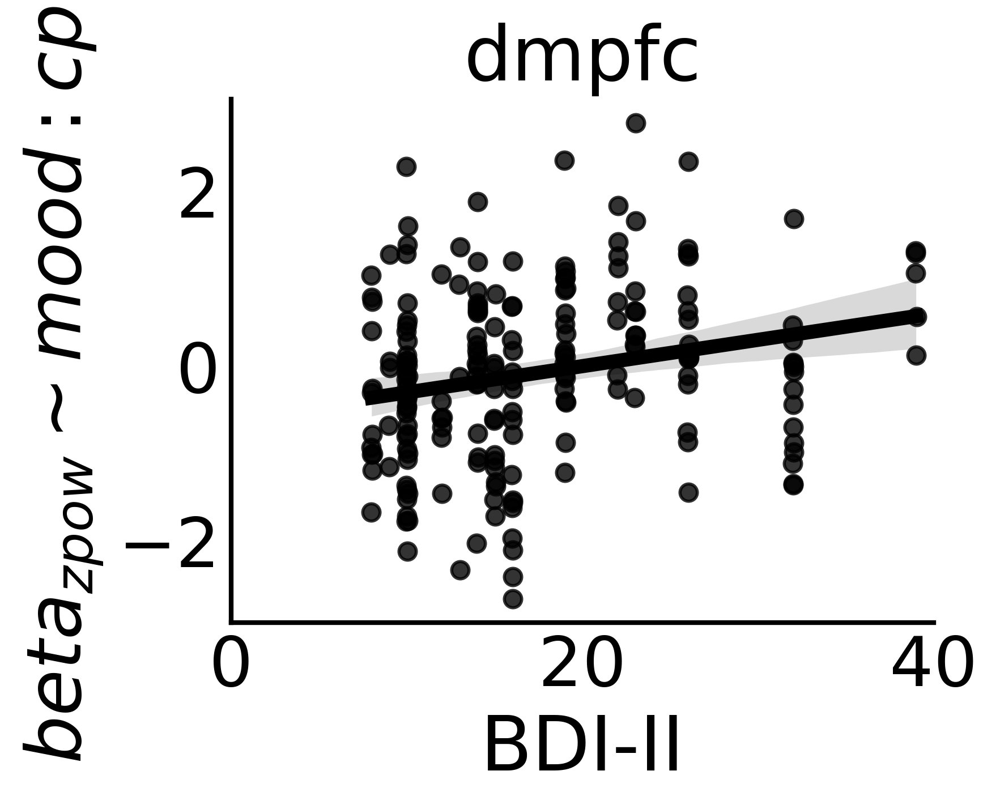

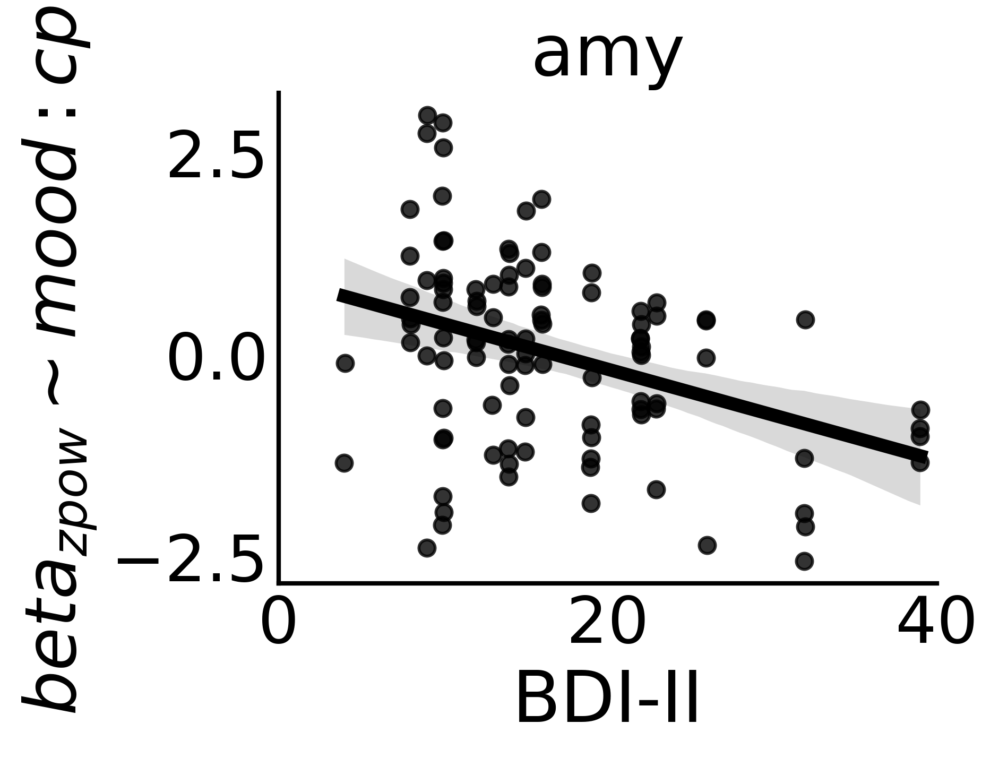

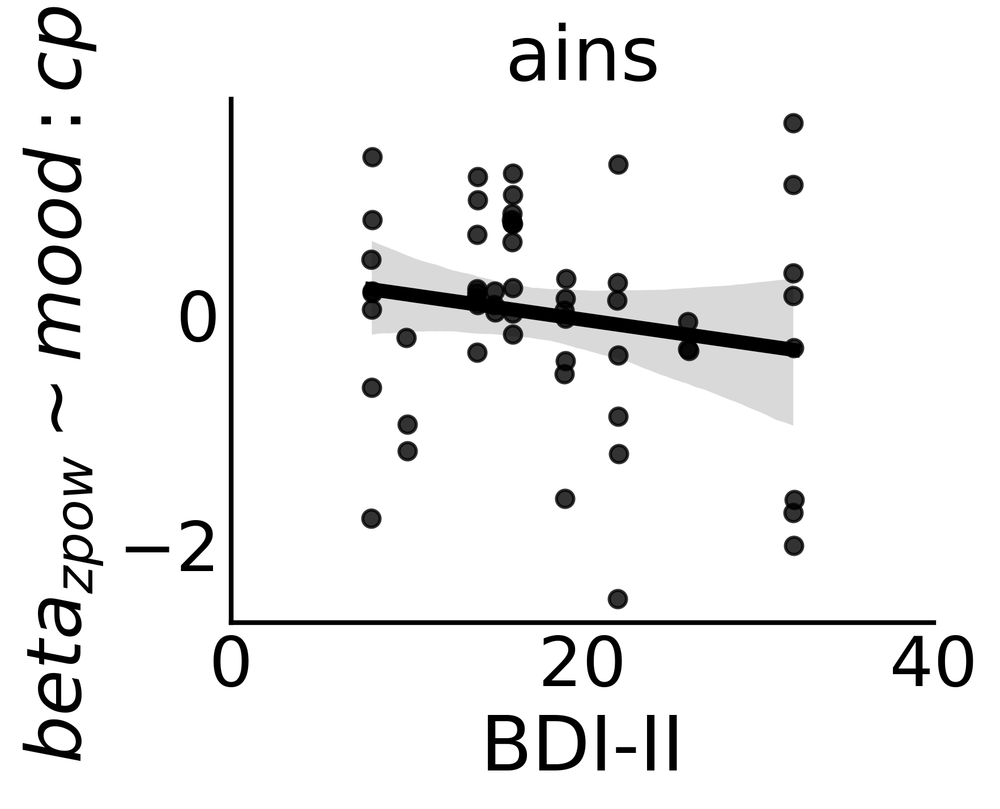

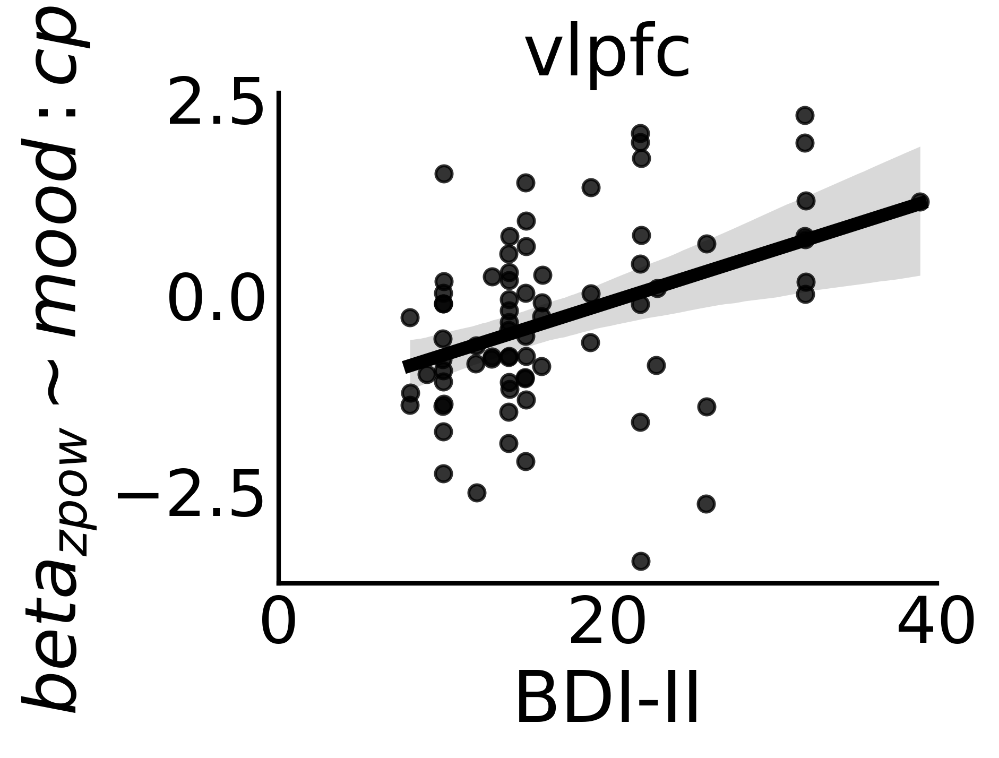

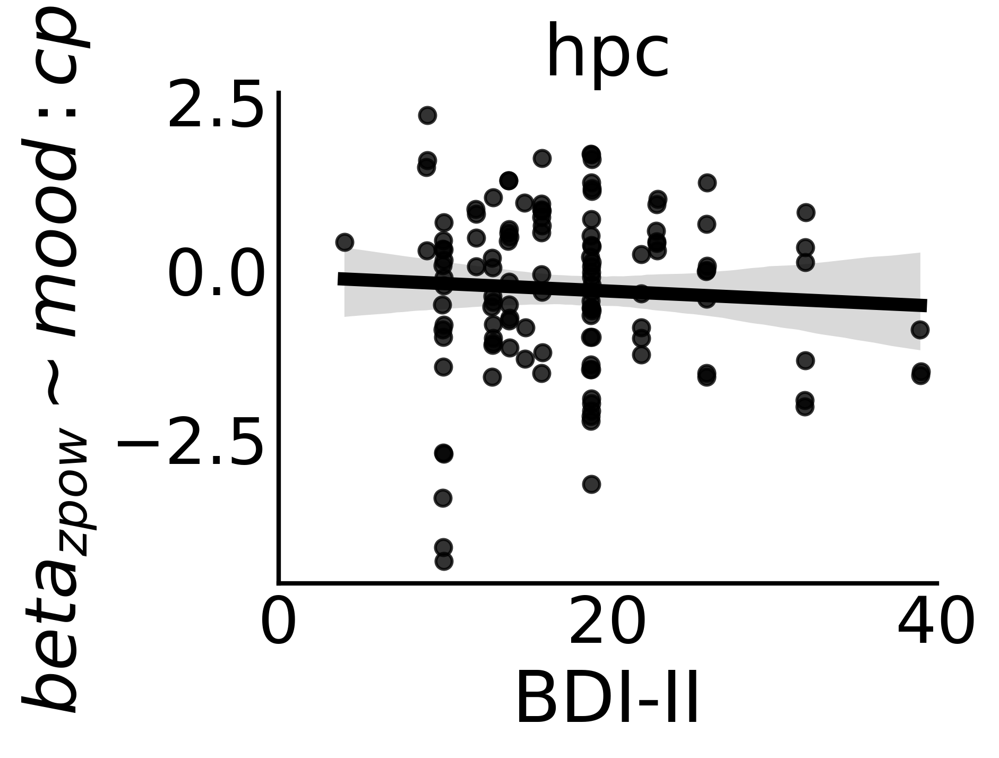

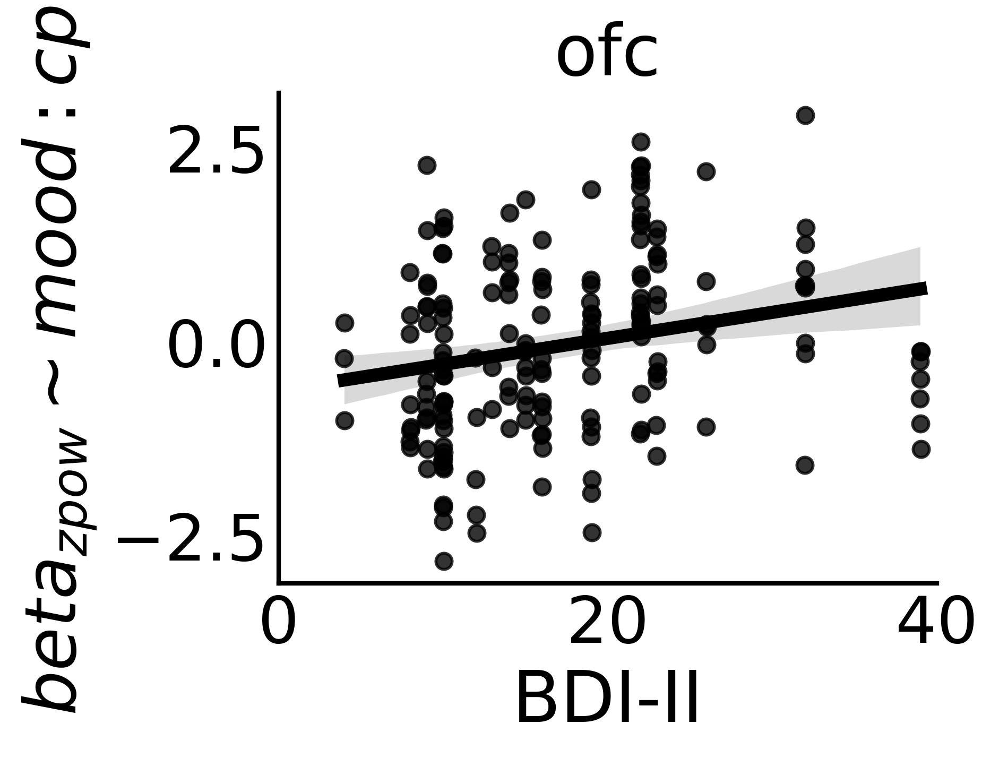

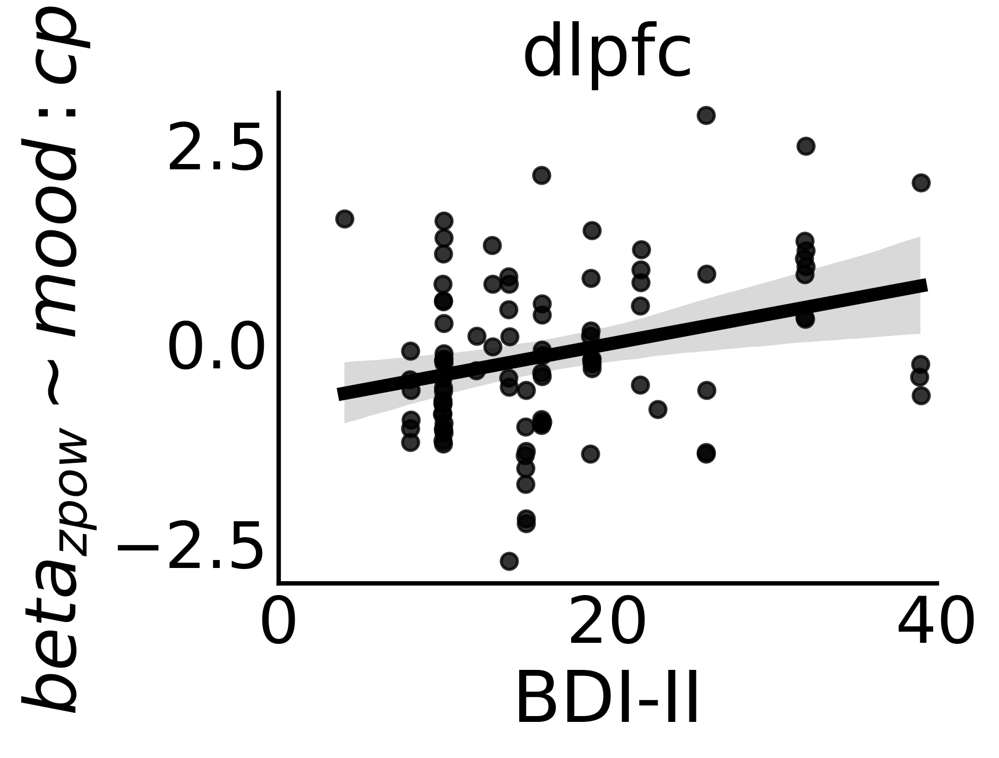

In [323]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_mood_rpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood:cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [324]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_mood_rpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        03:50:02                                         
No. Iterations:                     9                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5478      0.491     33.714     

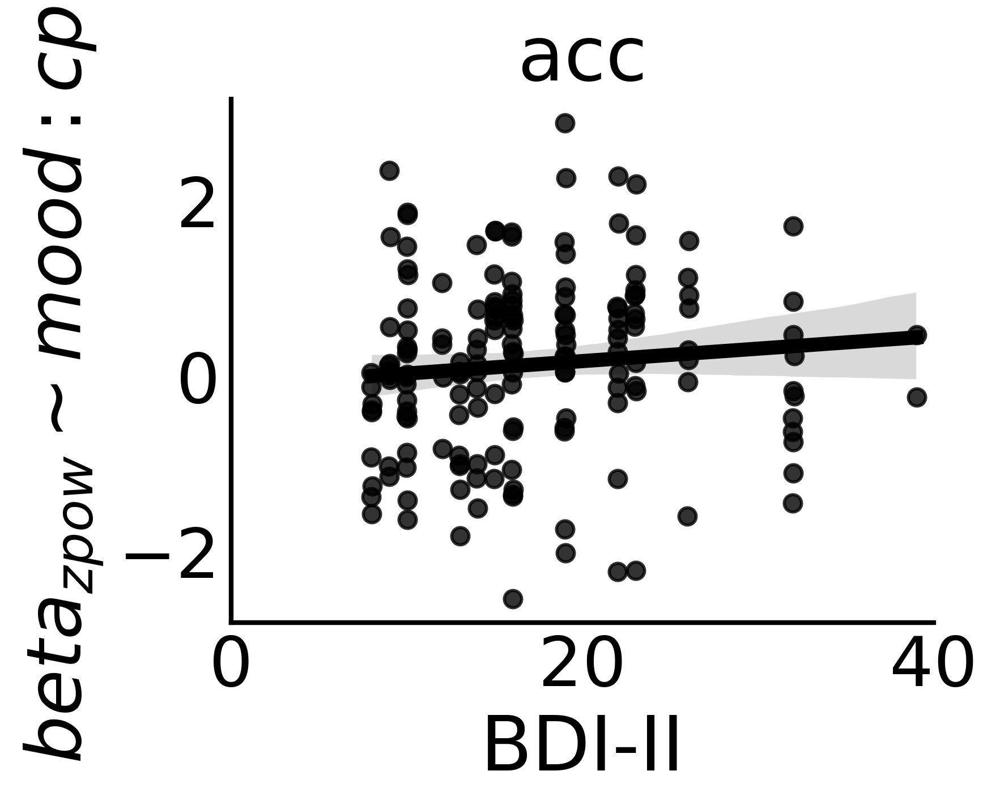

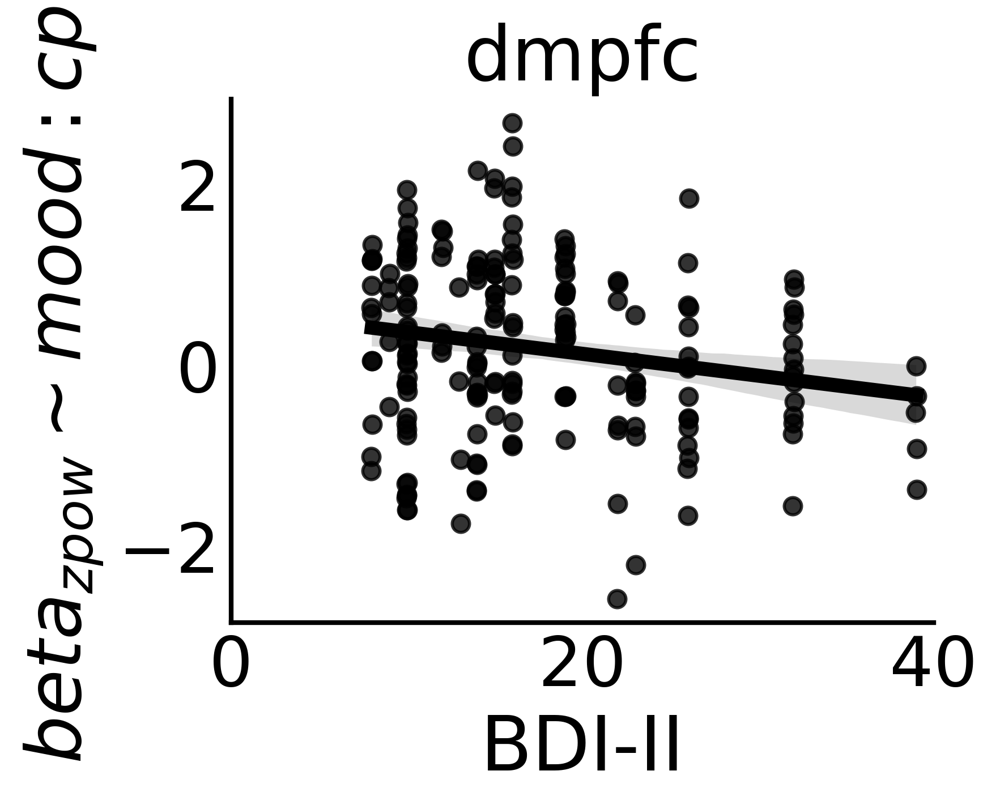

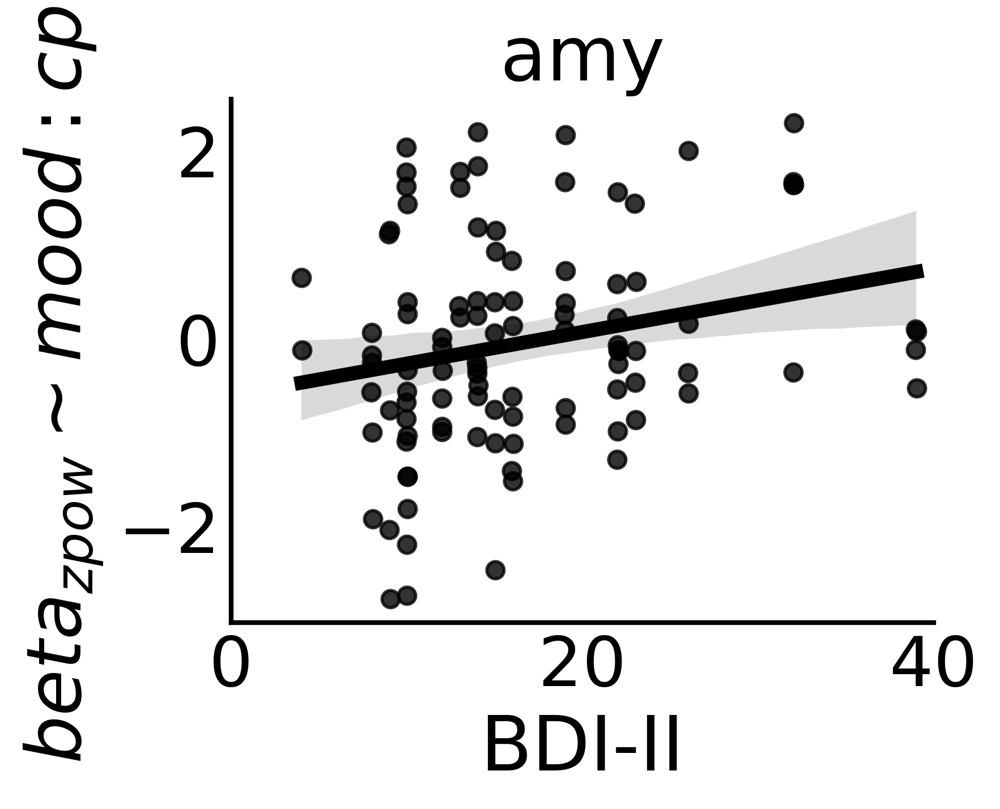

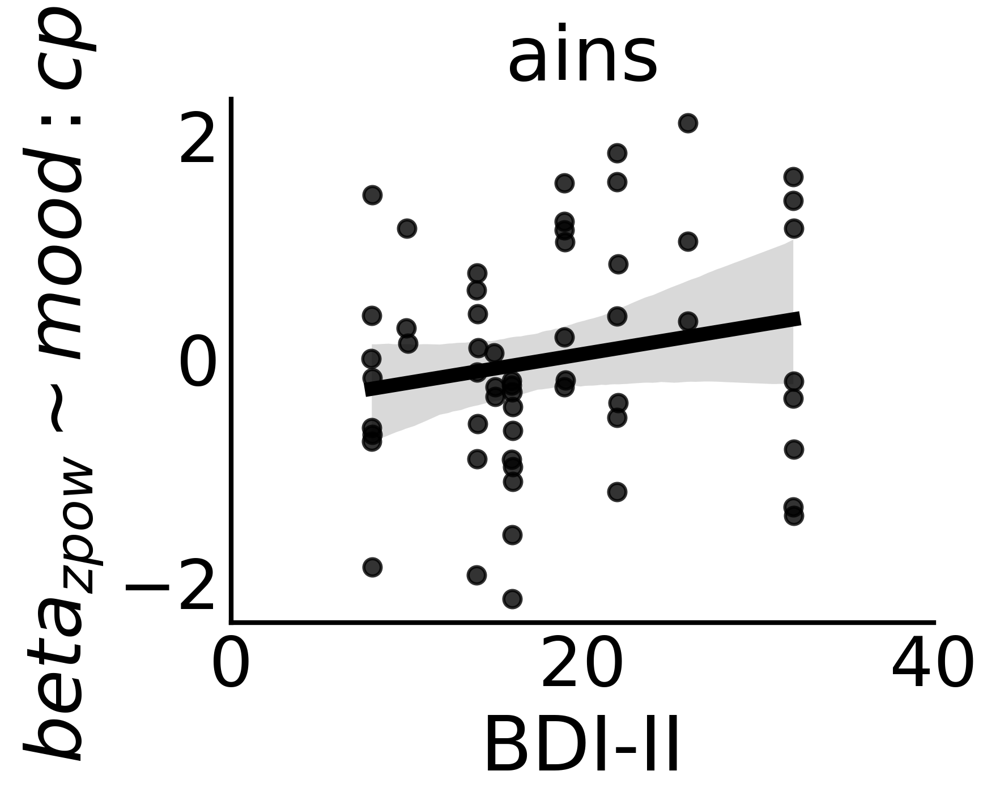

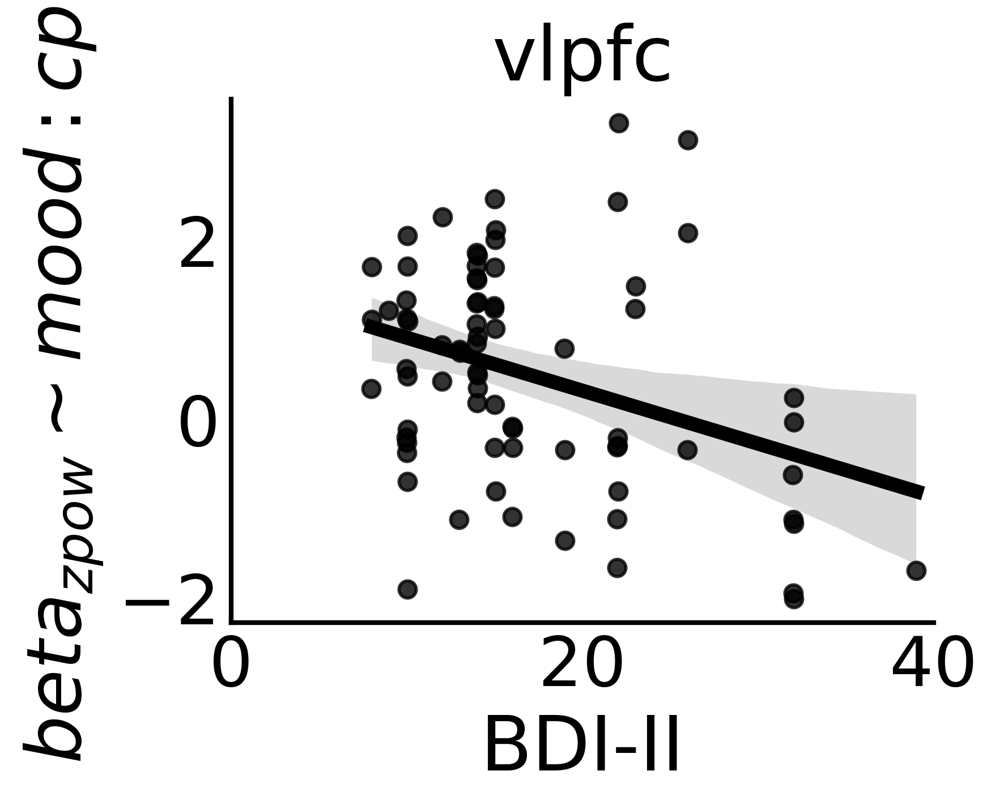

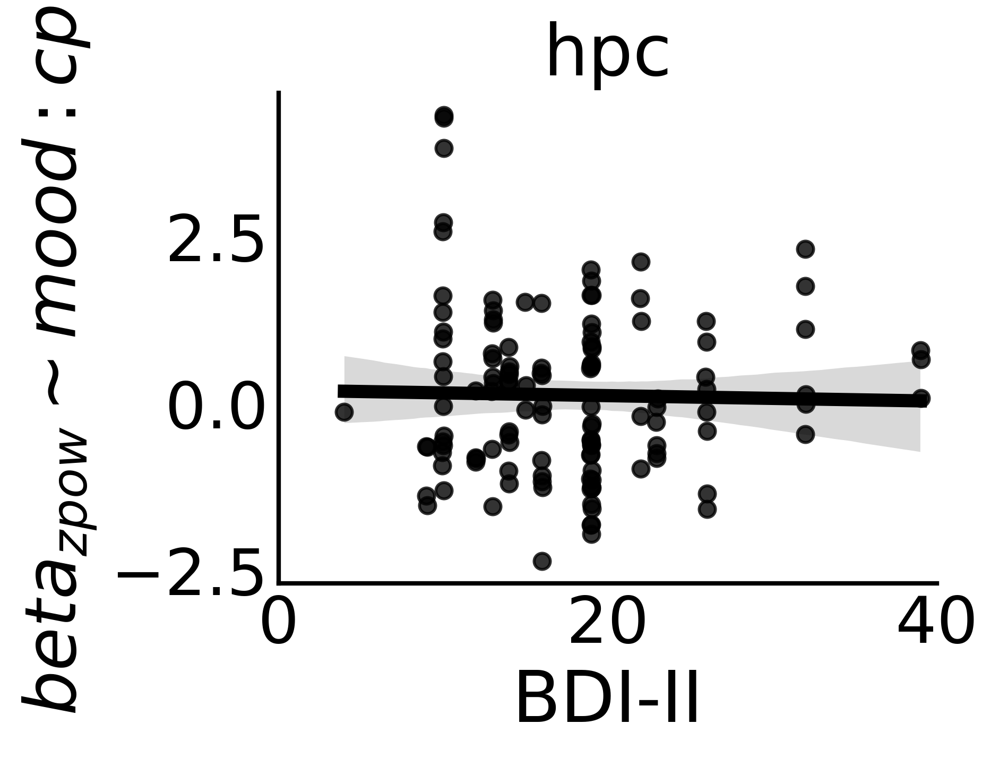

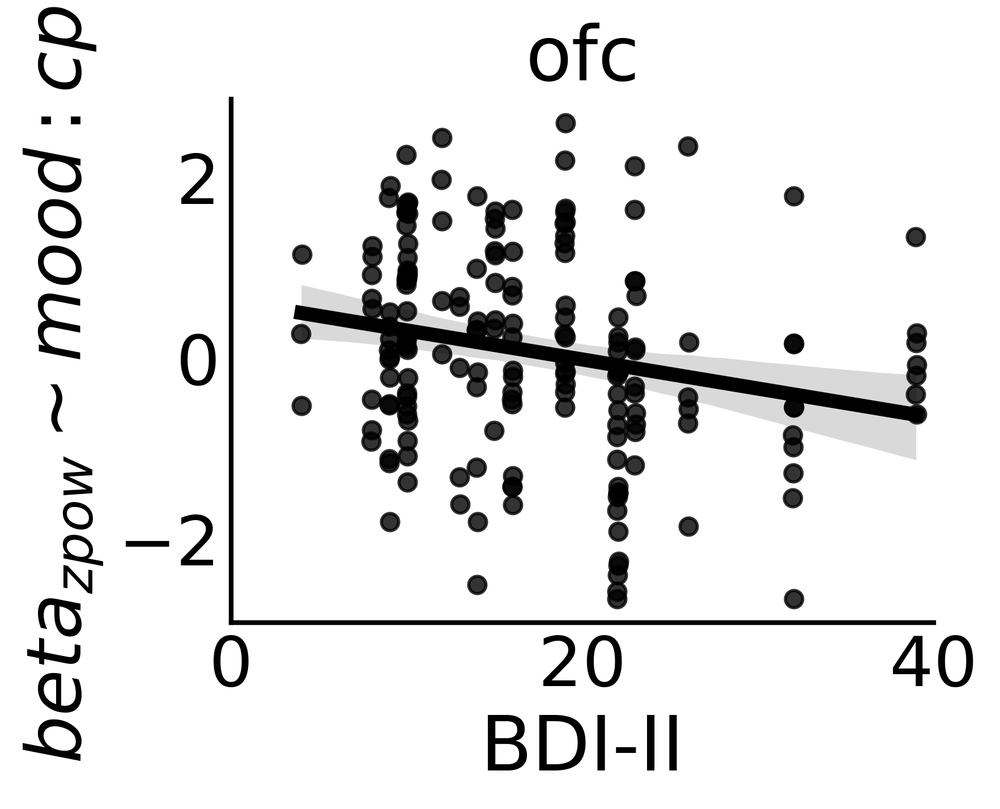

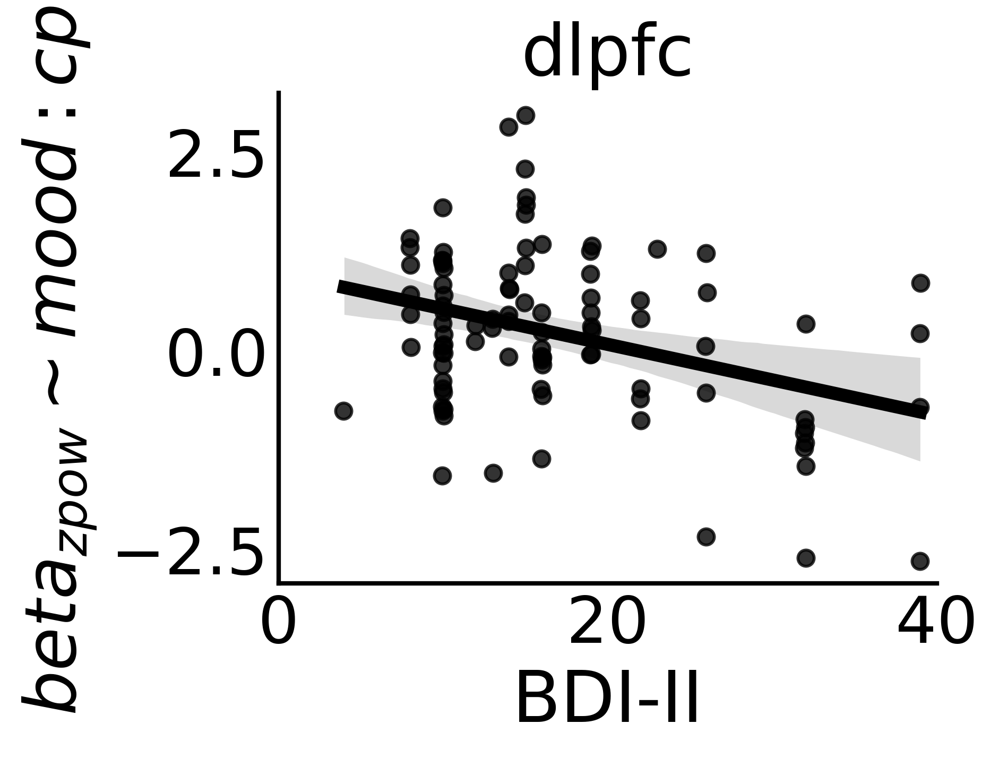

In [325]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_mood_cpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'${band}_{{zpow}} \sim mood:cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [326]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_mood_cpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        03:50:06                                         
No. Iterations:                    10                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4245      0.484     33.910     

In [251]:
# ###### CPE CORR 

# # sns.set_context("talk",rc={'axes.linewidth': 1.5})

# for roi in results.roi.unique().tolist():
    
# #     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
#     roi_temp_data = results[results.roi==roi]
        
#     fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

#     sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_band_pow',scatter=True,ci=95,
#                 fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
#     plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
#     plt.tick_params(length=0) 
#     # plt.ylabel(fr'${band}_{{zpow}} \sim cpe$')


#     plt.title(f'{roi}')
#     sns.despine()

# #     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
# #         bbox_inches='tight', pad_inches=0.1,dpi=400,
# #         facecolor='auto', edgecolor='auto',
# #         backend=None)
    


In [252]:
# ### robust regression bdi ~ cpe coefficients
# roi_rlm_dict = {}

# for roi in results.roi.unique().tolist():
#     roi_df = results[results.roi == roi]
#     rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_band_pow.values), M=sm.robust.norms.HuberT())
#     rlm_results = rlm.fit()
#     roi_rlm_dict[roi] = rlm_results
#     print(roi)
#     print(rlm_results.summary())


In [285]:
# #### INTERACTION CORRS 
# # sns.set_context("talk",rc={'axes.linewidth': 1.5})

# for roi in results.roi.unique().tolist():
    
# #     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
#     roi_temp_data = results[results.roi==roi]
        
#     fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

#     sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_Profit_t1',scatter=True,ci=95,
#                 fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
#     plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
#     plt.tick_params(length=0) 
#     plt.ylabel(fr'${band}_{{zpow}} \sim mood:cpe$')


#     plt.title(f'{roi}')
#     sns.despine()

# #     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
# #         bbox_inches='tight', pad_inches=0.1,dpi=400,
# #         facecolor='auto', edgecolor='auto',
# #         backend=None)
    


In [286]:
# ### robust regression bdi ~ cpe coefficients
# roi_rlm_dict = {}

# for roi in results.roi.unique().tolist():
#     roi_df = results[results.roi == roi]
#     rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_Profit_t1.values), M=sm.robust.norms.HuberT())
#     rlm_results = rlm.fit()
#     roi_rlm_dict[roi] = rlm_results
#     print(roi)
#     print(rlm_results.summary())


# Run ROI MLMs 

In [327]:
mood_pow_df.columns

Index(['Unnamed: 0', 'epoch', 'time', 'freq', 'reref_ch_names', 'band_pow',
       'band', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'Rating',
       'RatingOnset', 'RT', 'Round_t1_idx', 'Round_t2_idx', 'Round_t3_idx',
       'epoch_t1_idx', 'epoch_t2_idx', 'epoch_t3_idx', 'keep_mood', 'logRT',
       'MoodChoiceOnset', 'SafeBet_t1', 'SafeBet_t2', 'SafeBet_t3',
       'LowBet_t1', 'LowBet_t2', 'LowBet_t3', 'HighBet_t1', 'HighBet_t2',
       'HighBet_t3', 'Profit_t1', 'Profit_t2', 'Profit_t3', 'TotalProfit_t1',
       'TotalProfit_t2', 'TotalProfit_t3', 'GambleEV_t1', 'GambleEV_t2',
       'GambleEV_t3', 'TrialEV_t1', 'TrialEV_t2', 'TrialEV_t3', 'CR_t1',
       'CR_t2', 'CR_t3', 'choiceEV_t1', 'choiceEV_t2', 'choiceEV_t3', 'rpe_t1',
       'rpe_t2', 'rpe_t3', 'cf_t1', 'cf_t2', 'cf_t3', 'cpe_t1', 'cpe_t2',
       'cpe_t3', 'mood_epoch_len', 'next_round_start', 'norm_mood', 'roi',
       'hemi', 'unique_reref_ch', 'mood_cpe_int', 'mood_rpe_int'],
      dtype='object')

In [465]:
script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'
sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *

In [444]:
# def fit_mixed_model(df, regressor_vars, random_vars, Y_var, RE_var,reml=True):
#     # define formula, random effects formula
#     re_formula = (' + ').join(random_vars) 
#     formula    = f'{Y_var} ~ 1 +  {(" + ").join(regressor_vars)}'
#     return smf.mixedlm(formula = formula, re_formula = re_formula, data = df, groups=df[RE_var], missing='drop').fit(reml=reml)

In [567]:
outcome_var  = 'band_pow'
# rand_eff_var = 'subj_id'
rand_eff_var = 'unique_reref_ch'
# reg_vars     = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
# rand_vars    = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
reg_vars     = ['norm_mood','rpe_t1','cpe_t1']
rand_vars    = ['norm_mood','rpe_t1','cpe_t1']


In [568]:
outcome_var

'band_pow'

In [569]:
mood_pow_df[mood_pow_df.roi==roi]

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch,mood_cpe_int,mood_rpe_int
1900,2450,0,-0.5,20.743342,lpips9-lpips10,-0.294659,beta,MS002,14,low,...,-0.892581,-0.795008,5.310698,545.592613,0.277664,dlpfc,l,MS002_lpips9-lpips10,0.405770,0.528270
1901,2451,1,-0.5,20.743342,lpips9-lpips10,-0.189905,beta,MS002,14,low,...,0.802754,0.875934,3.432630,577.049490,0.277664,dlpfc,l,MS002_lpips9-lpips10,0.344812,-0.004824
1902,2452,2,-0.5,20.743342,lpips9-lpips10,-0.342902,beta,MS002,14,low,...,0.266101,-1.185300,3.599831,609.642231,0.134538,dlpfc,l,MS002_lpips9-lpips10,-0.193927,-0.509719
1903,2453,3,-0.5,20.743342,lpips9-lpips10,-0.121154,beta,MS002,14,low,...,0.680788,-0.465698,3.984104,643.713750,0.420789,dlpfc,l,MS002_lpips9-lpips10,-0.503894,-0.007311
1904,2454,4,-0.5,20.743342,lpips9-lpips10,-0.256722,beta,MS002,14,low,...,-0.831598,-0.831598,4.350371,677.264040,0.420789,dlpfc,l,MS002_lpips9-lpips10,0.727839,1.435340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48416,93095,45,-0.5,20.743342,rof11-rof12,-0.076185,beta,DA039,22,high,...,0.314126,-0.772921,2.773696,2180.513505,-0.524890,dlpfc,r,DA039_rof11-rof12,NaN,NaN
48417,93096,46,-0.5,20.743342,rof11-rof12,-0.112618,beta,DA039,22,high,...,1.835992,-0.289789,3.061470,2215.197736,-0.524890,dlpfc,r,DA039_rof11-rof12,0.342301,0.353203
48418,93097,47,-0.5,20.743342,rof11-rof12,-0.011918,beta,DA039,22,high,...,1.884306,NaN,3.447751,2251.180979,0.330135,dlpfc,r,DA039_rof11-rof12,0.366877,0.015429
48419,93098,48,-0.5,20.743342,rof11-rof12,0.019635,beta,DA039,22,high,...,1.497800,-0.652138,4.503968,2282.349445,1.441667,dlpfc,r,DA039_rof11-rof12,2.542412,0.067378


In [570]:
fit_dict = {f'{roi}':fit_mixed_model(mood_pow_df[mood_pow_df.roi==roi].reset_index(drop=True),
                                        reg_vars,rand_vars,outcome_var,rand_eff_var) 
                for roi in mood_pow_df.roi.unique().tolist()}

In [571]:
fit_dict

{'acc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527b5fc4110>,
 'dmpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527ceeaa390>,
 'amy': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527bc4bf8f0>,
 'ains': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527ccb6ff50>,
 'vlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527bc3d3200>,
 'hpc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527bce8b650>,
 'ofc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527bc3d2cc0>,
 'dlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1527cef59400>}

In [572]:
fit_results = []

for roi in list(fit_dict.keys()):
    roi_fit = mixed_eff_results_df(fit_dict[roi],mood_pow_df[mood_pow_df.roi==roi],
                                    rand_eff_var=rand_eff_var,region_type='roi')
    fit_results.append(roi_fit)
    
fit_results = pd.concat(fit_results).reset_index(drop=True)
fit_results['band'] = 'beta'
# fit_results.to_csv(f'{save_dir}beta_coh_mlm_roi_fit_results_{date}.csv')

In [573]:
fit_results

,unique_reref_ch,subj_id,region_type,bdi,raw_Intercept,raw_norm_mood,raw_rpe_t1,raw_cpe_t1,Intercept,norm_mood,rpe_t1,cpe_t1,band
0,DA023_lac1-lac2,DA023,acc,14,-0.012387,0.007121,-0.012916,0.002228,-0.035489,0.010556,-0.014331,0.005603,beta
1,DA023_lac2-lac3,DA023,acc,14,0.018409,0.012751,-0.004072,0.002236,-0.004693,0.016186,-0.005487,0.005611,beta
2,DA023_lac3-lac4,DA023,acc,14,0.026312,0.014257,-0.007000,0.000707,0.003210,0.017692,-0.008415,0.004082,beta
3,MS002_lacas1-lacas2,MS002,acc,14,0.003351,0.005527,-0.000918,0.002687,-0.019752,0.008963,-0.002333,0.006063,beta
4,MS002_lacas2-lacas3,MS002,acc,14,-0.000452,0.005635,-0.005073,0.001351,-0.023554,0.009070,-0.006489,0.004726,beta
...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,MS048_lacas8-lacas9,MS048,dlpfc,19,0.009249,-0.015660,0.006789,-0.000115,-0.004733,-0.027672,0.020719,-0.003900,beta
988,MS048_lacas9-lacas10,MS048,dlpfc,19,0.001345,0.005468,-0.000081,-0.002753,-0.012637,-0.006544,0.013848,-0.006537,beta
989,MS048_racas10-racas11,MS048,dlpfc,19,0.004512,0.015861,-0.002136,0.003958,-0.009469,0.003849,0.011794,0.000174,beta
990,MS048_racas11-racas12,MS048,dlpfc,19,-0.018275,0.012029,-0.010934,0.007626,-0.032257,0.000017,0.002995,0.003841,beta


In [574]:
# roi_fit_results

fe_params_results = {f'{roi}':fit_dict[roi].fe_params for roi in list(fit_dict.keys())}
fe_results = []
for fe_res in fe_params_results:
    fe_results.append(pd.DataFrame({**dict(fe_params_results[fe_res]),**{'roi':fe_res}},index=[0]))
    
fe_results = pd.concat(fe_results).reset_index(drop=True)
fe_results['mood_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood'],4) for roi in fe_results.roi.tolist()]
fe_results['cpe_pval'] = [np.round(fit_dict[roi].pvalues['cpe_t1'],4) for roi in fe_results.roi.tolist()]
fe_results['rpe_pval'] = [np.round(fit_dict[roi].pvalues['rpe_t1'],4) for roi in fe_results.roi.tolist()]
# fe_results['profit_pval'] = [np.round(fit_dict[roi].pvalues['Profit_t1'],4) for roi in fe_results.roi.tolist()]

# fe_results['band_pow_pval'] = [np.round(fit_dict[roi].pvalues['band_pow'],4) for roi in fe_results.roi.tolist()]

# fe_results['mood_cpe_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood:cpe_t1'],4) for roi in fe_results.roi.tolist()]

fe_results


,Intercept,norm_mood,rpe_t1,cpe_t1,roi,mood_pval,cpe_pval,rpe_pval
0,-0.023102,0.003435,-0.001415,0.003375,acc,0.2341,0.3200,0.6970
1,-0.026551,-0.007725,0.009350,-0.012192,dmpfc,0.0458,0.0121,0.0466
2,-0.020064,0.006346,-0.001833,-0.000186,amy,0.0639,0.9689,0.7016
3,-0.032170,0.002068,0.009604,-0.006437,ains,0.6943,0.3591,0.2068
4,-0.019315,0.008259,0.000709,0.001571,vlpfc,0.1082,0.8197,0.9166
5,-0.029226,0.005786,-0.006600,0.001309,hpc,0.1067,0.7805,0.1638
6,-0.026581,0.001266,-0.000164,-0.000903,ofc,0.7098,0.8161,0.9676
7,-0.013982,-0.012012,0.013929,-0.003785,dlpfc,0.0547,0.5677,0.0328


In [575]:
fe_results.set_index('roi')

,Intercept,norm_mood,rpe_t1,cpe_t1,mood_pval,cpe_pval,rpe_pval
roi,,,,,,,
acc,-0.023102,0.003435,-0.001415,0.003375,0.2341,0.3200,0.6970
dmpfc,-0.026551,-0.007725,0.009350,-0.012192,0.0458,0.0121,0.0466
amy,-0.020064,0.006346,-0.001833,-0.000186,0.0639,0.9689,0.7016
ains,-0.032170,0.002068,0.009604,-0.006437,0.6943,0.3591,0.2068
vlpfc,-0.019315,0.008259,0.000709,0.001571,0.1082,0.8197,0.9166
hpc,-0.029226,0.005786,-0.006600,0.001309,0.1067,0.7805,0.1638
ofc,-0.026581,0.001266,-0.000164,-0.000903,0.7098,0.8161,0.9676
dlpfc,-0.013982,-0.012012,0.013929,-0.003785,0.0547,0.5677,0.0328


In [576]:
bonferr_alpha = 0.05/len(fe_results)
# bonferr_alpha = 0.01

bonferr_alpha



0.00625

In [577]:
sig_cpe_rois = fe_results.roi[fe_results.cpe_pval <= bonferr_alpha].tolist()
sig_cpe_rois

# sig_mood_rois = fe_results.roi[fe_results.mood_pval <= bonferr_alpha].tolist()
# sig_mood_rois



[]

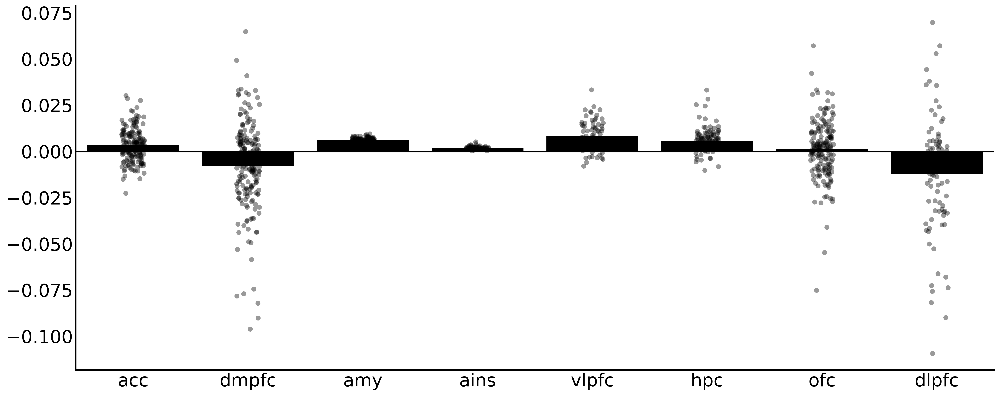

In [578]:
plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),dpi=400)

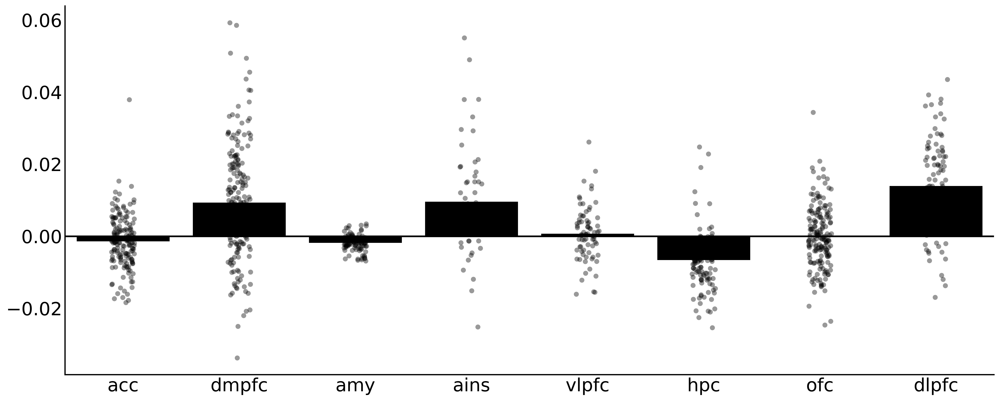

In [579]:
plot_roi_model_results(fit_results,'region_type','rpe_t1',figsize=(20,8),dpi=400)

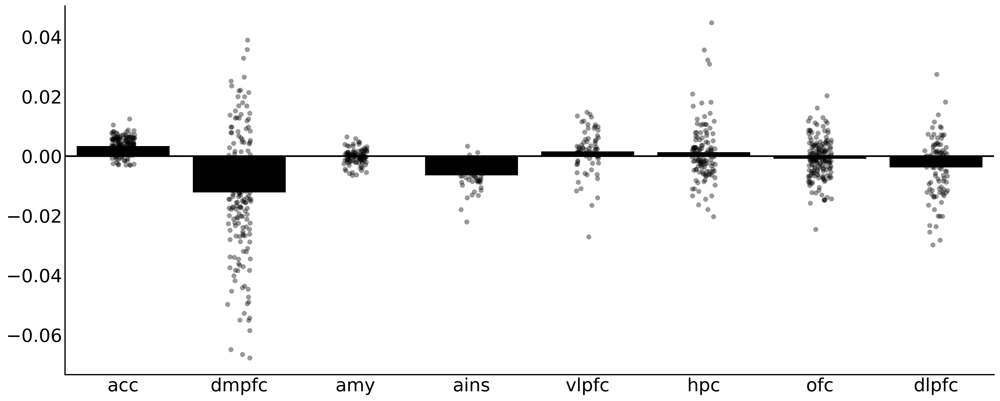

In [580]:
plot_roi_model_results(fit_results,'region_type','cpe_t1',figsize=(20,8),dpi=400)

In [581]:
# plot_roi_model_results(fit_results,'region_type','Profit_t1',figsize=(20,8),dpi=400)

In [481]:
# ylabel = fr'${band}_{{coh}} \sim mood$'
# # fig_save_dir = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/results/single-electrode-regressions/'
# fig_id = f'{band}_beta_mood_mlm_barplot.pdf'


# plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=save_dir,fig_id=fig_id,dpi=400)


# # plot_roi_model_results(fit_results,'region_type','cpe',bar_order = plot_pairs,figsize=(12,4),color='k')



In [482]:
# plot_roi_model_results(fit_results,'region_type','cpe_t1',figsize=(30,10),color='k')


In [483]:
# plot_roi_model_results(fit_results,'region_type','norm_mood:cpe_t1',figsize=(30,10),color='k')


# Mood Weights BDI Correlation

In [534]:
# # CHECK BDI CORRELATION

# rho_data = []
# sig_rho = []

# # BDI CORRELATIONS
# for roi in fit_results.region_type.unique().tolist():
#     temp_data = fit_results[fit_results.region_type==roi]
#     rho,rho_p     = pearsonr(temp_data.bdi,temp_data.band_pow)
# #     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
# #     print(f'{roi} pearsonr',rho,rho_p)
#     rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
# #     if rho_p <= bonferr_alpha:
# #         sig_bdi_rois.append(roi)
# #     if rho_p < bonferr_alpha:
#     if rho_p < 0.05:
#         sig_rho.append((roi,rho,rho_p))
#     print(f'{roi} pearsonr',rho,rho_p)
# rho_data = pd.concat(rho_data).reset_index(drop=True)


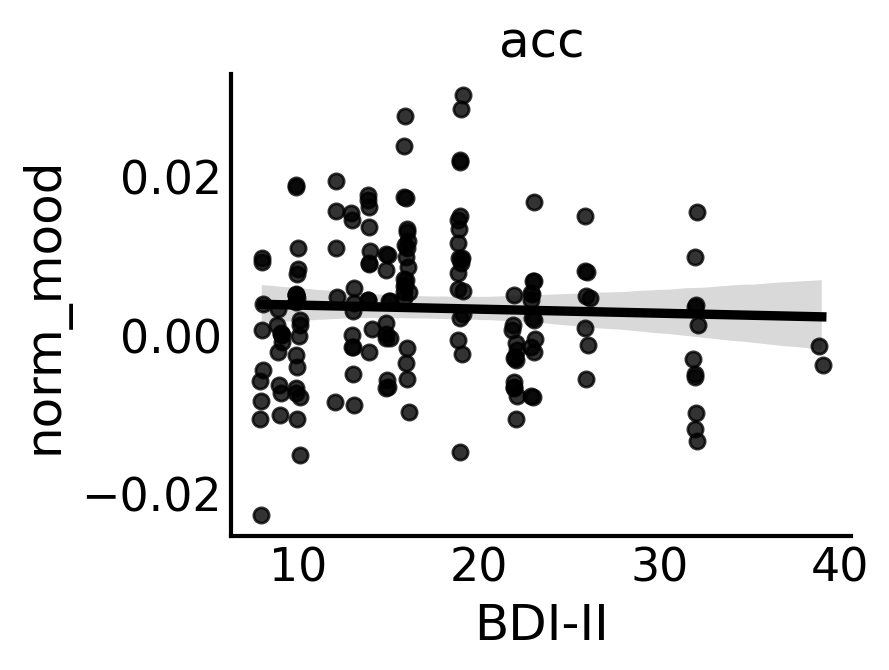

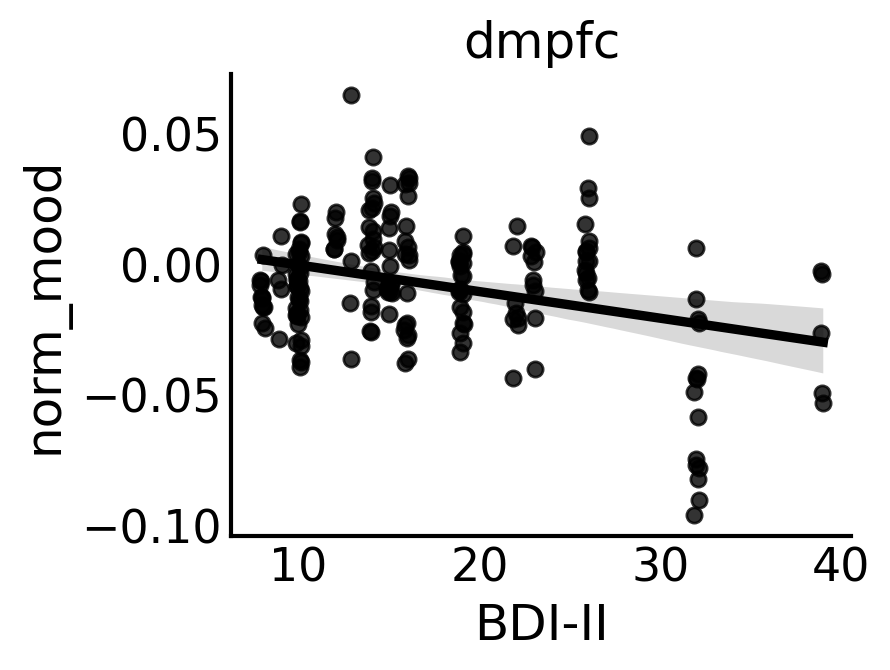

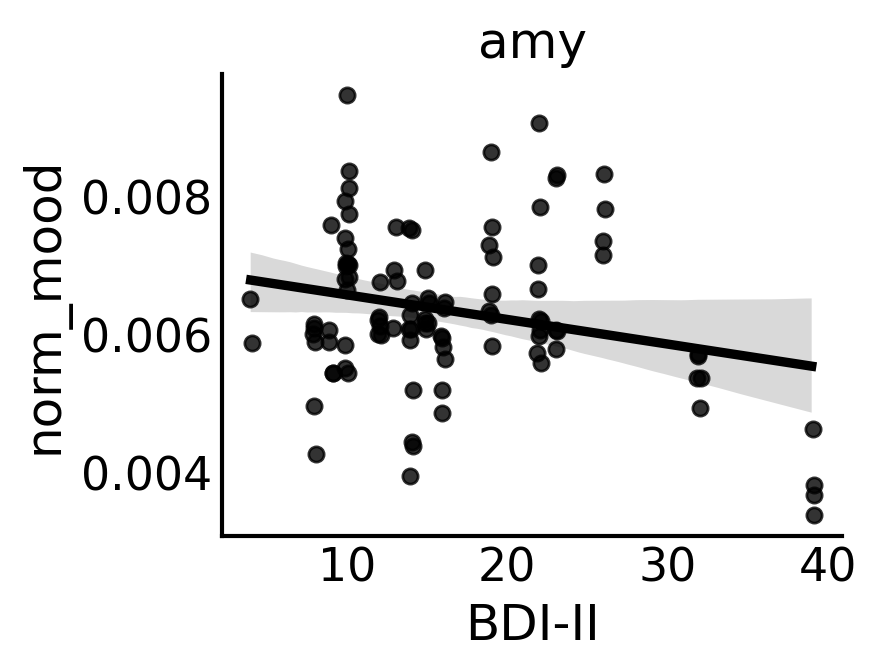

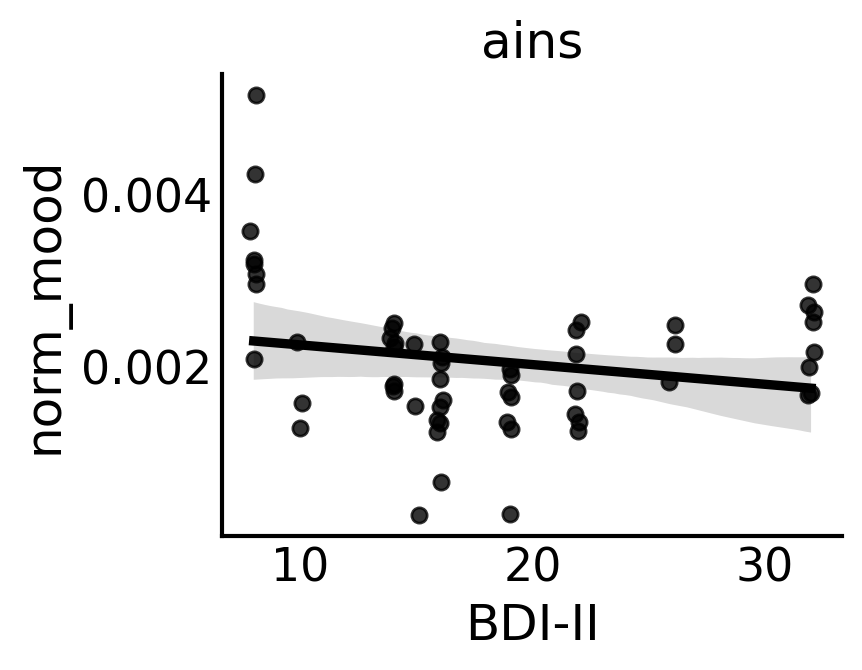

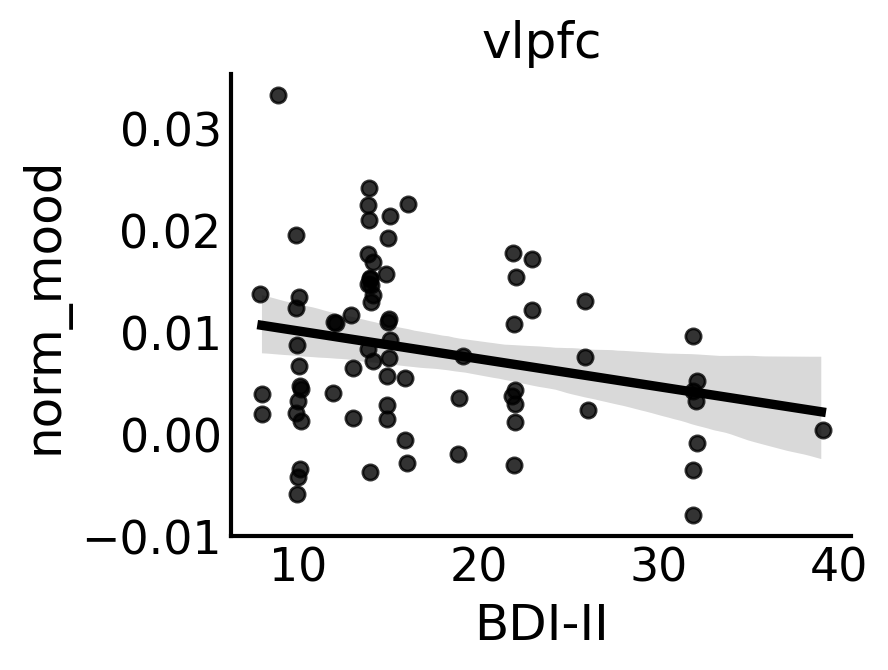

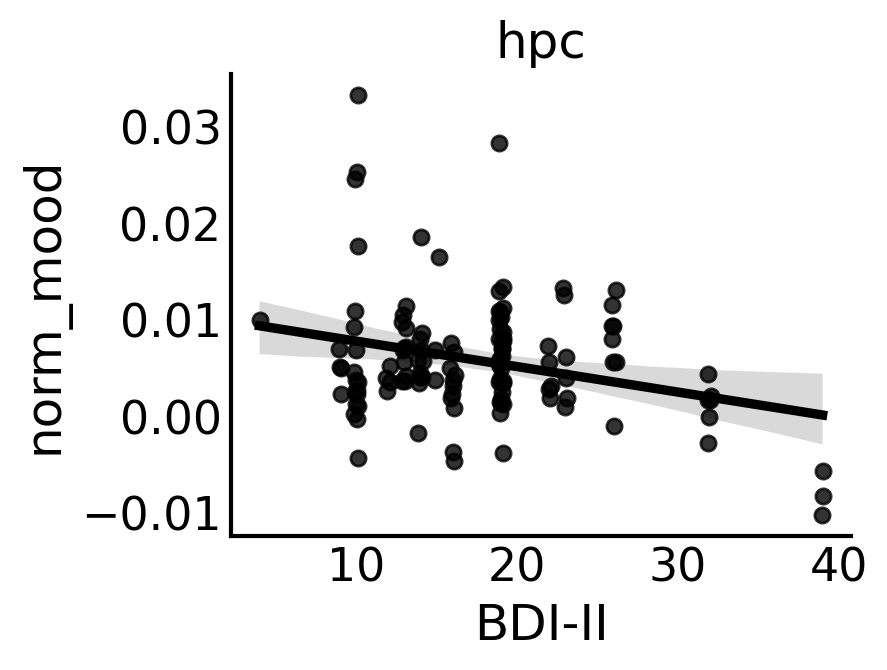

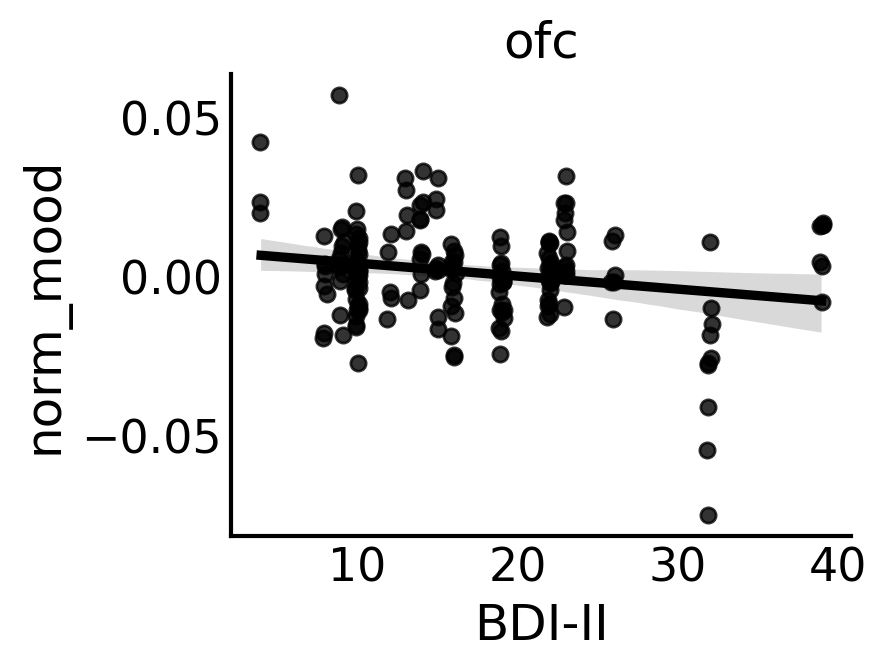

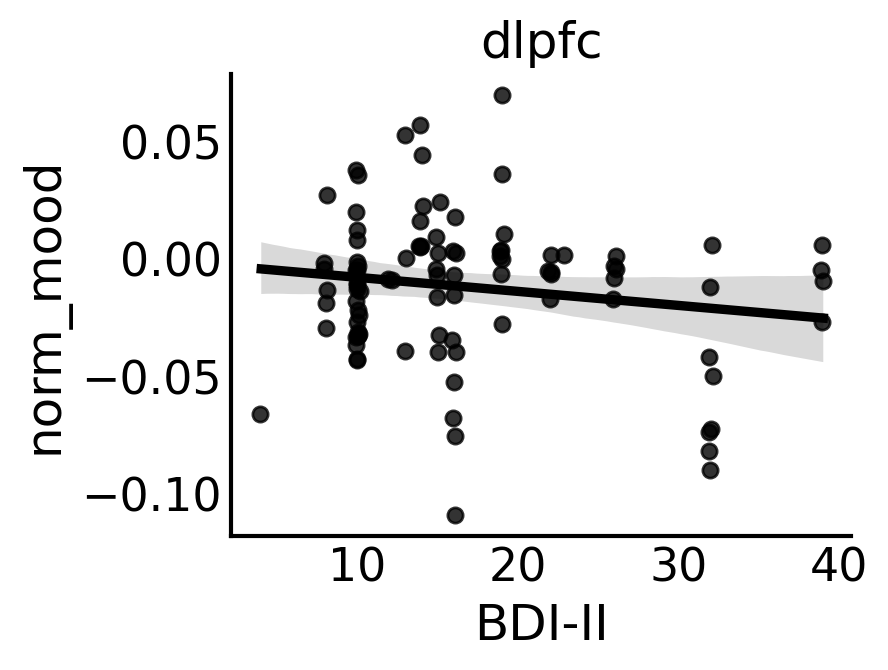

In [582]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [583]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:58:39                                         
No. Iterations:                    13                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.6282      0.530     31.393     

# CPE Weights BDI Correlation

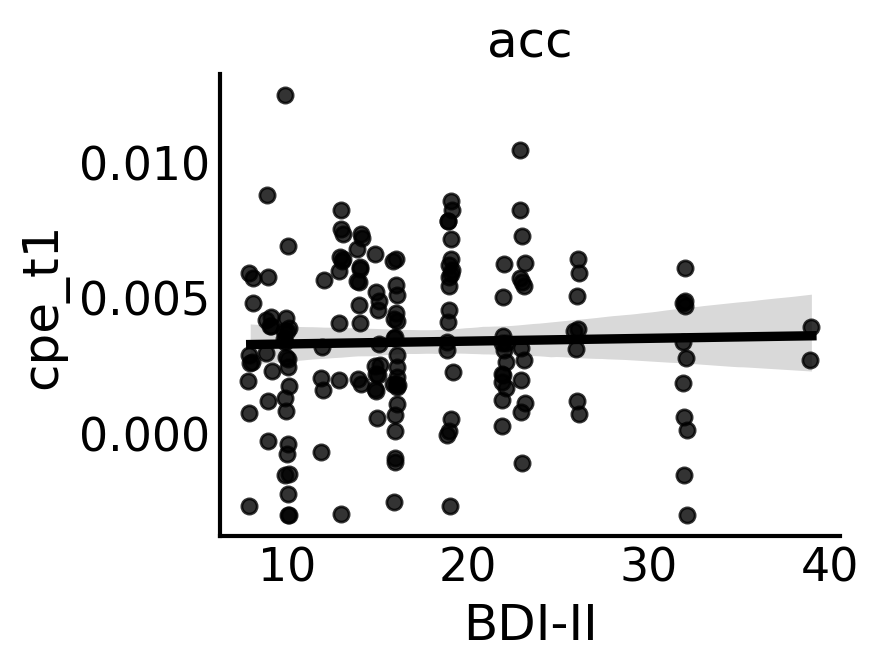

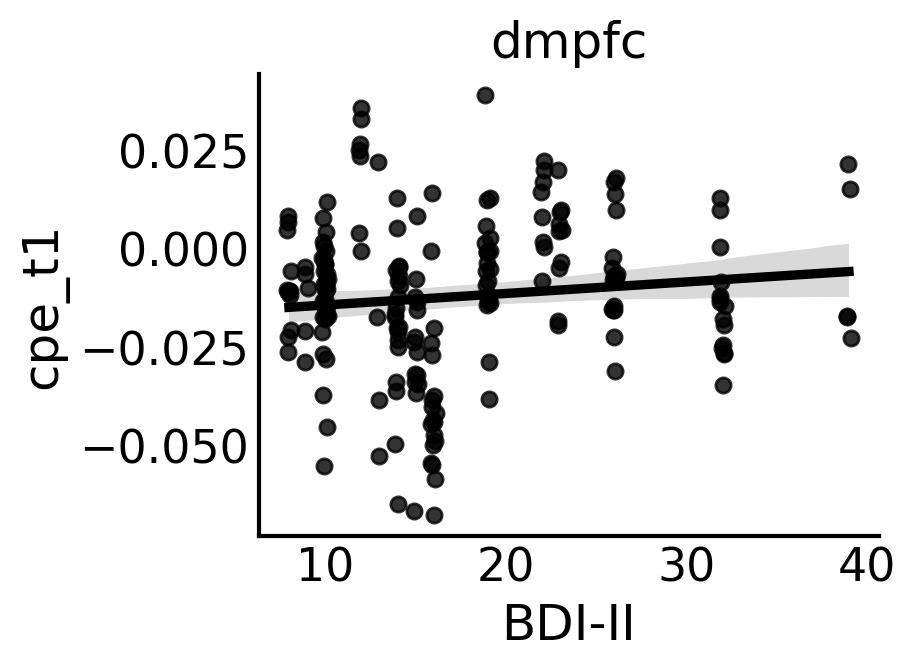

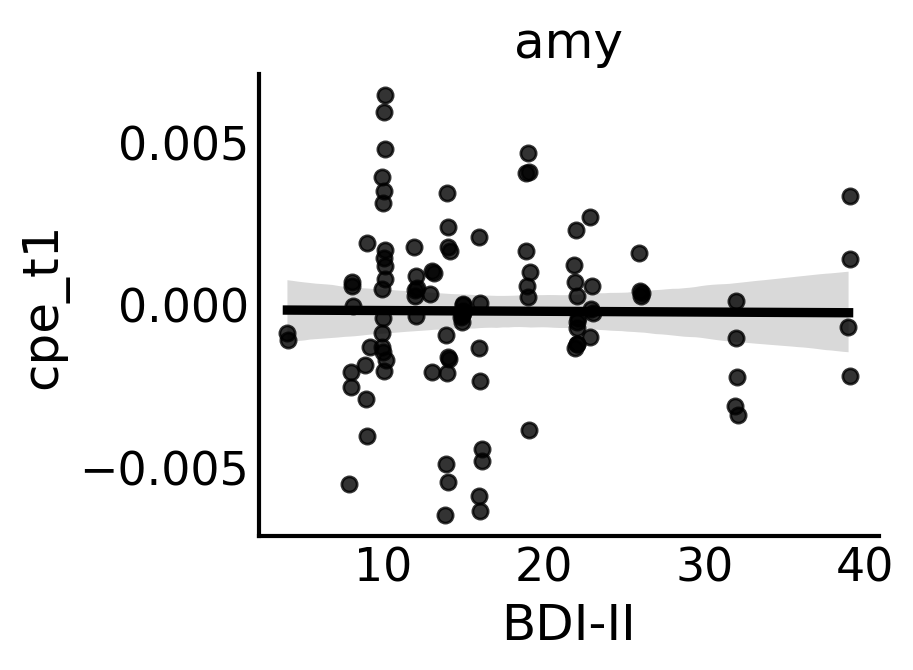

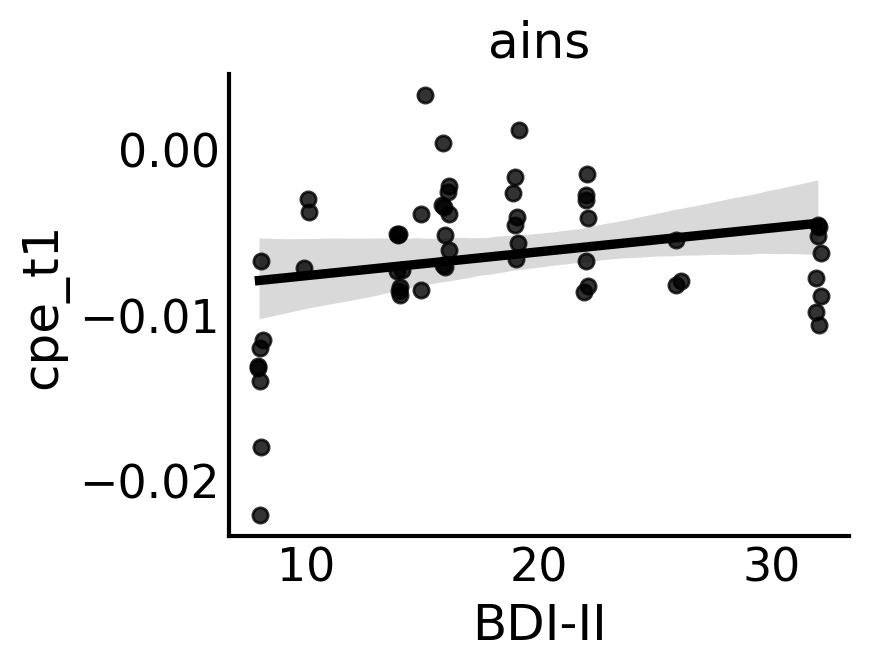

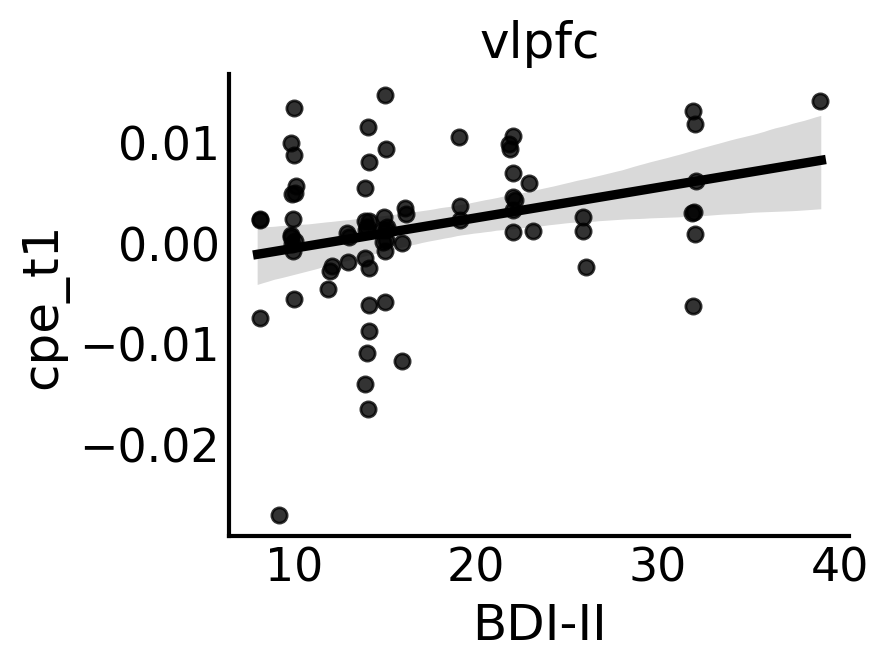

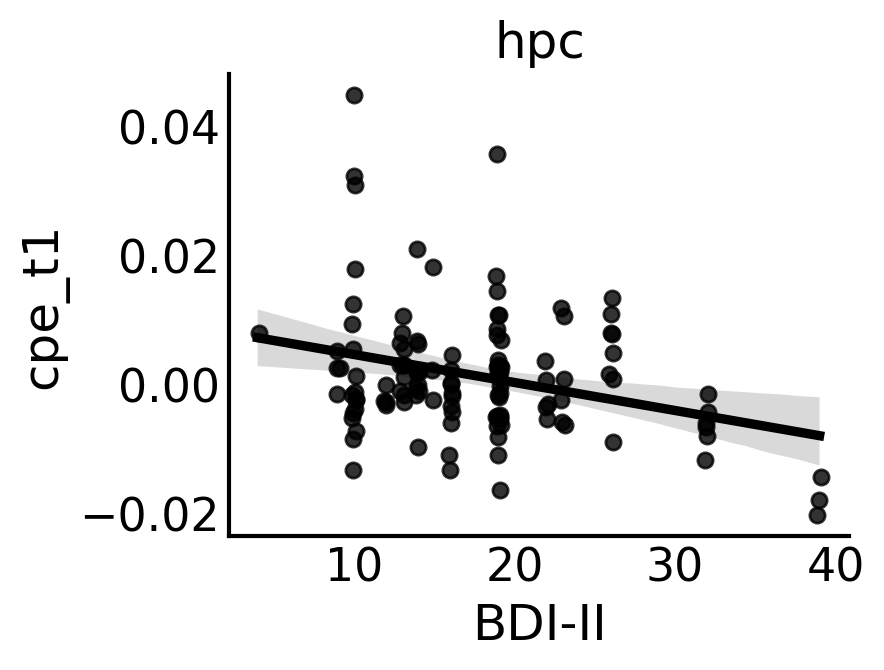

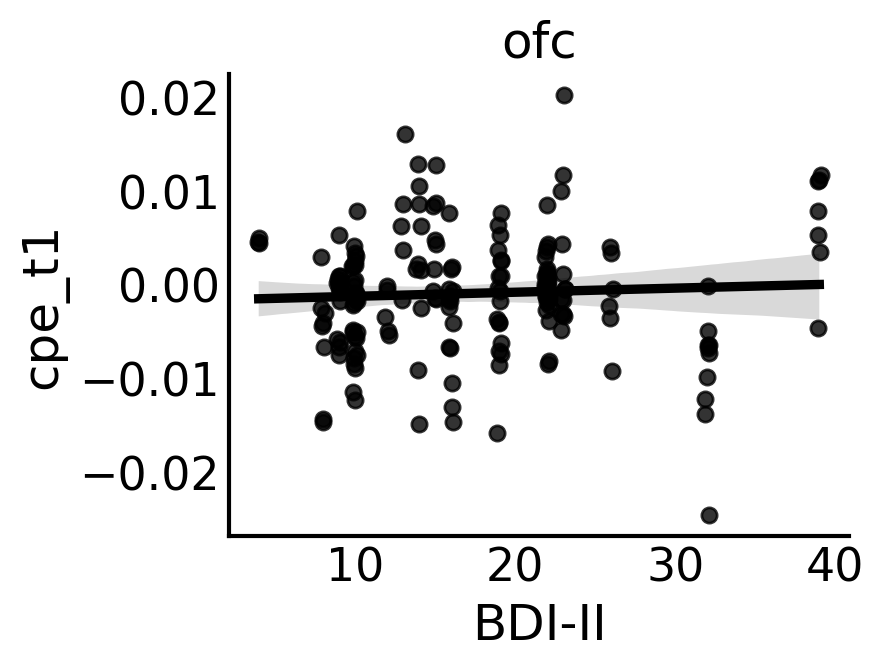

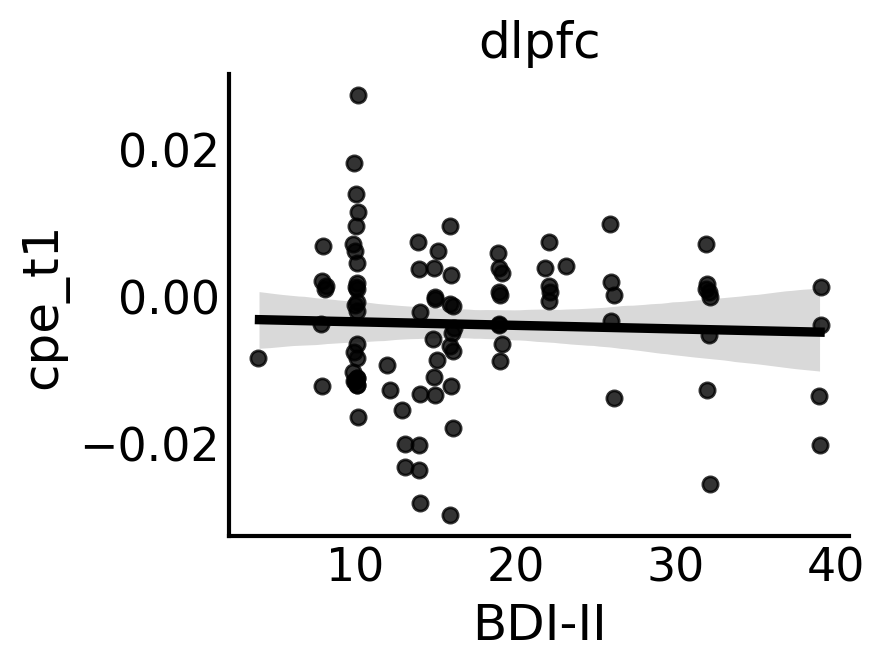

In [586]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [587]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:58:57                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.2421      0.766     21.217     

In [ ]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='rpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [566]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.rpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:57:22                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.6818      0.502     33.220     

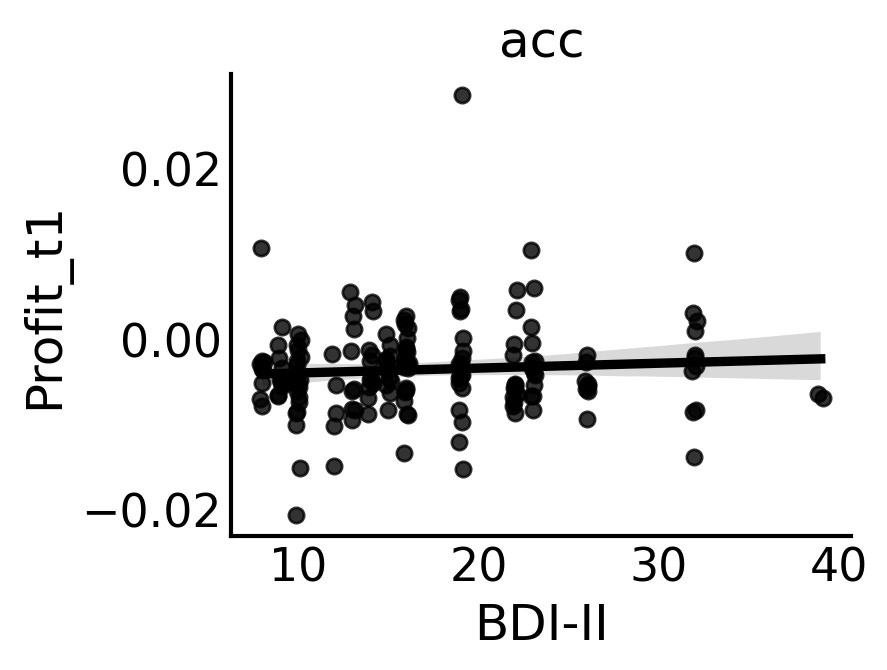

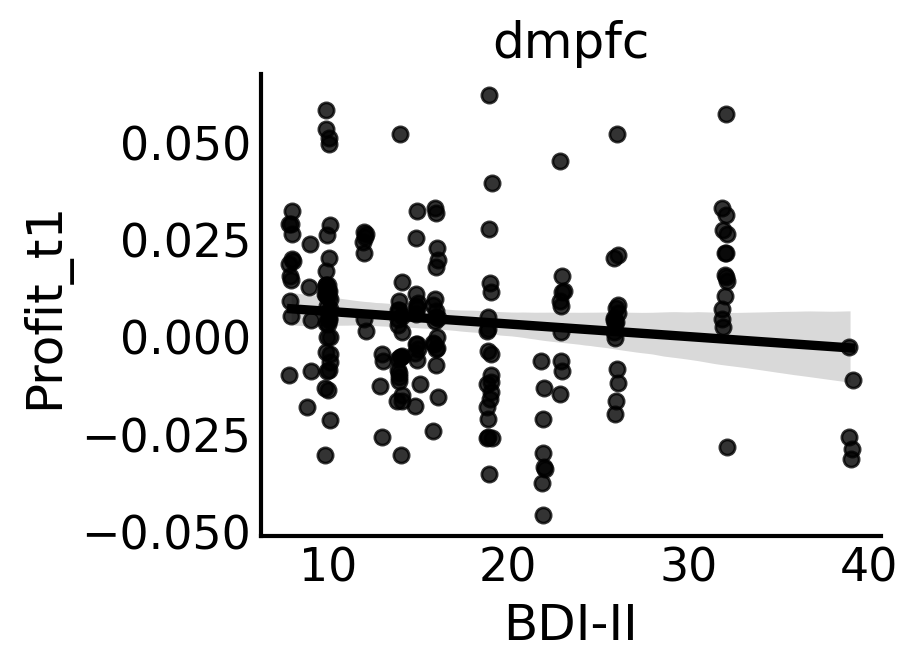

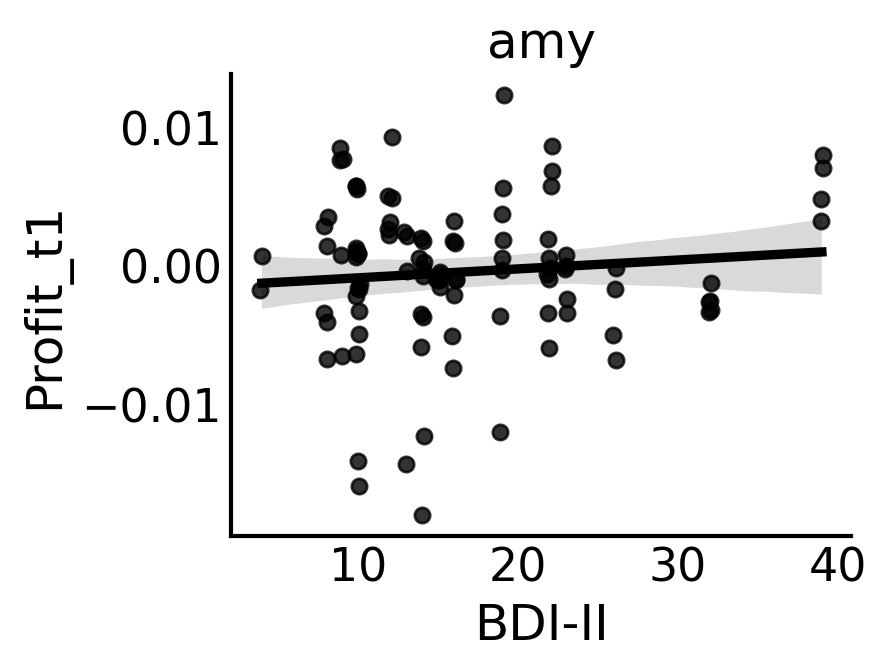

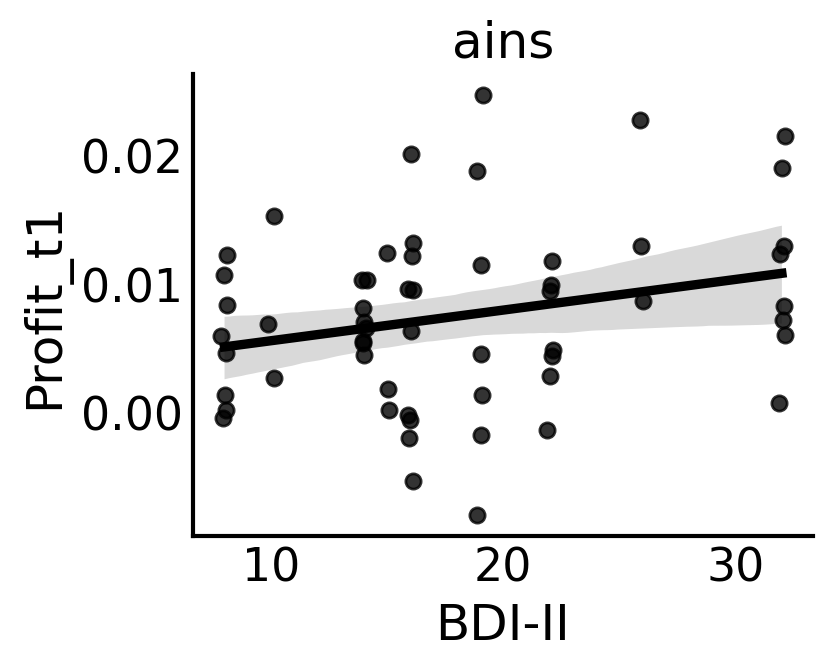

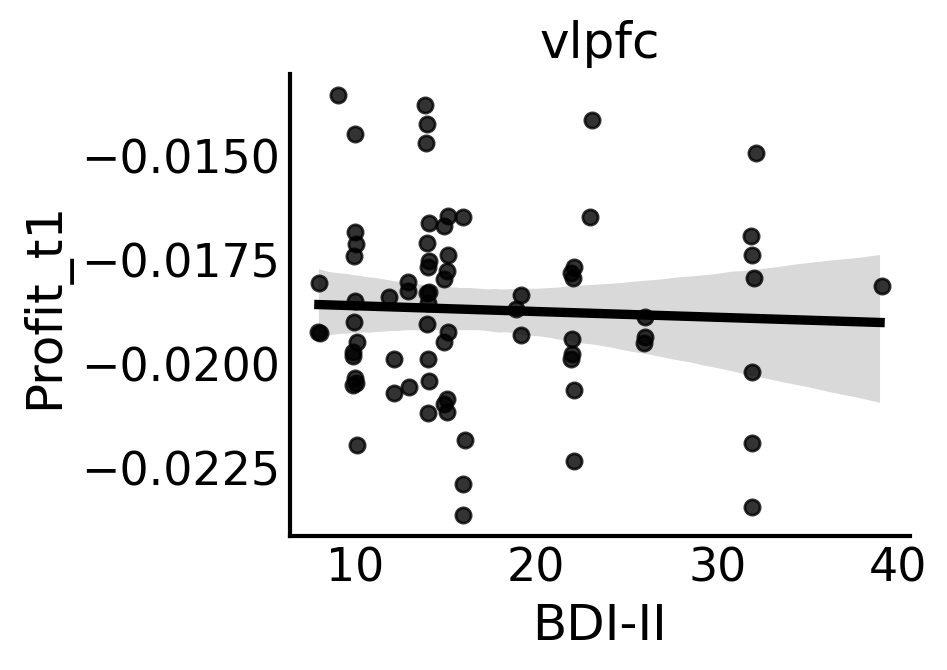

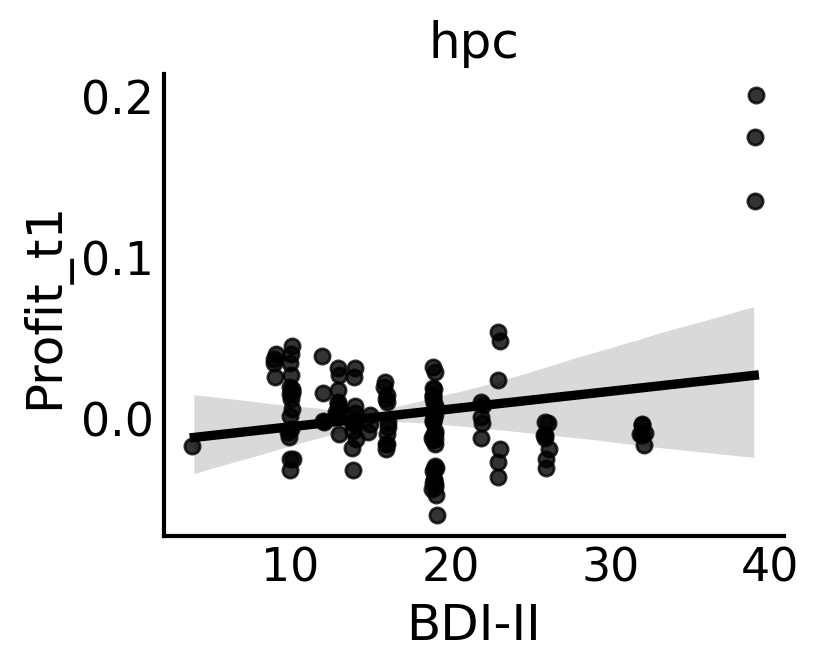

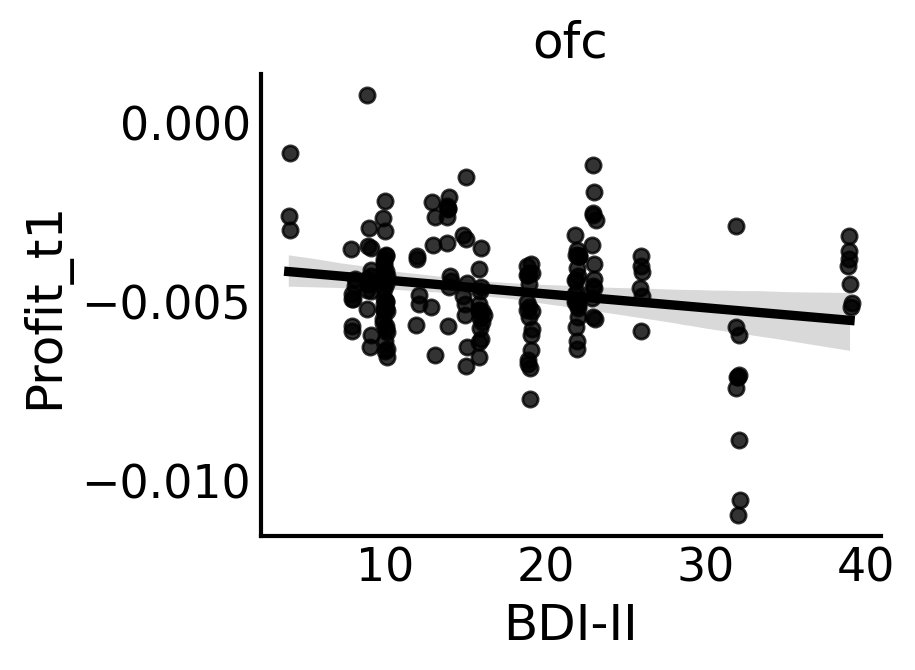

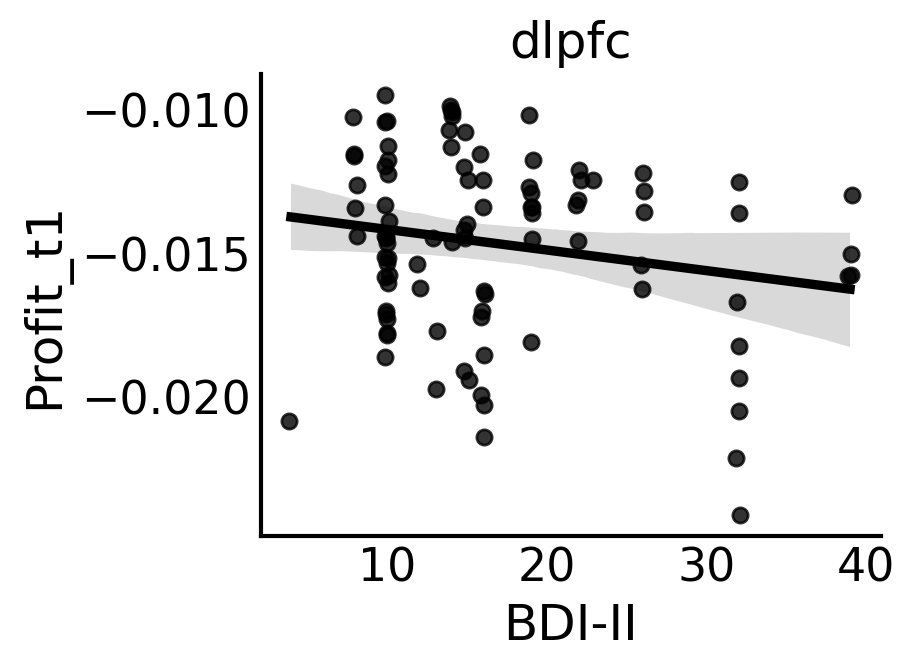

In [563]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='Profit_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [564]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.Profit_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:57:21                                         
No. Iterations:                    10                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.9404      0.590     28.728     

# Mood-CPE Interaction BDI Correlation

In [44]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data['norm_mood:cpe_t1'])
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.09907231329224214 0.20272845648748228
dmpfc pearsonr 0.37318234689723123 9.03683427352606e-08
amy pearsonr -0.23374646302998642 0.018055235636449677
ains pearsonr 0.20178323893404138 0.1322701837055427
vlpfc pearsonr 0.15575488995320594 0.182078981782021
hpc pearsonr -0.13918768643866927 0.12313531244545675
ofc pearsonr 0.09585812478550124 0.20179615804814274
pins pearsonr 0.015260929318013344 0.9094753749190291
dlpfc pearsonr 0.014769354672579185 0.8870358542696122


In [45]:
sig_rho

[('dmpfc', 0.37318234689723123, 9.03683427352606e-08),
 ('amy', -0.23374646302998642, 0.018055235636449677)]

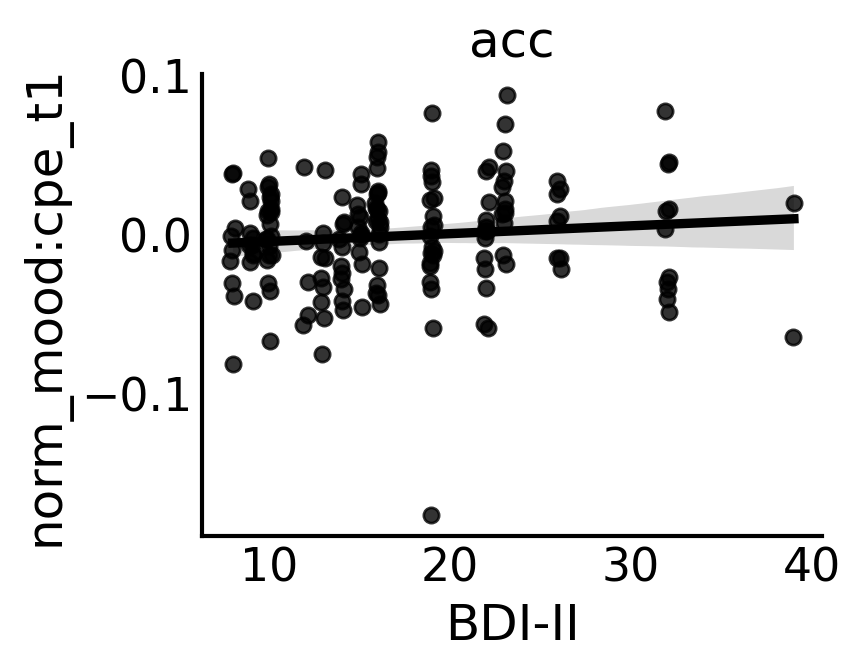

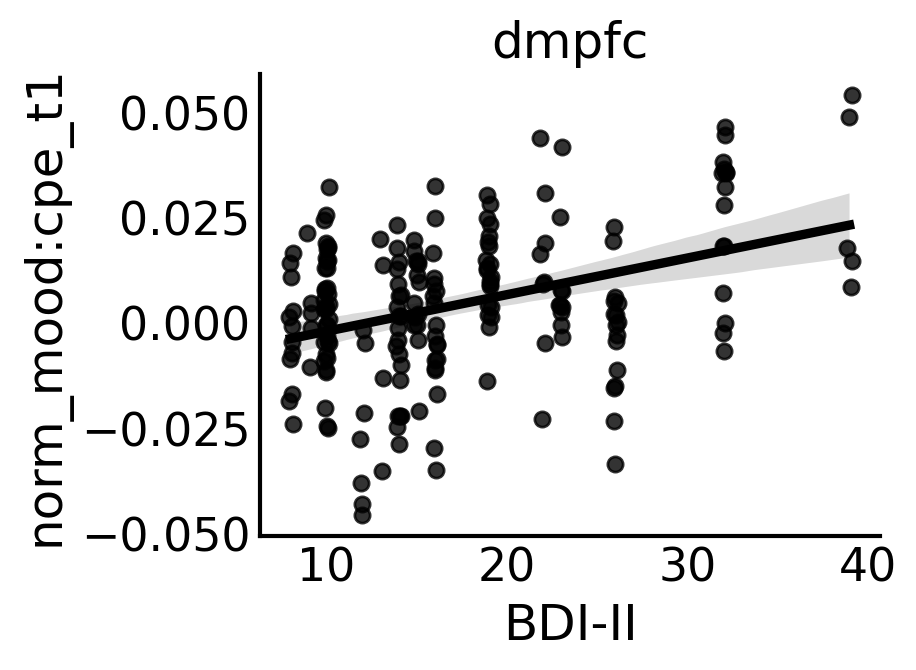

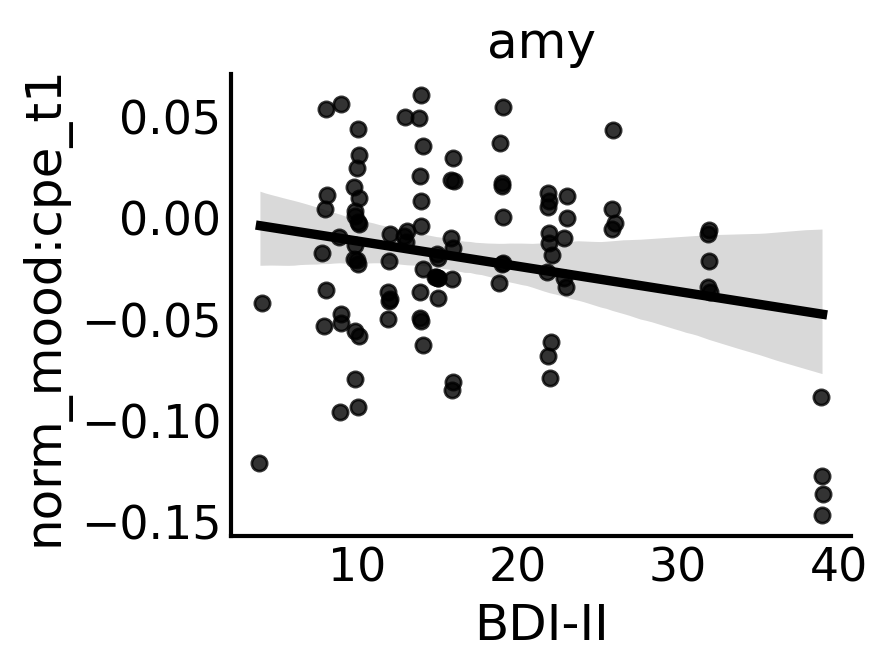

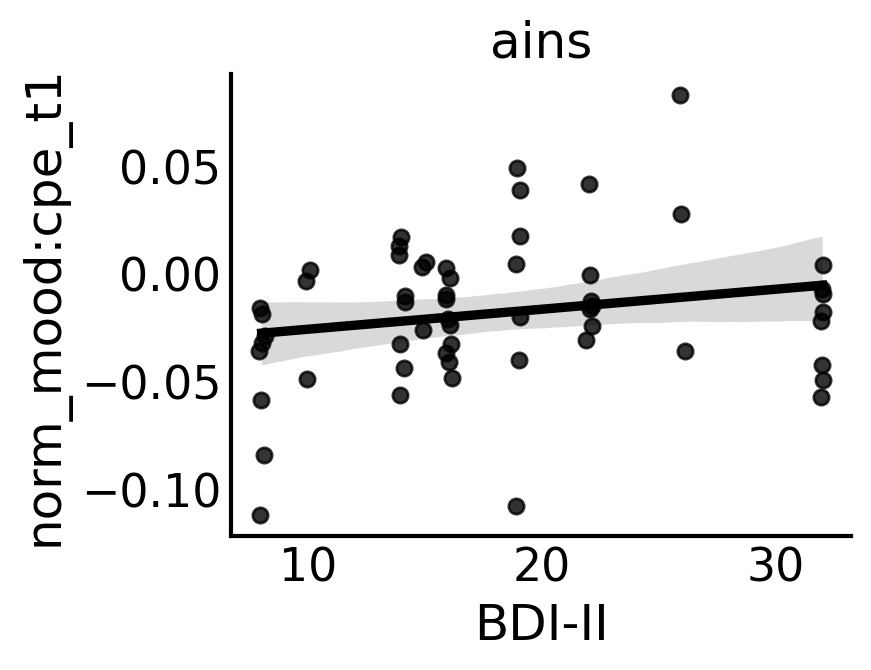

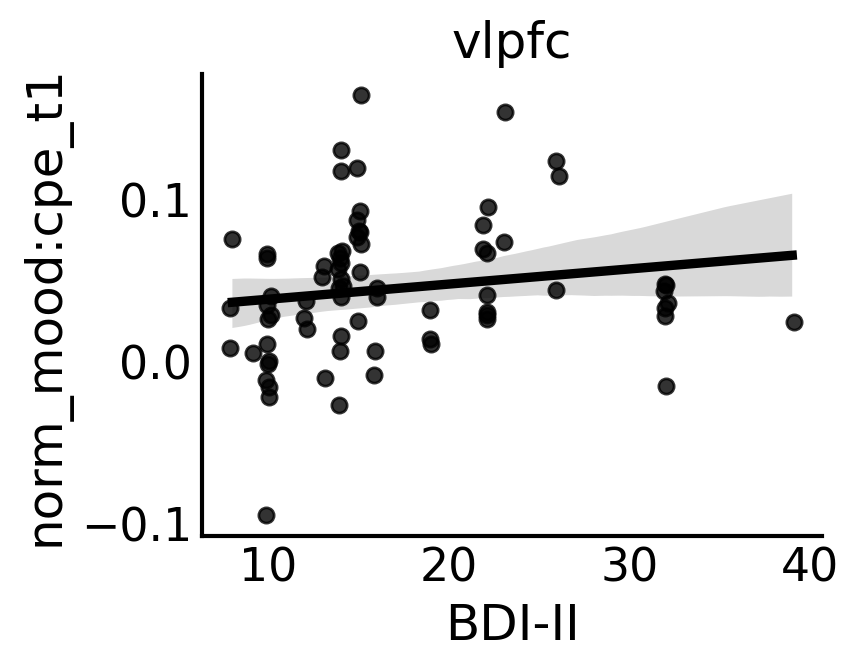

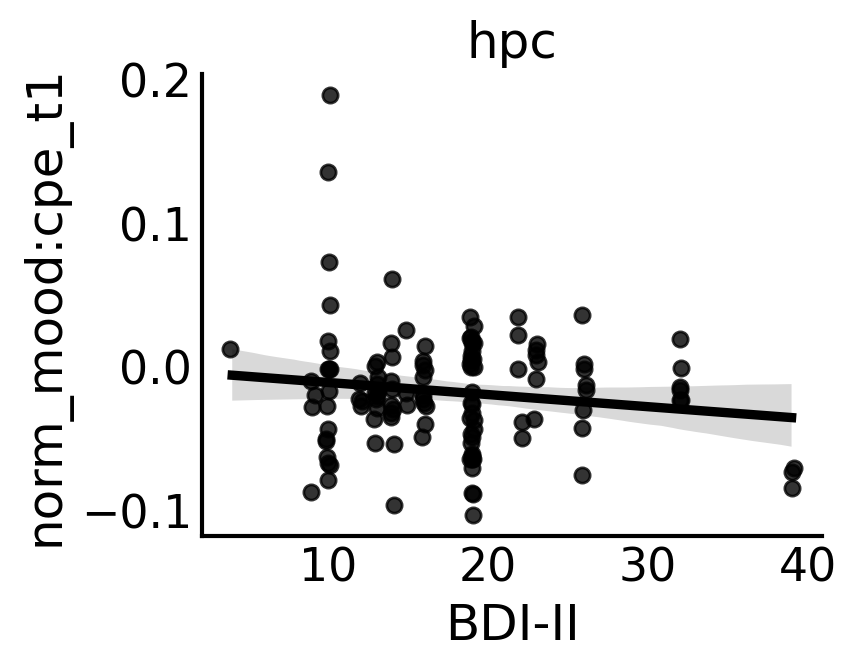

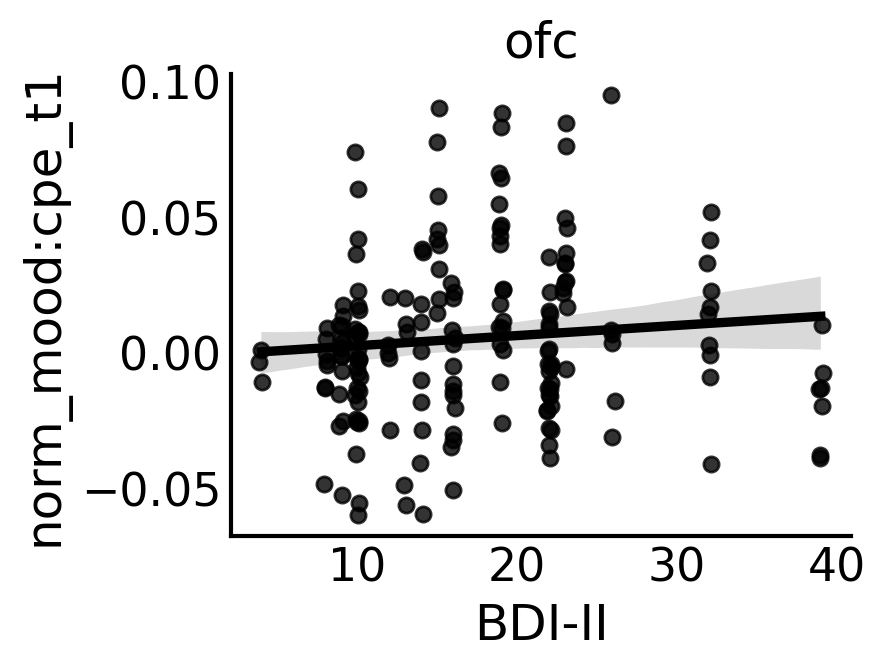

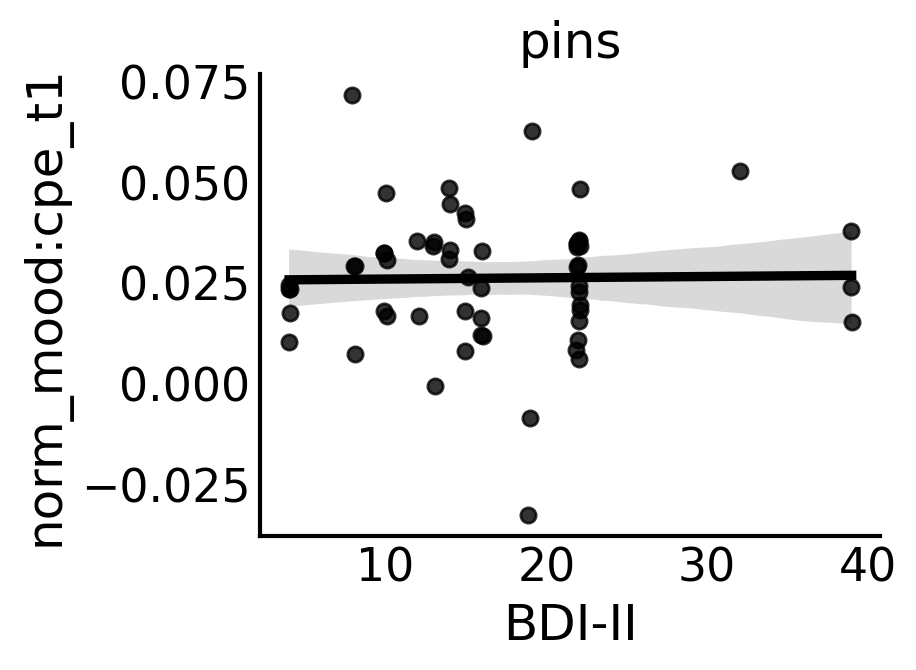

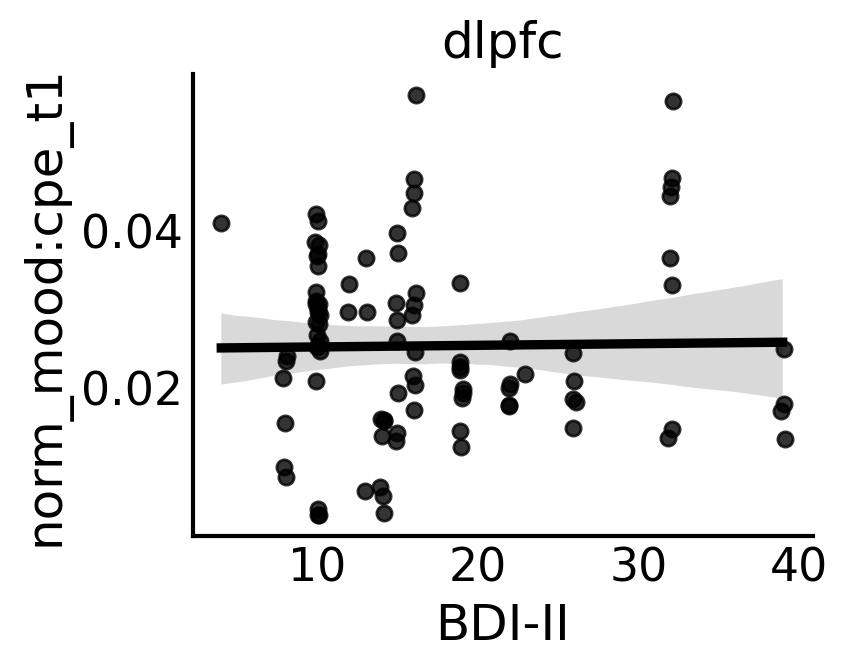

In [46]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood:cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [47]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df['norm_mood:cpe_t1'].values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:42:45                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5682      0.482     34.340     